In [183]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import numpy as np
import statsmodels.formula.api as smf
import statsmodels.api as sm
from scipy import stats
import warnings
warnings.filterwarnings('ignore')

In [184]:
# read in the data and display the first few rows.
data=pd.read_csv('WAGE2_2024_abridged.csv')
data.head(65)

,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc,lwage
0,769,40,93,35,12,11,2,31,1,0,0,1,1,2.0,8.0,8.0,6.645091
1,808,50,119,41,18,11,16,37,1,0,0,1,1,NaN,14.0,14.0,6.694562
2,825,40,108,46,14,11,9,33,1,0,0,1,1,2.0,14.0,14.0,6.715383
3,650,40,96,32,12,13,7,32,1,0,0,1,4,3.0,12.0,12.0,6.476973
4,562,40,74,27,11,14,5,34,1,0,0,1,10,6.0,6.0,11.0,6.331502
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
60,1748,55,123,48,17,10,7,36,1,0,0,1,1,1.0,12.0,12.0,7.466227
61,1151,40,98,34,12,12,12,29,1,0,0,1,3,4.0,12.0,8.0,7.048387
62,840,50,96,34,12,18,13,35,1,0,0,1,2,1.0,12.0,8.0,6.733402
63,978,45,89,47,12,17,2,38,1,0,0,1,0,1.0,12.0,NaN,6.885510


In [185]:
data.shape

(916, 17)

### Data Cleaning

In [186]:
data_clean = data.dropna()
data_clean.head(65)

,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc,lwage
0,769,40,93,35,12,11,2,31,1,0,0,1,1,2.0,8.0,8.0,6.645091
2,825,40,108,46,14,11,9,33,1,0,0,1,1,2.0,14.0,14.0,6.715383
3,650,40,96,32,12,13,7,32,1,0,0,1,4,3.0,12.0,12.0,6.476973
4,562,40,74,27,11,14,5,34,1,0,0,1,10,6.0,6.0,11.0,6.331502
6,600,40,91,24,10,13,0,30,0,0,0,1,1,2.0,8.0,8.0,6.396930
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
88,579,44,122,36,13,8,1,30,1,0,0,0,4,1.0,16.0,16.0,6.361302
90,2500,40,95,51,15,12,9,36,1,0,0,1,3,1.0,16.0,16.0,7.824046
91,1076,45,105,24,12,5,8,31,0,0,0,1,1,1.0,16.0,17.0,6.981006
92,750,40,94,18,12,16,3,37,1,1,0,1,7,3.0,8.0,8.0,6.620073


In [187]:
data_clean.shape

(655, 17)

### Comparing data before cleaning and after

In [188]:
data['wage'].describe().round(2)

count     916.00
mean      959.97
std       406.57
min       115.00
25%       670.00
50%       907.50
75%      1161.00
max      3078.00
Name: wage, dtype: float64

In [189]:
data_clean['wage'].describe().round(2)

count     655.00
mean      988.34
std       407.90
min       115.00
25%       699.00
50%       935.00
75%      1200.00
max      3078.00
Name: wage, dtype: float64

In [190]:
stats.describe(data['wage'])

DescribeResult(nobs=916, minmax=(115, 3078), mean=959.9672489082969, variance=165301.71040160354, skewness=1.1930936749362455, kurtosis=2.65704730348772)

In [191]:
stats.describe(data_clean['wage'])

DescribeResult(nobs=655, minmax=(115, 3078), mean=988.3404580152671, variance=166384.93742792442, skewness=1.1545444687451614, kurtosis=2.400827882723674)

#### Histogram Before and After

Text(0.5, 1.0, 'Histogram of Wage(Before Data Cleaning)')

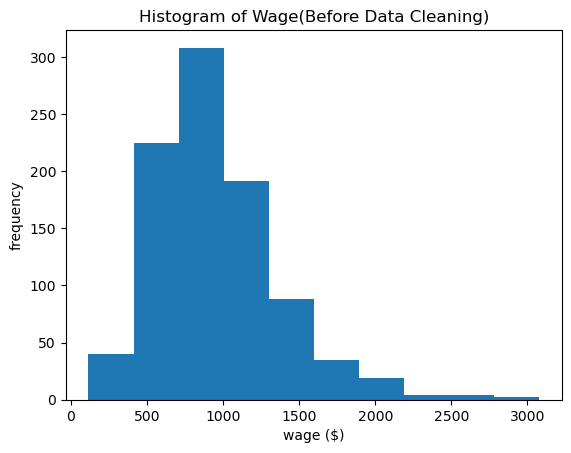

In [192]:
histogram = plt.hist(data['wage'])
plt.xlabel('wage ($)');plt.ylabel('frequency')
plt.title('Histogram of Wage(Before Data Cleaning)')

Text(0.5, 1.0, 'Histogram of Wage(After Data Cleaning)')

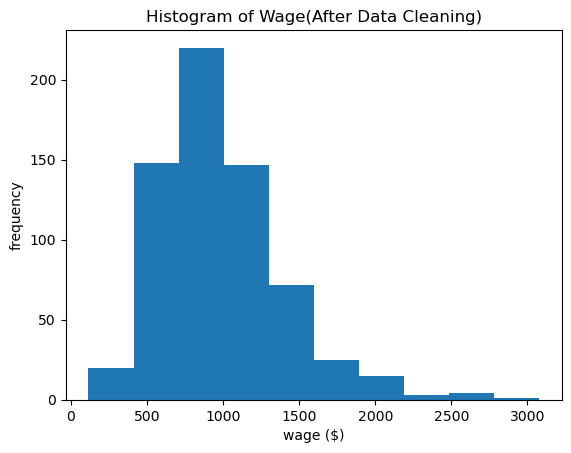

In [193]:
histogram = plt.hist(data_clean['wage'])
plt.xlabel('wage ($)');plt.ylabel('frequency')
plt.title('Histogram of Wage(After Data Cleaning)')

#### Boxplot Before and After

Text(0.5, 1.0, 'Boxplot of Wage(Before Data Cleaning)')

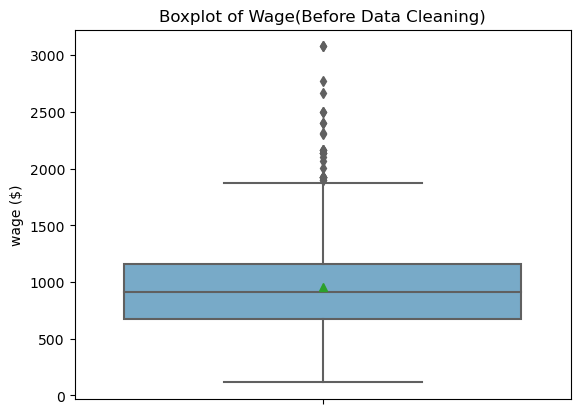

In [12]:
boxplot=sns.boxplot(y='wage', data=data, palette='Blues', showmeans=True)
plt.ylabel('wage ($)')
plt.title('Boxplot of Wage(Before Data Cleaning)')

Text(0.5, 1.0, 'Boxplot of Wage(After Data Cleaning)')

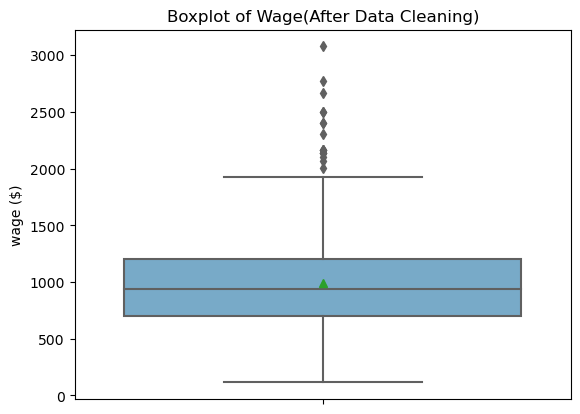

In [13]:
boxplot=sns.boxplot(y='wage', data=data_clean, palette='Blues', showmeans=True)
plt.ylabel('wage ($)')
plt.title('Boxplot of Wage(After Data Cleaning)')

#### Conclusion
- Difference between distribution of data before and after cleaning is not significant (compare max&min&mean...
- Number of samples change

#### Splitting data

In [14]:
# Splitting training and test sets

state=2621356817 # replace this number with the sum of the student IDs for the members of your group

train = data_clean.sample(frac=0.8, random_state=state)
test = data_clean[data_clean.index.isin(train.index)==False].copy() # Only for prediction

train=train.reset_index(drop=True)
test=test.reset_index(drop=True)

In [15]:
train.head()

,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc,lwage
0,377,40,83,32,12,9,1,36,0,0,1,1,1,1.0,12.0,12.0,5.932245
1,1200,40,79,32,17,9,9,32,1,0,0,1,0,1.0,8.0,8.0,7.090077
2,1175,45,111,38,12,17,14,34,1,0,0,1,0,1.0,16.0,4.0,7.069024
3,528,55,116,40,18,5,9,30,1,0,0,1,4,5.0,12.0,12.0,6.269096
4,808,40,97,37,16,10,7,29,1,0,0,1,3,3.0,9.0,12.0,6.694562


In [16]:
train.shape

(524, 17)

In [17]:
test.head()

,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc,lwage
0,825,40,108,46,14,11,9,33,1,0,0,1,1,2.0,14.0,14.0,6.715383
1,650,40,96,32,12,13,7,32,1,0,0,1,4,3.0,12.0,12.0,6.476973
2,600,40,91,24,10,13,0,30,0,0,0,1,1,2.0,8.0,8.0,6.396930
3,1000,40,95,44,12,16,16,36,1,0,0,1,1,1.0,12.0,11.0,6.907755
4,930,43,132,44,18,8,13,38,1,0,0,0,1,1.0,13.0,14.0,6.835185


In [18]:
test.shape

(131, 17)

## Task 1:
**Conduct exploratory analysis on the dataset which is relevant to the goals of this study**

In [19]:
train['wage'].describe().round(2)

count     524.00
mean      998.08
std       415.25
min       115.00
25%       700.00
50%       948.50
75%      1200.00
max      2771.00
Name: wage, dtype: float64

In [20]:
stats.describe(train['wage'])

DescribeResult(nobs=524, minmax=(115, 2771), mean=998.0801526717557, variance=172435.93237779694, skewness=1.0528847584880687, kurtosis=1.6639059728260088)

Text(0.5, 1.0, 'Histogram of Monthly Wage(Train Data)')

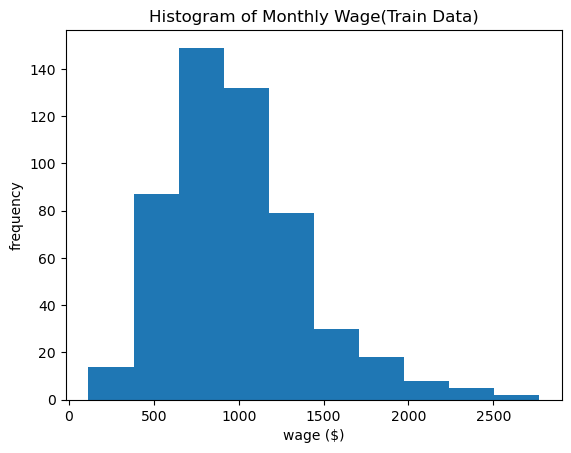

In [21]:
histogram = plt.hist(train['wage'])
plt.xlabel('wage ($)');plt.ylabel('frequency')
plt.title('Histogram of Monthly Wage(Train Data)')

Text(0.5, 1.0, 'Boxplot of Monthly Wage(Train Data)')

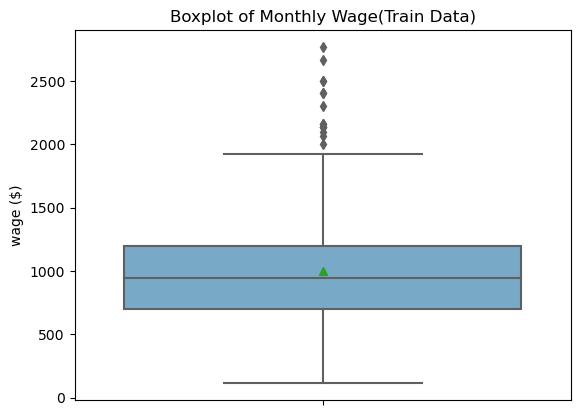

In [22]:
boxplot=sns.boxplot(y='wage', data=train, palette='Blues', showmeans=True)
plt.ylabel('wage ($)')
plt.title('Boxplot of Monthly Wage(Train Data)')

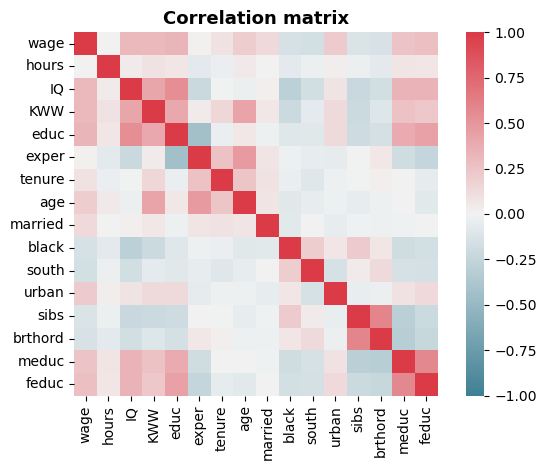

In [23]:
fig, ax = plt.subplots()
variables=['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc']
cmap = sns.diverging_palette(220, 10, as_cmap=True) #color map
sns.heatmap(train[variables].corr(), vmax=1, vmin=-1, center=0, square=True, ax=ax, cmap=cmap) 
ax.set_title('Correlation matrix', fontweight='bold', fontsize=13)
plt.tight_layout()

In [24]:
train[variables].corr().round(2)

,wage,hours,IQ,KWW,educ,exper,tenure,age,married,black,south,urban,sibs,brthord,meduc,feduc
wage,1.00,0.01,0.31,0.31,0.34,0.01,0.09,0.20,0.13,-0.15,-0.17,0.21,-0.12,-0.14,0.25,0.28
hours,0.01,1.00,0.04,0.09,0.07,-0.07,-0.03,0.05,0.01,-0.08,-0.03,0.03,-0.02,-0.08,0.08,0.06
IQ,0.31,0.04,1.00,0.42,0.53,-0.21,-0.01,-0.03,0.02,-0.29,-0.17,0.08,-0.22,-0.17,0.34,0.34
KWW,0.31,0.09,0.42,1.00,0.40,0.04,0.16,0.43,0.06,-0.21,-0.07,0.13,-0.21,-0.11,0.26,0.23
educ,0.34,0.07,0.53,0.40,1.00,-0.43,-0.03,0.06,-0.02,-0.10,-0.09,0.13,-0.19,-0.16,0.39,0.43
exper,0.01,-0.07,-0.21,0.04,-0.43,1.00,0.26,0.47,0.07,-0.02,-0.05,-0.06,0.00,0.06,-0.18,-0.25
tenure,0.09,-0.03,-0.01,0.16,-0.03,0.26,1.00,0.24,0.09,-0.03,-0.10,-0.02,-0.01,0.02,0.01,-0.06
age,0.20,0.05,-0.03,0.43,0.06,0.47,0.24,1.00,0.07,-0.09,-0.05,-0.02,-0.05,-0.02,0.00,-0.08
married,0.13,0.01,0.02,0.06,-0.02,0.07,0.09,0.07,1.00,-0.08,0.01,-0.05,-0.01,-0.02,-0.01,0.01
black,-0.15,-0.08,-0.29,-0.21,-0.10,-0.02,-0.03,-0.09,-0.08,1.00,0.20,0.07,0.22,0.07,-0.18,-0.17


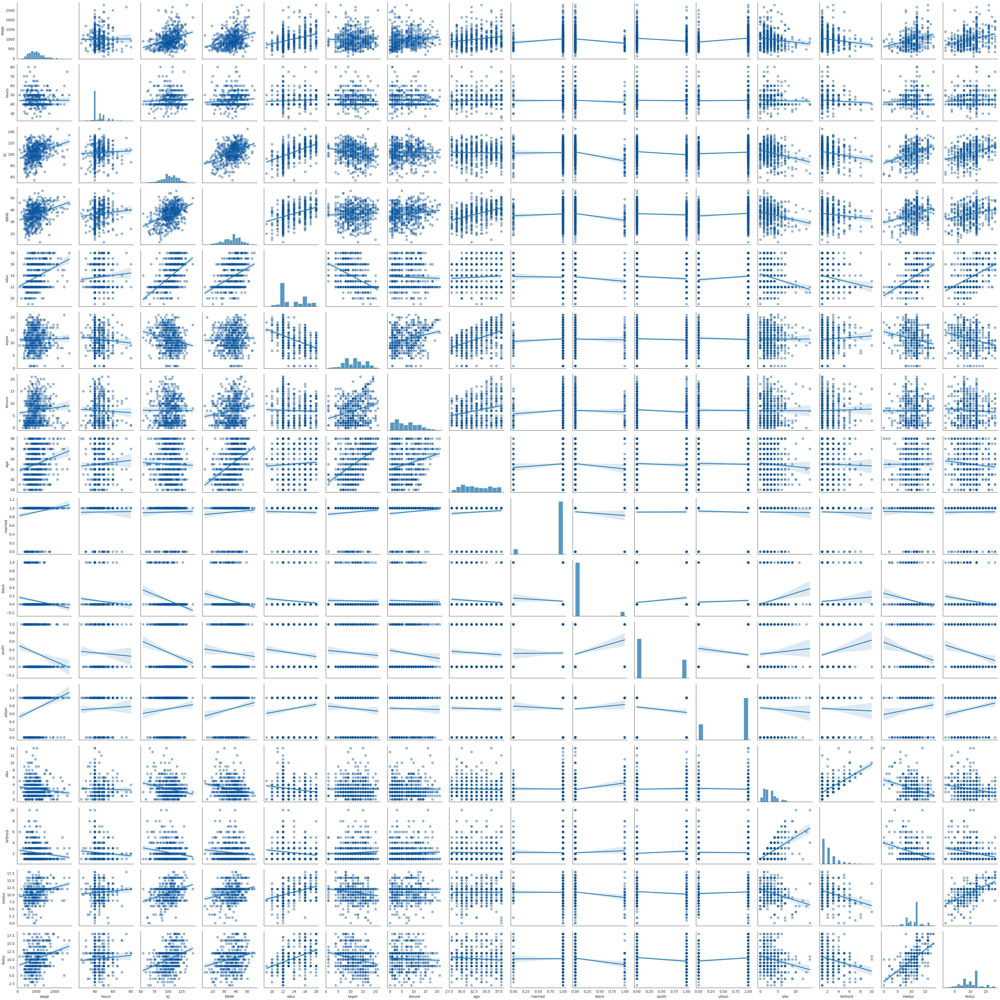

In [25]:
variables=['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc']
with sns.axes_style('white'):
    g=sns.pairplot(train[variables], kind='reg',
                    plot_kws={'scatter_kws' :{'color': sns.color_palette('Blues')[-1], 'alpha': 0.4}})
plt.tight_layout()

## Question 2:

**Analyse the relationship between educ and exper, and wage**

In [26]:
variables = ['wage', 'educ', 'exper']
data2 = train[variables]

In [27]:
data2.shape

(524, 3)

In [28]:
#The MLR model
model = smf.ols(formula='wage ~ educ + exper ', data=data2)
reg = model.fit()
reg.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.143
Model:                            OLS   Adj. R-squared:                  0.139
Method:                 Least Squares   F-statistic:                     43.30
Date:                Wed, 22 May 2024   Prob (F-statistic):           4.01e-18
Time:                        20:51:32   Log-Likelihood:                -3861.9
No. Observations:                 524   AIC:                             7730.
Df Residuals:                     521   BIC:                             7743.
Df Model:                           2                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -295.9570    146.285     -2.023      0.044    -583.338      -8.576
educ          78.4469      8.433      9.302      0.000      61.880      95.014
exper         19.0792      4.461      4.277      0.000      10.315      27.843
==============================================================================
Omnibus:                       96.119   Durbin-Watson:                   1.883
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              183.965
Skew:                           1.036   Prob(JB):                     1.13e-40
Kurtosis:                       5.033   Cond. No.                         157.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

**Add interpretation of the betas(e.g.one unit increase in ...is associated with an average increase of...)**

In [29]:
# RSE
reg.mse_resid**0.5

385.26145137924453

**Is multicollinearity an issue in the MLR model?**

In [30]:
train[['educ', 'exper']].corr()

,educ,exper
educ,1.000000,-0.434877
exper,-0.434877,1.000000


In [31]:
1/(1-(-0.442997)**2) 

1.244162300299226

**Add interpretation: VIF is 1.244, which is not a large number,usual threshold for the presence of a multicollinearity problem is 5.**

In [32]:
resid=reg.resid
fit=reg.fittedvalues

Text(0.5, 0.98, 'MLR Residual Plot (Predicted Wage vs Residual)')

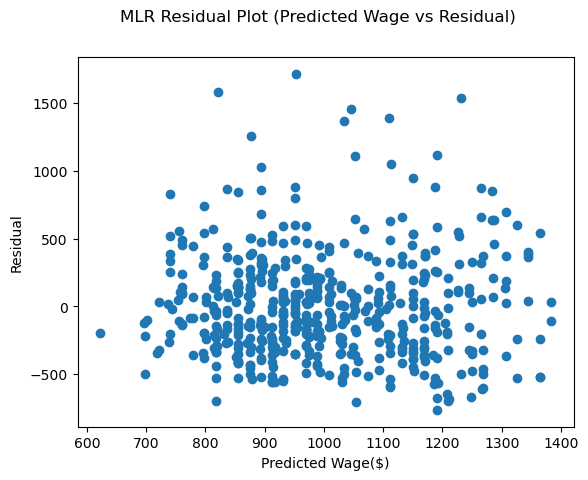

In [33]:
plt.scatter(fit,resid)
plt.xlabel('Predicted Wage($)')
plt.ylabel('Residual')
plt.suptitle('MLR Residual Plot (Predicted Wage vs Residual)')

- no clear pattern
- some outliers
- assess with the help of lowess curve later

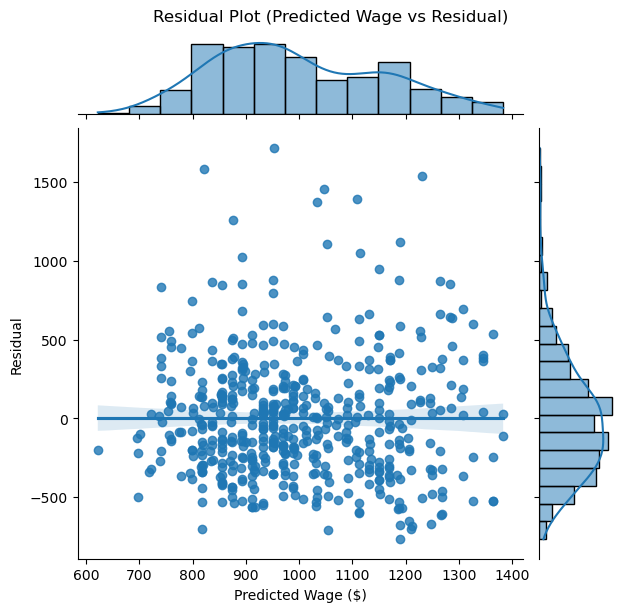

In [34]:
sns.jointplot(x=fit, y=resid, kind="reg")
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.subplots_adjust(top= 0.93)
plt.suptitle('Residual Plot (Predicted Wage vs Residual)')
plt.show()

- average is 0
- check with lowess again to see the impact of outliers
- no pattern

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Residual vs. Predicted Wage)')

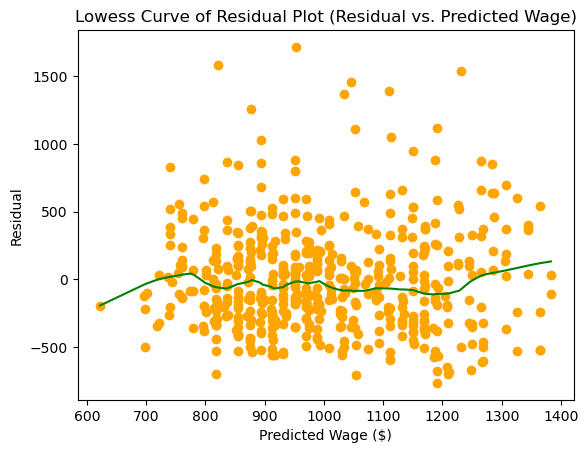

In [35]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fit,resid, color='orange')
z1 = lowess(resid, fit, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Residual vs. Predicted Wage)')

- average close to 0 apart from the impact of outliers(but not a big problem)
- no clear trend or pattern

Text(0.5, 1.0, 'Squared Residual Plot (Squared Residual vs. Predicted Wage)')

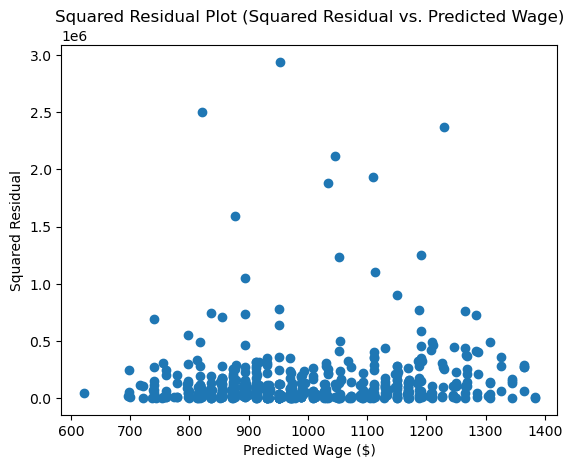

In [36]:
resid_squared=resid**2
plt.scatter(fit,resid_squared)
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Squared Residual')
plt.title('Squared Residual Plot (Squared Residual vs. Predicted Wage)')

- except some outliers, the overall variance seem constant
- homo (LSA6)

Text(0, 0.5, 'Residual')

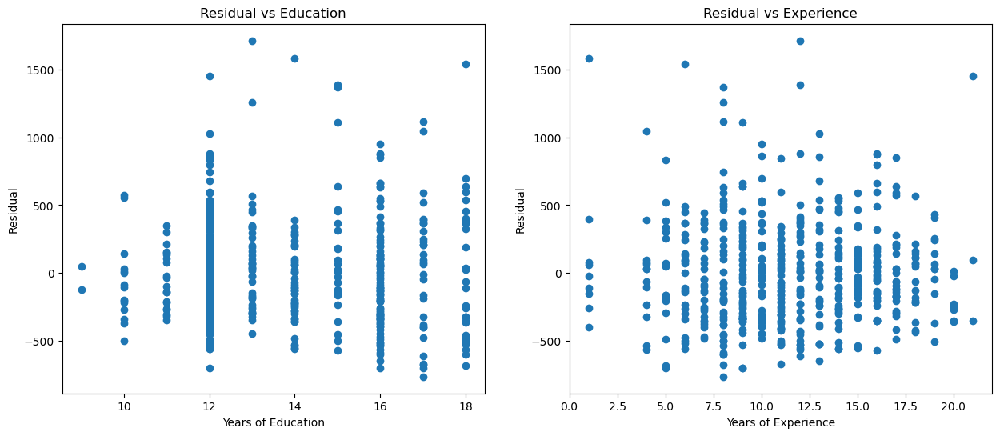

In [37]:
fig = plt.figure(figsize=(15,6))
ax1 = fig.add_subplot(1,2,1)
ax2 = fig.add_subplot(1,2,2)
ax1.scatter(train['educ'],resid)
ax1.set_title("Residual vs Education")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Residual')
ax2.scatter(train['exper'], resid)
ax2.set_title("Residual vs Experience")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Residual')

- it's hard to see if the average close to 0, so we do lowess for each of them

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Residual vs. Education)')

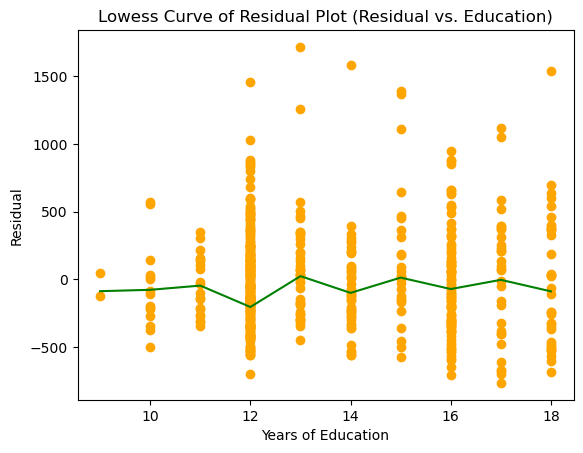

In [38]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(train['educ'],resid, color='orange')
z1 = lowess(resid, train['educ'], frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Years of Education')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Residual vs. Education)')

- overall, average close to 0
- outliers at 12 years of education

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Residual vs. Experience)')

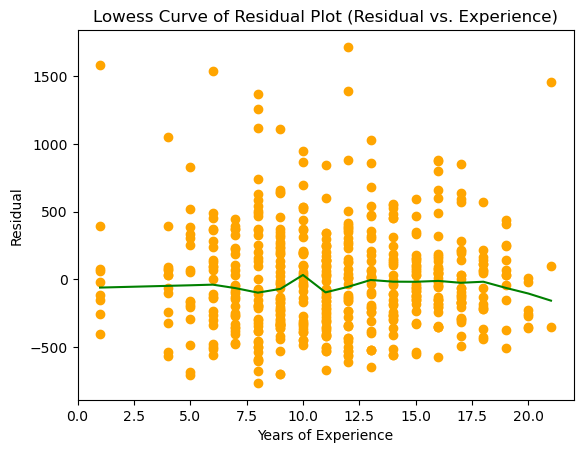

In [39]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(train['exper'],resid, color='orange')
z1 = lowess(resid, train['exper'], frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Years of Experience')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Residual vs. Experience)')

- overall, average close to 0

**Discuss whether the MLR LSA are satisfied**

- LSA 1
not violated - since no clear pattern or trend in the residual plot

- LSA 2
based on plots(residual vs predicted wage & education & experience), the average close to 0 except outliers. assume LSA 2 to be true. however, we don't assess the problem of OVB here, later assessment of OVB may make this violated

- LSA 3
assume to be true

- LSA 4
Kurtosis of wage show that the outliers are not significant, so LSA 4 true, also the wage is bounded
For regressors (edu and exper), there are bounded and cannot be infinity, so LSA 4 true

- LSA 5
true, no perfect collinearity (based on value of correlation calculated before smaller than 1

- LSA 6 (not quite important)
not violated - no need to use hetro-robust SE now

**Assess the goodness of fit in the MLR model**

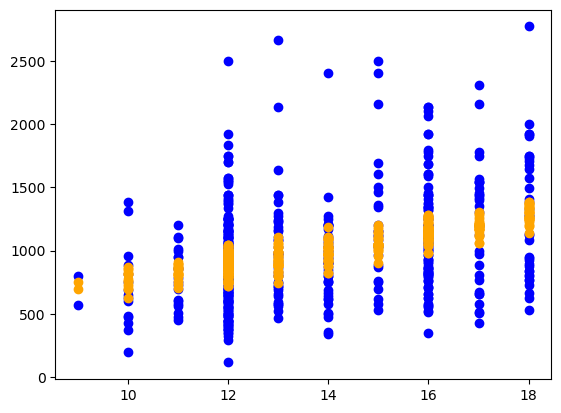

In [40]:
plt.scatter(train['educ'], train['wage'], c='blue')
plt.scatter(train['educ'], fit, c='orange')

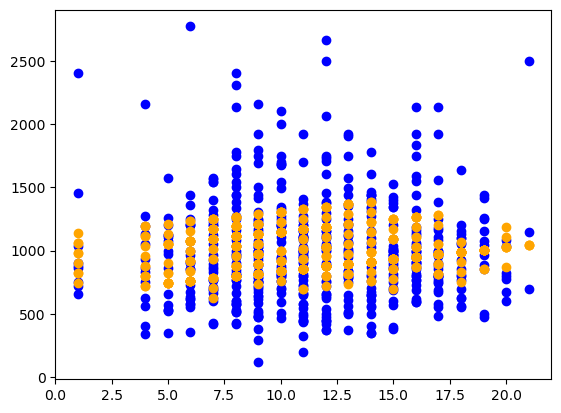

In [41]:
plt.scatter(train['exper'], train['wage'], c='blue')
plt.scatter(train['exper'], fit, c='orange')

- with adjusted R squared, it is so low, not good for fitting
- also shown in two graphs above

## Question 3:

**Possible OVB, Test relationship with edu&exper again, Assumption of new model, Fitness of new model, Multicollinearity problem**

#### Full model

In [42]:
model_full = smf.ols(formula='wage ~ hours + IQ + KWW + educ + exper + tenure + age + married + black + south + urban + sibs + brthord + meduc + feduc', data=train)
reg_full = model_full.fit()
reg_full.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.258
Model:                            OLS   Adj. R-squared:                  0.236
Method:                 Least Squares   F-statistic:                     11.78
Date:                Wed, 22 May 2024   Prob (F-statistic):           4.79e-25
Time:                        20:51:33   Log-Likelihood:                -3824.0
No. Observations:                 524   AIC:                             7680.
Df Residuals:                     508   BIC:                             7748.
Df Model:                          15                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -970.4756    261.812     -3.707      0.000   -1484.843    -456.109
hours         -2.2220      2.254     -0.986      0.325      -6.650       2.207
IQ             3.4937      1.419      2.462      0.014       0.706       6.282
KWW            3.2195      2.835      1.136      0.257      -2.350       8.789
educ          35.2229     10.398      3.388      0.001      14.795      55.651
exper          8.6069      5.186      1.660      0.098      -1.582      18.796
tenure         2.6195      3.376      0.776      0.438      -4.013       9.252
age           16.2755      7.034      2.314      0.021       2.456      30.095
married      169.3542     55.584      3.047      0.002      60.152     278.556
black        -65.2459     65.606     -0.995      0.320    -194.138      63.646
south        -48.0579     36.244     -1.326      0.185    -119.265      23.149
urban        152.7806     36.877      4.143      0.000      80.331     225.231
sibs          10.4937      9.345      1.123      0.262      -7.866      28.853
brthord      -17.1163     13.460     -1.272      0.204     -43.560       9.328
meduc          6.4929      7.204      0.901      0.368      -7.660      20.646
feduc         14.1718      6.274      2.259      0.024       1.846      26.498
==============================================================================
Omnibus:                      120.788   Durbin-Watson:                   1.921
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              316.591
Skew:                           1.139   Prob(JB):                     1.79e-69
Kurtosis:                       6.051   Cond. No.                     2.08e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.08e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

- Explain the coefficients of wage, experience, education

- the coefficient of educ and exper is quite different from the model with only these two regressors
- imply that there are OVBs

In [43]:
reg_full.mse_resid**0.5

362.919842990524

- using the heat map and correlation matrix in task 1
- the correlation of IQ and feduc between these two features(edu&exper) are strongly related to at least one of education and experience
- also, in real life, these are likely to be determinant of 'wage'
- so we think these two might be OVB and we add these to regressors to form a new MLR

In [44]:
variables_OVB = ['wage', 'educ', 'exper', 'IQ', 'feduc']
data_OVB = train[variables_OVB]
model_OVB = smf.ols(formula='wage ~ educ + exper + IQ + feduc ', data= data_OVB)
reg_OVB = model_OVB.fit()
reg_OVB.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.187
Model:                            OLS   Adj. R-squared:                  0.181
Method:                 Least Squares   F-statistic:                     29.86
Date:                Wed, 22 May 2024   Prob (F-statistic):           2.26e-22
Time:                        20:51:33   Log-Likelihood:                -3847.9
No. Observations:                 524   AIC:                             7706.
Df Residuals:                     519   BIC:                             7727.
Df Model:                           4                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -587.0863    158.560     -3.703      0.000    -898.584    -275.589
educ          50.4082      9.852      5.116      0.000      31.053      69.763
exper         19.9294      4.367      4.563      0.000      11.350      28.509
IQ             4.4561      1.332      3.345      0.001       1.839       7.073
feduc         20.2434      5.619      3.602      0.000       9.204      31.283
==============================================================================
Omnibus:                       95.592   Durbin-Watson:                   1.898
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              200.777
Skew:                           0.990   Prob(JB):                     2.52e-44
Kurtosis:                       5.297   Cond. No.                     1.02e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.02e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

- explain and interpret this new model
- compare the estimated equation in previous model(Q2) and this new one
- compare the new coefficient of edu and exper in this new model, with CI 95% of these two in previous model
- the new coefficent of educ is lower than 95% CI of educ in previous model, so these two regressors(IQ and feduc) cause some OVB

In [45]:
# SER
reg_OVB.mse_resid**0.5

375.84466172552135

#### Multicollinearity assessment

In [46]:
train[['educ', 'exper', 'IQ', 'age']].corr()

,educ,exper,IQ,age
educ,1.000000,-0.434877,0.533993,0.058855
exper,-0.434877,1.000000,-0.213809,0.469856
IQ,0.533993,-0.213809,1.000000,-0.027972
age,0.058855,0.469856,-0.027972,1.000000


- In the matrix of correlation, we can see that the correlation between 'educ-IQ' and 'educ_age' are over 50%, therefore, we think there might be problem of multicollinearity
- so, we do the SLR with these two set of regressors to assess the problem

##### Multicollinearity assessment - 'educ-IQ'

In [165]:
model_OVB_col1 = smf.ols(formula='educ ~ IQ', data= train)
reg_OVB_col1 = model_OVB_col1.fit()
reg_OVB_col1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   educ   R-squared:                       0.285
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     208.2
Date:                Wed, 22 May 2024   Prob (F-statistic):           5.80e-40
Time:                        21:22:37   Log-Likelihood:                -1072.6
No. Observations:                 524   AIC:                             2149.
Df Residuals:                     522   BIC:                             2158.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.4587      0.578      9.450      0.000       4.324       6.594
IQ             0.0802      0.006     14.430      0.000       0.069       0.091
==============================================================================
Omnibus:                       13.993   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               12.679
Skew:                           0.323   Prob(JB):                      0.00177
Kurtosis:                       2.596   Cond. No.                         732.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

- the r-squared is low here, so no need to worry about problem of multicollinearity here

##### Multicollinearity assessment - 'educ-age'

In [166]:
model_OVB_col2 = smf.ols(formula='educ ~ age', data= train)
reg_OVB_col2 = model_OVB_col2.fit()
reg_OVB_col2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   educ   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.814
Date:                Wed, 22 May 2024   Prob (F-statistic):              0.179
Time:                        21:25:15   Log-Likelihood:                -1159.6
No. Observations:                 524   AIC:                             2323.
Df Residuals:                     522   BIC:                             2332.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.2913      1.058     11.621      0.000      10.213      14.369
age            0.0430      0.032      1.347      0.179      -0.020       0.106
==============================================================================
Omnibus:                      145.291   Durbin-Watson:                   2.087
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.399
Skew:                           0.438   Prob(JB):                     1.69e-09
Kurtosis:                       1.960   Cond. No.                         362.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

- the r-squared is low here, so no need to worry about problem of multicollinearity here

#### summary for this part(multicollinearity)
- although the correlation between these two set of regressors are relatively high, but after assessing the R^2, we see that it is not a problem
- also, regarding multicollinearity problem in the model, as long as it is not perfect collinearity, it will not be a big problem for our model

In [47]:
resid_OVB=reg_OVB.resid
fit_OVB=reg_OVB.fittedvalues

Text(0.5, 0.98, 'MLR with OVBs Residual Plot (Predicted Wage vs Residual)')

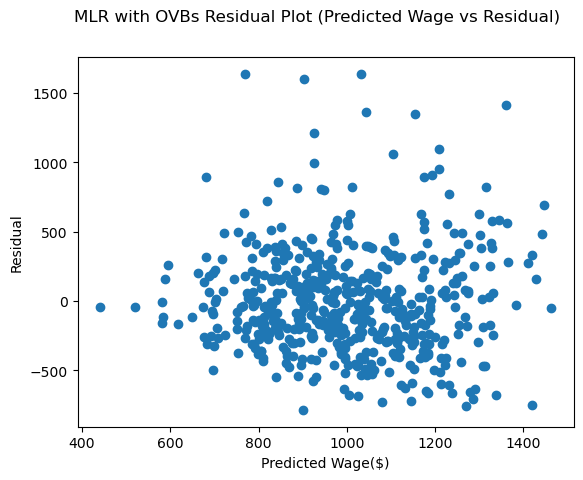

In [48]:
plt.scatter(fit_OVB,resid_OVB)
plt.xlabel('Predicted Wage($)')
plt.ylabel('Residual')
plt.suptitle('MLR with OVBs Residual Plot (Predicted Wage vs Residual)')

- pattern indicates hetero
- in lower predited wage,  narrower range of variance, but for higher predicted wage, wider range
- some outliers
- use plot of lowess curve to assess the average

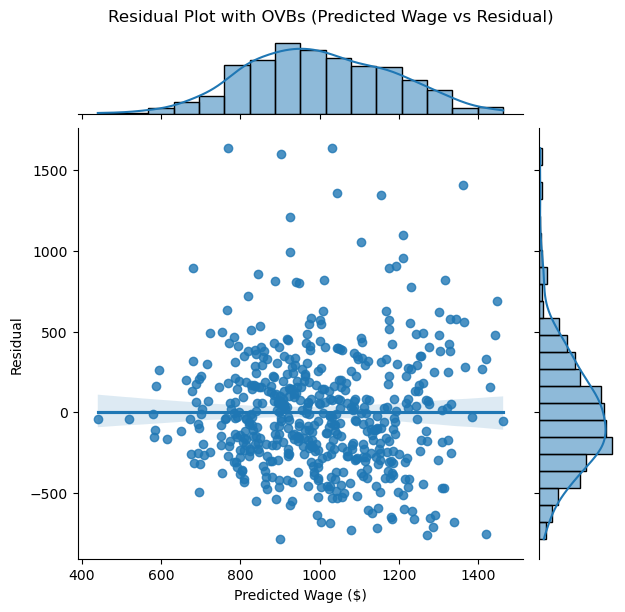

In [49]:
sns.jointplot(x=fit_OVB, y=resid_OVB, kind="reg")
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.subplots_adjust(top= 0.93)
plt.suptitle('Residual Plot with OVBs (Predicted Wage vs Residual)')
plt.show()

- average is 0
- check with lowess again to see the impact of outliers
- pattern indicates hetero

Text(0.5, 1.0, 'Lowess Curve of Residual Plot with OVBs (Residual vs. Predicted Wage)')

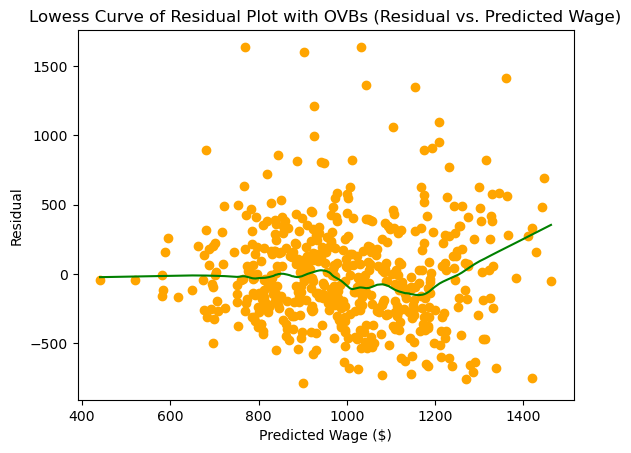

In [50]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fit_OVB,resid_OVB, color='orange')
z1 = lowess(resid_OVB, fit_OVB, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot with OVBs (Residual vs. Predicted Wage)')

- average close to 0 apart from the impact of outliers(but not a big problem)
- pattern indicates hetero

Text(0.5, 1.0, 'Squared Residual Plot with OVBs (Squared Residual vs. Predicted Wage)')

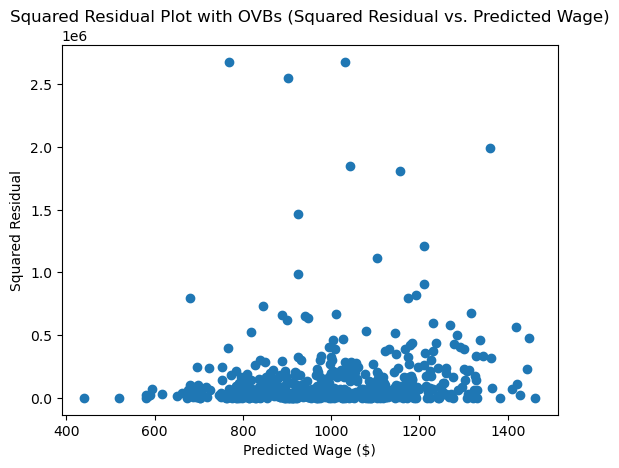

In [51]:
resid_OVB_squared=resid_OVB**2
plt.scatter(fit_OVB,resid_OVB_squared)
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Squared Residual')
plt.title('Squared Residual Plot with OVBs (Squared Residual vs. Predicted Wage)')

- as predicted wage increase, the variance also increase
- so some problem of hetero
- LSA6 is violated, but not a big problem since we can use hetero-robust SE


Text(0, 0.5, 'Residual')

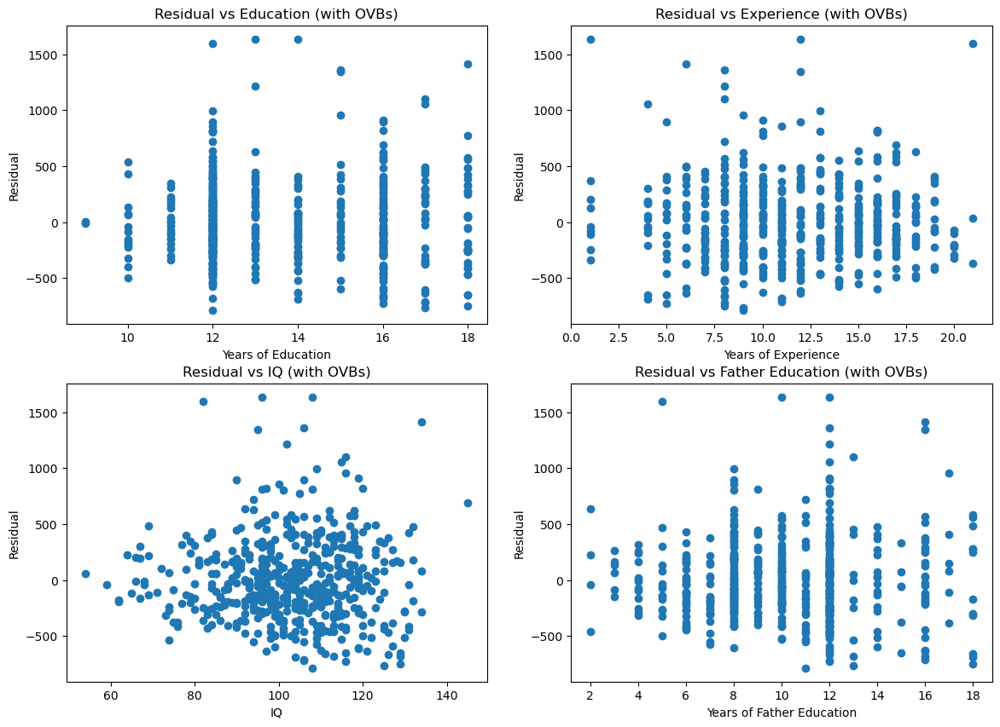

In [52]:
fig = plt.figure(figsize=(14,10))
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)
ax3 = fig.add_subplot(2,2,3)
ax4 = fig.add_subplot(2,2,4)
ax1.scatter(train['educ'],resid_OVB)
ax1.set_title("Residual vs Education (with OVBs)")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Residual')
ax2.scatter(train['exper'], resid_OVB)
ax2.set_title("Residual vs Experience (with OVBs)")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Residual')
ax3.scatter(train['IQ'], resid_OVB)
ax3.set_title("Residual vs IQ (with OVBs)")
ax3.set_xlabel('IQ')
ax3.set_ylabel('Residual')
ax4.scatter(train['feduc'], resid_OVB)
ax4.set_title("Residual vs Father Education (with OVBs)")
ax4.set_xlabel('Years of Father Education')
ax4.set_ylabel('Residual')

- it's hard to see if the average close to 0, so we do lowess for each of them


Text(0.5, 1.0, 'Lowess Curve of Residual Plot with OVBs (Residual vs. Education)')

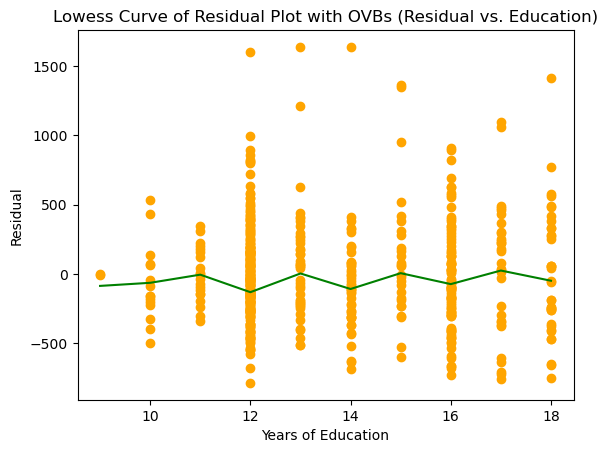

In [53]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(train['educ'],resid_OVB, color='orange')
z1 = lowess(resid_OVB, train['educ'], frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Years of Education')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot with OVBs (Residual vs. Education)')

- overall, average close to 0
- (remember to compare with plot in old MLR)

Text(0.5, 1.0, 'Lowess Curve of Residual Plot with OVBs (Residual vs. Experience)')

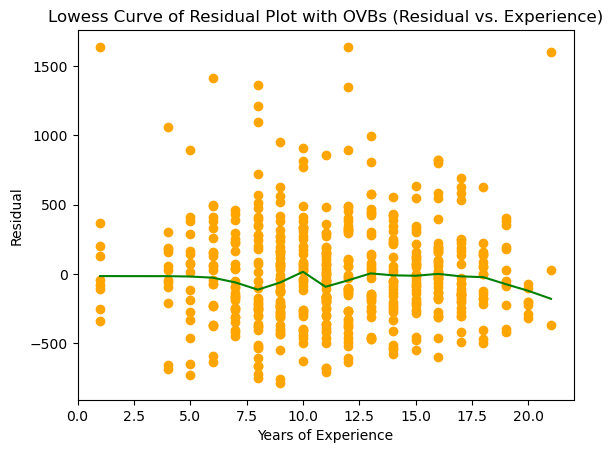

In [54]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(train['exper'],resid_OVB, color='orange')
z1 = lowess(resid_OVB, train['exper'], frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Years of Experience')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot with OVBs (Residual vs. Experience)')

- overall, average close to 0
- (remember to compare with plot in old MLR)

Text(0.5, 1.0, 'Lowess Curve of Residual Plot with OVBs (Residual vs. IQ)')

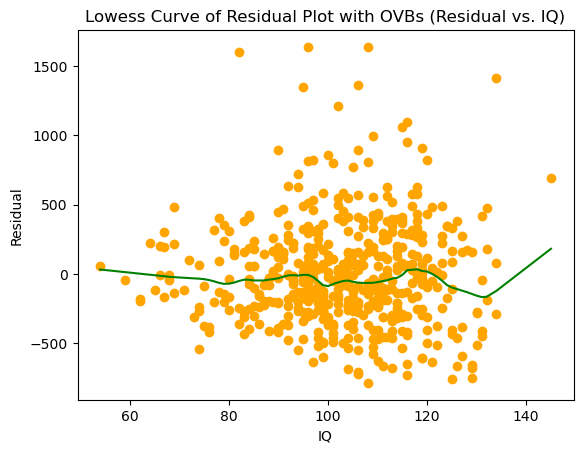

In [55]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(train['IQ'],resid_OVB, color='orange')
z1 = lowess(resid_OVB, train['IQ'], frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('IQ')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot with OVBs (Residual vs. IQ)')

- overall, average close to 0
- however, after 130, influenced by the extremely outlier

Text(0.5, 1.0, 'Lowess Curve of Residual Plot with OVBs (Residual vs. Father Education)')

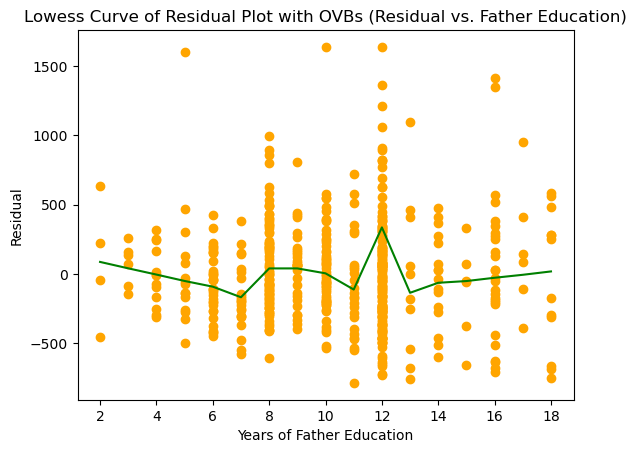

In [56]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(train['feduc'],resid_OVB, color='orange')
z1 = lowess(resid_OVB, train['feduc'], frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Years of Father Education')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot with OVBs (Residual vs. Father Education)')

- overall it is close to 0, but it is highly influenced by outliers, especially at 12 years of education
- therefore, LSA2 is violated, so this may also influence the LSA1

Discuss whether the MLR LSA are satisfied

- LSA 1 violated - in the residual plot vs fitted y, there are significant outliers, this may lead to a nonlinear pattern(this is also shown in the lowess curve of that). Therefore, LSA 1 is highly likely to be violated

- LSA 2 based on plots(residual vs predicted wage & education & experience & IQ & feduc), for the first three regressors, overall, the average of residual given x is close to 0. However, for the redisual vs feduc, there are some extremely outliers, which make the average of residual given feduc(x) not close to 0. Therefore, LSA2 is violated in this model. This may also imply that the LSA 1 is violated.

- Regarding the old MLR, there are some OVBs, meaning that LSA2 is violated now.

- LSA 3 assume to be true

- LSA 4 Kurtosis of wage show that the outliers are not significant, so LSA 4 true, also the wage is bounded. For regressors (edu, exper, IQ and age), there are bounded and cannot be infinity, so LSA 4 true

- LSA 5 true, no perfect collinearity (based on value of correlation calculated before smaller than 1

- LSA 6 (not quite important) based on the residual plot, it is violated, the variation increase as predicted wage increase - need to use hetro-robust SE now

#### Assess the goodness of fit in the new MLR model

Text(0, 0.5, 'Wage($)')

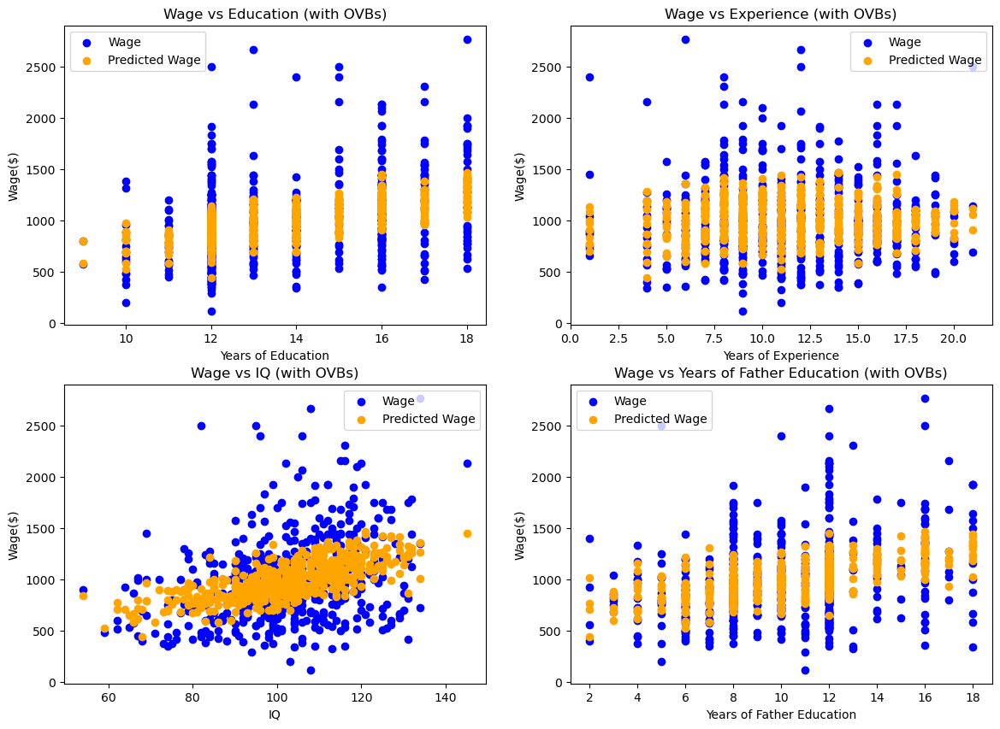

In [57]:
fig = plt.figure(figsize=(14,10))
ax1 = fig.add_subplot(2,2,1)
ax2 = fig.add_subplot(2,2,2)
ax3 = fig.add_subplot(2,2,3)
ax4 = fig.add_subplot(2,2,4)
ax1.scatter(train['educ'], train['wage'], c='blue', label='Wage')
ax1.scatter(train['educ'], fit_OVB, c='orange', label='Predicted Wage')
ax1.legend()
ax1.set_title("Wage vs Education (with OVBs)")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Wage($)')

ax2.scatter(train['exper'], train['wage'], c='blue', label='Wage')
ax2.scatter(train['exper'], fit_OVB, c='orange', label='Predicted Wage')
ax2.legend()
ax2.set_title("Wage vs Experience (with OVBs)")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Wage($)')

ax3.scatter(train['IQ'], train['wage'], c='blue', label='Wage')
ax3.scatter(train['IQ'], fit_OVB, c='orange', label='Predicted Wage')
ax3.legend()
ax3.set_title("Wage vs IQ (with OVBs)")
ax3.set_xlabel('IQ')
ax3.set_ylabel('Wage($)')

ax4.scatter(train['feduc'], train['wage'], c='blue', label='Wage')
ax4.scatter(train['feduc'], fit_OVB, c='orange', label='Predicted Wage')
ax4.legend()
ax4.set_title("Wage vs Years of Father Education (with OVBs)")
ax4.set_xlabel('Years of Father Education')
ax4.set_ylabel('Wage($)')

- with adjusted R squared, it is so low, not good for fitting
- these four graphs show bad goodness of fit

## Question 4:
- Varibale and model selection, at least two interaction effect, at least two transformations/nonlineanr effects on regressors and/or response variable
- 8 models - find optimal, also parsimonious
- Discuss collinearity issue
- Explain nonlinear effect on wage

### Forward and Backward Selection

#### Forward Selection

In [58]:
#forward selection 

def forward_selected(data, response, nominated = []):

    """Linear model designed by forward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by forward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    
    selected = nominated
    

    remaining.remove(response)
    remaining ^= set(selected)
    
    current_score, best_new_score = 0.0, 0.0
    
    if nominated:
        
        formula = "{} ~ {} + 1".format(response, ' + '.join(nominated))
        
        current_score= smf.ols(formula, data).fit().rsquared_adj
        
        best_new_score = current_score
        print("you nominated variable(s) %s, the adj_r2 is: %f" %(nominated, current_score))
    
   
    while remaining and current_score == best_new_score:
        
        scores_with_candidates = []
        
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(selected + [candidate]))
            score = smf.ols(formula, data).fit().rsquared_adj
            
            scores_with_candidates.append((score, candidate))
        
     
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        
       
        if current_score < best_new_score:
            print("adding %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            
            remaining.remove(best_candidate)
            
            selected.append(best_candidate)
            
            current_score = best_new_score
            
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(selected))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    
    return model

In [59]:
model1_fs = forward_selected(train[['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc']], 'wage', nominated=['educ', 'exper'])

you nominated variable(s) ['educ', 'exper'], the adj_r2 is: 0.139237
adding urban increases adj_r2 from 0.139237 to 0.167961
adding IQ increases adj_r2 from 0.167961 to 0.189929
adding married increases adj_r2 from 0.189929 to 0.205582
adding feduc increases adj_r2 from 0.205582 to 0.219864
adding age increases adj_r2 from 0.219864 to 0.234519
adding south increases adj_r2 from 0.234519 to 0.237232
adding KWW increases adj_r2 from 0.237232 to 0.237862
adding meduc increases adj_r2 from 0.237862 to 0.237994
final model is wage ~ educ + exper + urban + IQ + married + feduc + age + south + KWW + meduc + 1, with adj_r2 of 0.237994


#### Backward Selection

In [60]:
def backward_selected(data, response, nominated = []):
    """Linear model designed by backward selection.

    Parameters:
    -----------
    data : pandas DataFrame with all possible predictors and response

    response: string, name of response column in data

    Returns:
    --------
    model: an "optimal" fitted statsmodels linear model
           with an intercept
           selected by backward selection
           evaluated by adjusted R-squared
    """
    remaining = set(data.columns)
    remaining.remove(response)
    if nominated:
        print("you nominated variables %s" %nominated)
    nominated = set(nominated)
    remaining^=nominated
    formula = "{} ~ {} + 1".format(response,' + '.join(remaining | nominated))
    current_score = smf.ols(formula, data).fit().rsquared_adj
    print("adj_r2 if all variables included: %f" %current_score)
    best_new_score = current_score
    while remaining and current_score == best_new_score:
        scores_with_candidates = []
        for candidate in remaining:
            formula = "{} ~ {} + 1".format(response,
                                           ' + '.join(remaining^{candidate}|nominated))
            score = smf.ols(formula, data).fit().rsquared_adj
            scores_with_candidates.append((score, candidate))
        scores_with_candidates.sort()
        best_new_score, best_candidate = scores_with_candidates.pop()
        if current_score < best_new_score:
            print("deleting %s increases adj_r2 from %f to %f" %(best_candidate, current_score, best_new_score))
            remaining.remove(best_candidate)
            current_score = best_new_score
    formula = "{} ~ {} + 1".format(response,
                                   ' + '.join(remaining|nominated))
    model = smf.ols(formula, data).fit()
    print("final model is %s, with adj_r2 of %f" %(formula, model.rsquared_adj))
    return model

In [61]:
model_bs = backward_selected(train[['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc'""]], 'wage', nominated=['educ', 'exper'])

you nominated variables ['educ', 'exper']
adj_r2 if all variables included: 0.236175
deleting tenure increases adj_r2 from 0.236175 to 0.236772
deleting meduc increases adj_r2 from 0.236772 to 0.236956
deleting hours increases adj_r2 from 0.236956 to 0.236980
deleting black increases adj_r2 from 0.236980 to 0.237087
deleting sibs increases adj_r2 from 0.237087 to 0.237537
deleting brthord increases adj_r2 from 0.237537 to 0.237862
final model is wage ~ IQ + educ + urban + exper + age + married + south + feduc + KWW + 1, with adj_r2 of 0.237862


- We directly use the forward-selection, without explaination

##### 1. Final model from the forward selection

In [62]:
#The final model from the forward selection
model_fs1 = smf.ols(formula='wage ~ educ + exper + urban + IQ + married + feduc + age + south + KWW + meduc', data=train)
reg_fs1 = model_fs1.fit()
resid_fs1 = reg_fs1.resid
fitted_fs1 = reg_fs1.fittedvalues
reg_fs1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.238
Method:                 Least Squares   F-statistic:                     17.33
Date:                Wed, 22 May 2024   Prob (F-statistic):           2.98e-27
Time:                        20:51:36   Log-Likelihood:                -3825.9
No. Observations:                 524   AIC:                             7674.
Df Residuals:                     513   BIC:                             7721.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1113.2047    231.787     -4.803      0.000   -1568.573    -657.836
educ          33.9387     10.293      3.297      0.001      13.717      54.161
exper          9.0889      5.068      1.793      0.074      -0.868      19.046
urban        146.1535     36.503      4.004      0.000      74.439     217.868
IQ             3.7741      1.380      2.736      0.006       1.064       6.484
married      176.8892     55.253      3.201      0.001      68.340     285.439
feduc         14.4936      6.241      2.322      0.021       2.233      26.754
age           17.0971      6.979      2.450      0.015       3.387      30.807
south        -60.2628     35.322     -1.706      0.089    -129.657       9.132
KWW            3.1400      2.796      1.123      0.262      -2.353       8.633
meduc          7.2883      6.985      1.043      0.297      -6.434      21.011
==============================================================================
Omnibus:                      107.190   Durbin-Watson:                   1.911
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              252.625
Skew:                           1.054   Prob(JB):                     1.39e-55
Kurtosis:                       5.670   Cond. No.                     1.72e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.72e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [63]:
# SER
reg_fs1.mse_resid**0.5

362.4876304006316

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (FS2) (Residual vs. Predicted Wage)')

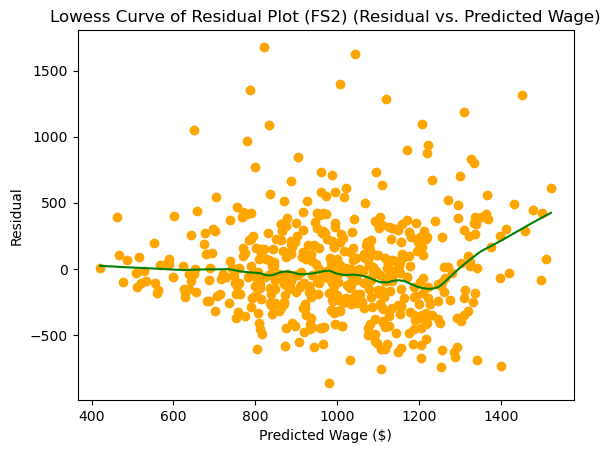

In [64]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs1,resid_fs1, color='orange')
z1 = lowess(resid_fs1, fitted_fs1, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (FS2) (Residual vs. Predicted Wage)')

- From the forward selection, we can see that at the step of adding south, the increase in adj R~square decrease significantly compare with others
- so we choose to cut at this step

##### 2. Cutting model from the forward selection

In [65]:
#cutting from the forward selection
model_fs2 = smf.ols(formula='wage ~ educ + exper + urban + IQ + married + feduc + age', data=train)
reg_fs2 = model_fs2.fit()
resid_fs2 = reg_fs2.resid
fitted_fs2 = reg_fs2.fittedvalues
reg_fs2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.245
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     23.89
Date:                Wed, 22 May 2024   Prob (F-statistic):           3.51e-28
Time:                        20:51:36   Log-Likelihood:                -3828.6
No. Observations:                 524   AIC:                             7673.
Df Residuals:                     516   BIC:                             7707.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1261.2453    215.182     -5.861      0.000   -1683.985    -838.505
educ          36.5132     10.162      3.593      0.000      16.549      56.477
exper          9.7461      5.061      1.926      0.055      -0.197      19.690
urban        158.2986     36.038      4.393      0.000      87.500     229.097
IQ             4.7082      1.293      3.641      0.000       2.168       7.249
married      176.8951     55.312      3.198      0.001      68.231     285.559
feduc         19.2026      5.471      3.510      0.000       8.455      29.951
age           20.9198      6.337      3.301      0.001       8.470      33.369
==============================================================================
Omnibus:                      103.683   Durbin-Watson:                   1.888
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              240.313
Skew:                           1.027   Prob(JB):                     6.56e-53
Kurtosis:                       5.605   Cond. No.                     1.50e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.5e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [66]:
# SER
reg_fs2.mse_resid**0.5

363.313018255101

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (FS2) (Residual vs. Predicted Wage)')

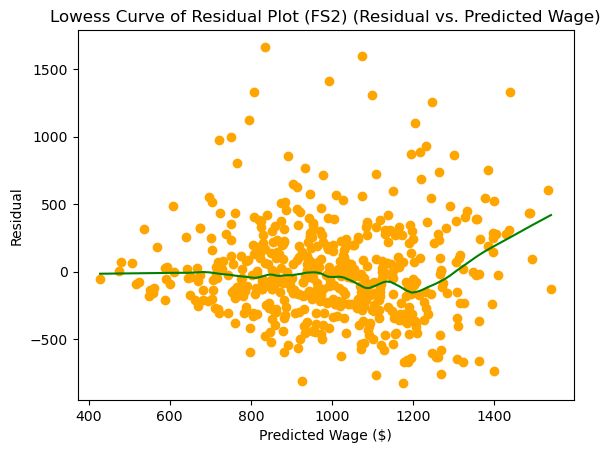

In [67]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2,resid_fs2, color='orange')
z1 = lowess(resid_fs2, fitted_fs2, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (FS2) (Residual vs. Predicted Wage)')

##### Transformation Effect

- From the scatter plot of each variables, it can be seen that the there is no clear linear relationship between wage and experience
- Therefore, we try to add log tranformation effect on wage ~ exper

###### 1. Tranformation model: wage ~ log_exper

In [68]:
train['log_exper'] = np.log(train['exper'])

model_fs2_tran1 = smf.ols(formula='wage ~ educ + log_exper + urban + IQ + married + feduc + age', data=train)
reg_fs2_tran1 = model_fs2_tran1.fit()
resid_fs2_tran1 = reg_fs2_tran1.resid
fitted_fs2_tran1 = reg_fs2_tran1.fittedvalues
reg_fs2_tran1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.243
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     23.61
Date:                Wed, 22 May 2024   Prob (F-statistic):           7.17e-28
Time:                        20:51:36   Log-Likelihood:                -3829.4
No. Observations:                 524   AIC:                             7675.
Df Residuals:                     516   BIC:                             7709.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1349.0829    222.349     -6.067      0.000   -1785.903    -912.263
educ          32.8404      9.716      3.380      0.001      13.753      51.928
log_exper     57.2665     38.386      1.492      0.136     -18.146     132.679
urban        158.1286     36.095      4.381      0.000      87.217     229.040
IQ             4.7865      1.294      3.700      0.000       2.245       7.328
married      179.2716     55.364      3.238      0.001      70.505     288.038
feduc         18.8683      5.477      3.445      0.001       8.108      29.628
age           24.2143      5.775      4.193      0.000      12.870      35.559
==============================================================================
Omnibus:                      103.485   Durbin-Watson:                   1.884
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              242.670
Skew:                           1.021   Prob(JB):                     2.02e-53
Kurtosis:                       5.635   Cond. No.                     1.55e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.55e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [69]:
# SER
reg_fs2_tran1.mse_resid**0.5

363.8321950021722

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran1) (Residual vs. Predicted Wage)')

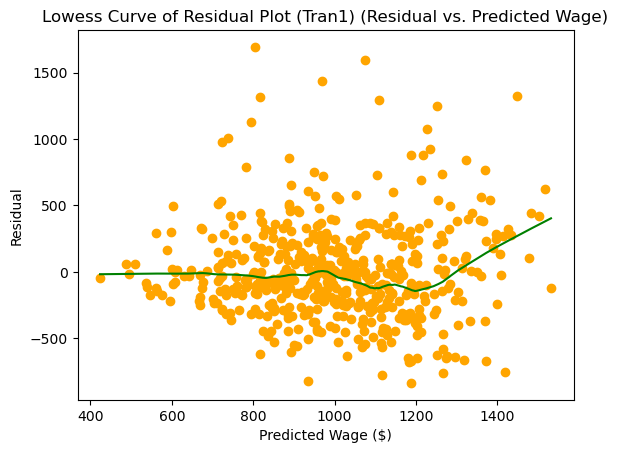

In [70]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran1,resid_fs2_tran1, color='orange')
z1 = lowess(resid_fs2_tran1, fitted_fs2_tran1, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran1) (Residual vs. Predicted Wage)')

###### 2. Tranformation model: lwage ~ exper

In [71]:
model_fs2_tran2 = smf.ols(formula='lwage ~ educ + exper + urban + IQ + married + feduc + age', data=train)
reg_fs2_tran2 = model_fs2_tran2.fit()
resid_fs2_tran2 = reg_fs2_tran2.resid
fitted_fs2_tran2 = reg_fs2_tran2.fittedvalues
reg_fs2_tran2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     24.93
Date:                Wed, 22 May 2024   Prob (F-statistic):           2.44e-29
Time:                        20:51:36   Log-Likelihood:                -213.70
No. Observations:                 524   AIC:                             443.4
Df Residuals:                     516   BIC:                             477.5
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.4797      0.217     20.630      0.000       4.053       4.906
educ           0.0401      0.010      3.907      0.000       0.020       0.060
exper          0.0133      0.005      2.612      0.009       0.003       0.023
urban          0.1719      0.036      4.726      0.000       0.100       0.243
IQ             0.0050      0.001      3.804      0.000       0.002       0.008
married        0.2022      0.056      3.623      0.000       0.093       0.312
feduc          0.0162      0.006      2.926      0.004       0.005       0.027
age            0.0198      0.006      3.101      0.002       0.007       0.032
==============================================================================
Omnibus:                       44.702   Durbin-Watson:                   1.913
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              109.064
Skew:                          -0.443   Prob(JB):                     2.08e-24
Kurtosis:                       5.052   Cond. No.                     1.50e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.5e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran2) (Residual vs. Predicted Wage)')

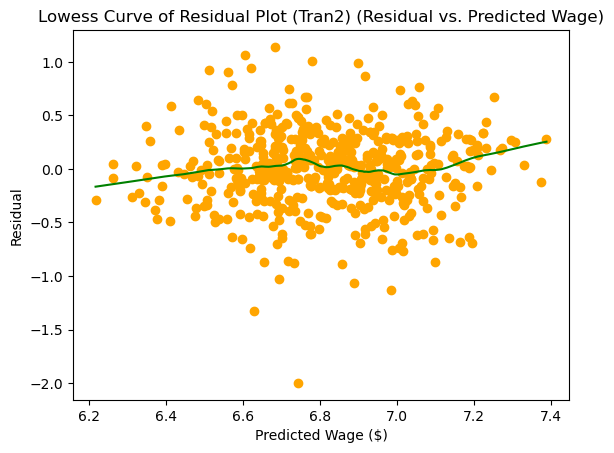

In [72]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran2,resid_fs2_tran2, color='orange')
z1 = lowess(resid_fs2_tran2, fitted_fs2_tran2, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran2) (Residual vs. Predicted Wage)')

###### 3. Tranformation model:  lwage ~ exper

In [73]:
model_fs2_tran3 = smf.ols(formula='lwage ~ educ + log_exper + urban + IQ + married + feduc + age', data=train)
reg_fs2_tran3 = model_fs2_tran3.fit()
resid_fs2_tran3 = reg_fs2_tran3.resid
fitted_fs2_tran3 = reg_fs2_tran3.fittedvalues
reg_fs2_tran3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.238
Method:                 Least Squares   F-statistic:                     24.36
Date:                Wed, 22 May 2024   Prob (F-statistic):           1.06e-28
Time:                        20:51:36   Log-Likelihood:                -215.24
No. Observations:                 524   AIC:                             446.5
Df Residuals:                     516   BIC:                             480.6
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.3637      0.225     19.419      0.000       3.922       4.805
educ           0.0348      0.010      3.539      0.000       0.015       0.054
log_exper      0.0754      0.039      1.943      0.053      -0.001       0.152
urban          0.1717      0.036      4.707      0.000       0.100       0.243
IQ             0.0051      0.001      3.884      0.000       0.003       0.008
married        0.2056      0.056      3.674      0.000       0.096       0.315
feduc          0.0157      0.006      2.837      0.005       0.005       0.027
age            0.0245      0.006      4.202      0.000       0.013       0.036
==============================================================================
Omnibus:                       47.243   Durbin-Watson:                   1.908
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              117.170
Skew:                          -0.465   Prob(JB):                     3.61e-26
Kurtosis:                       5.122   Cond. No.                     1.55e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.55e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran3) (Residual vs. Predicted Wage)')

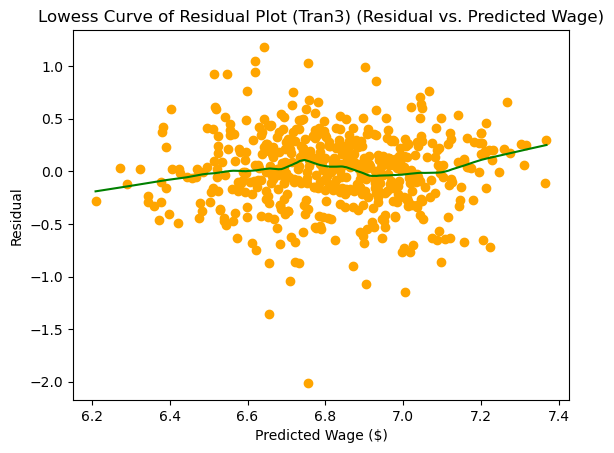

In [74]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran3,resid_fs2_tran3, color='orange')
z1 = lowess(resid_fs2_tran3, fitted_fs2_tran3, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran3) (Residual vs. Predicted Wage)')

- Also, it can be seen that the there is no clear linear relationship between wage and IQ
- Therefore, we try to add log tranformation effect on wage ~ IQ

###### 4. Tranformation model: wage ~ log_IQ

In [75]:
train['log_IQ'] = np.log(train['IQ'])

model_fs2_tran4 = smf.ols(formula='wage ~ educ + exper + urban + log_IQ + married + feduc + age', data=train)
reg_fs2_tran4 = model_fs2_tran4.fit()
resid_fs2_tran4 = reg_fs2_tran4.resid
fitted_fs2_tran4 = reg_fs2_tran4.fittedvalues
reg_fs2_tran4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.244
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     23.82
Date:                Wed, 22 May 2024   Prob (F-statistic):           4.18e-28
Time:                        20:51:36   Log-Likelihood:                -3828.8
No. Observations:                 524   AIC:                             7674.
Df Residuals:                     516   BIC:                             7708.
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -2841.9983    555.578     -5.115      0.000   -3933.472   -1750.524
educ          37.6138     10.061      3.739      0.000      17.849      57.378
exper          9.8646      5.061      1.949      0.052      -0.078      19.808
urban        159.0553     36.051      4.412      0.000      88.231     229.879
log_IQ       445.0318    123.992      3.589      0.000     201.441     688.623
married      173.5191     55.370      3.134      0.002      64.741     282.297
feduc         19.1885      5.475      3.505      0.000       8.433      29.944
age           20.7434      6.336      3.274      0.001       8.296      33.190
==============================================================================
Omnibus:                      103.278   Durbin-Watson:                   1.886
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              237.553
Skew:                           1.027   Prob(JB):                     2.61e-52
Kurtosis:                       5.582   Cond. No.                     1.41e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.41e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [76]:
# SER
reg_fs2_tran4.mse_resid**0.5

363.440570294007

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran4) (Residual vs. Predicted Wage)')

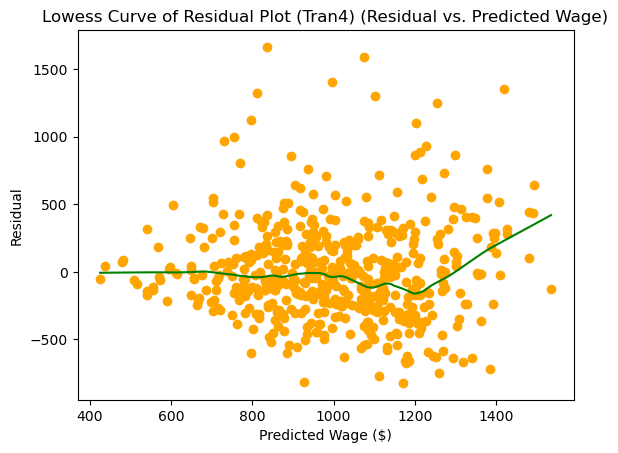

In [77]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran4,resid_fs2_tran4, color='orange')
z1 = lowess(resid_fs2_tran4, fitted_fs2_tran4, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran4) (Residual vs. Predicted Wage)')

###### 5. Tranformation model: lwage ~ IQ

In [614]:
model_fs2_tran5 = smf.ols(formula='lwage ~ educ + exper + urban + IQ + married + feduc + age', data=train)
reg_fs2_tran5 = model_fs2_tran5.fit()
resid_fs2_tran5 = reg_fs2_tran5.resid
fitted_fs2_tran5 = reg_fs2_tran5.fittedvalues
reg_fs2_tran5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     24.93
Date:                Fri, 24 May 2024   Prob (F-statistic):           2.44e-29
Time:                        04:40:07   Log-Likelihood:                -213.70
No. Observations:                 524   AIC:                             443.4
Df Residuals:                     516   BIC:                             477.5
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.4797      0.217     20.630      0.000       4.053       4.906
educ           0.0401      0.010      3.907      0.000       0.020       0.060
exper          0.0133      0.005      2.612      0.009       0.003       0.023
urban          0.1719      0.036      4.726      0.000       0.100       0.243
IQ             0.0050      0.001      3.804      0.000       0.002       0.008
married        0.2022      0.056      3.623      0.000       0.093       0.312
feduc          0.0162      0.006      2.926      0.004       0.005       0.027
age            0.0198      0.006      3.101      0.002       0.007       0.032
==============================================================================
Omnibus:                       44.702   Durbin-Watson:                   1.913
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              109.064
Skew:                          -0.443   Prob(JB):                     2.08e-24
Kurtosis:                       5.052   Cond. No.                     1.50e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.5e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran5) (Residual vs. Predicted Wage)')

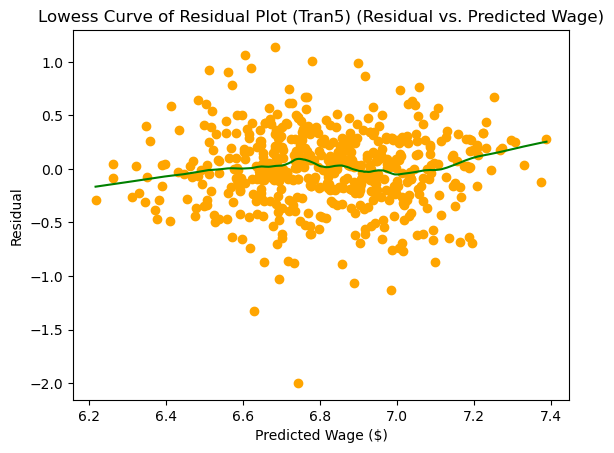

In [79]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran5,resid_fs2_tran5, color='orange')
z1 = lowess(resid_fs2_tran5, fitted_fs2_tran5, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran5) (Residual vs. Predicted Wage)')

###### 6. Tranformation model: lwage ~ log_IQ

In [80]:
model_fs2_tran6 = smf.ols(formula='lwage ~ educ + exper + urban + log_IQ + married + feduc + age', data=train)
reg_fs2_tran6 = model_fs2_tran6.fit()
resid_fs2_tran6 = reg_fs2_tran6.resid
fitted_fs2_tran6 = reg_fs2_tran6.fittedvalues
reg_fs2_tran6.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.243
Method:                 Least Squares   F-statistic:                     25.01
Date:                Wed, 22 May 2024   Prob (F-statistic):           2.00e-29
Time:                        20:51:37   Log-Likelihood:                -213.50
No. Observations:                 524   AIC:                             443.0
Df Residuals:                     516   BIC:                             477.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.7576      0.560      4.922      0.000       1.657       3.858
educ           0.0408      0.010      4.019      0.000       0.021       0.061
exper          0.0134      0.005      2.631      0.009       0.003       0.023
urban          0.1727      0.036      4.750      0.000       0.101       0.244
log_IQ         0.4825      0.125      3.859      0.000       0.237       0.728
married        0.1984      0.056      3.553      0.000       0.089       0.308
feduc          0.0161      0.006      2.909      0.004       0.005       0.027
age            0.0197      0.006      3.084      0.002       0.007       0.032
==============================================================================
Omnibus:                       44.994   Durbin-Watson:                   1.913
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              109.257
Skew:                          -0.448   Prob(JB):                     1.88e-24
Kurtosis:                       5.050   Cond. No.                     1.41e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.41e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran6) (Residual vs. Predicted Wage)')

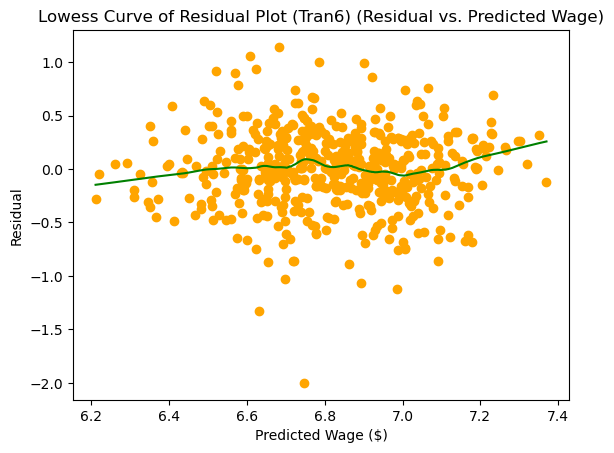

In [81]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran6,resid_fs2_tran6, color='orange')
z1 = lowess(resid_fs2_tran6, fitted_fs2_tran6, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran6) (Residual vs. Predicted Wage)')

###### 7. Tranformation model: lwage ~ log_IQ + log_exper

In [82]:
model_fs2_tran7 = smf.ols(formula='lwage ~ educ + log_exper + urban + log_IQ + married + feduc + age', data=train)
reg_fs2_tran7 = model_fs2_tran7.fit()
resid_fs2_tran7 = reg_fs2_tran7.resid
fitted_fs2_tran7 = reg_fs2_tran7.fittedvalues
reg_fs2_tran7.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.249
Model:                            OLS   Adj. R-squared:                  0.239
Method:                 Least Squares   F-statistic:                     24.44
Date:                Wed, 22 May 2024   Prob (F-statistic):           8.57e-29
Time:                        20:51:37   Log-Likelihood:                -215.02
No. Observations:                 524   AIC:                             446.0
Df Residuals:                     516   BIC:                             480.1
Df Model:                           7                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      2.6007      0.562      4.629      0.000       1.497       3.704
educ           0.0355      0.010      3.657      0.000       0.016       0.055
log_exper      0.0765      0.039      1.973      0.049       0.000       0.153
urban          0.1725      0.036      4.731      0.000       0.101       0.244
log_IQ         0.4935      0.125      3.941      0.000       0.247       0.740
married        0.2016      0.056      3.603      0.000       0.092       0.312
feduc          0.0156      0.006      2.818      0.005       0.005       0.026
age            0.0244      0.006      4.182      0.000       0.013       0.036
==============================================================================
Omnibus:                       47.531   Durbin-Watson:                   1.908
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              117.427
Skew:                          -0.469   Prob(JB):                     3.17e-26
Kurtosis:                       5.121   Cond. No.                     1.35e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.35e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Tran7) (Residual vs. Predicted Wage)')

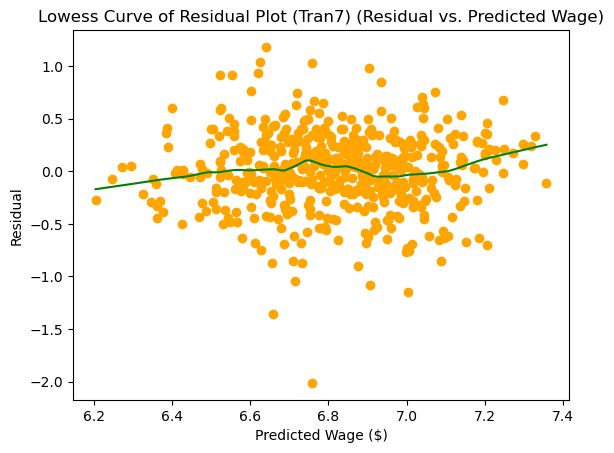

In [83]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran7,resid_fs2_tran7, color='orange')
z1 = lowess(resid_fs2_tran7, fitted_fs2_tran7, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Tran7) (Residual vs. Predicted Wage)')

#### Forward selection 2 with transformation effect (logwage and logIQ)

In [694]:
# model2_fs = forward_selected(train[['lwage','hours','log_IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc']], 'lwage', nominated=['educ', 'exper'])

In [695]:
# #The final model from the forward selection with transformation (wage and IQ)
# model_fs3 = smf.ols(formula='lwage ~ educ + exper + urban + log_IQ + married + south + age + feduc + tenure + hours + meduc', data=train)
# reg_fs3 = model_fs3.fit()
# resid_fs3 = reg_fs3.resid
# fitted_fs3 = reg_fs3.fittedvalues
# reg_fs3.summary()

In [696]:
# lowess = sm.nonparametric.lowess
# plt.scatter(fitted_fs3,resid_fs3, color='orange')
# z1 = lowess(resid_fs3, fitted_fs3, frac=1./5)
# plt.plot(z1[:,0],z1[:,1],'green')

# plt.xlabel('Predicted Wage ($)')
# plt.ylabel('Residual')
# plt.title('Lowess Curve of Residual Plot (FS3) (Residual vs. Predicted Wage)')

#### Forward selection 2 with log wage-log IQ cut

In [697]:
# #The final model from the forward selection with transformation (wage and IQ)
# model_fs3_r1 = smf.ols(formula='lwage ~ educ + exper + urban + log_IQ + married + south + age + feduc', data=train)
# reg_fs3_r1 = model_fs3_r1.fit()
# resid_fs3_r1 = reg_fs3_r1.resid
# fitted_fs3_r1 = reg_fs3_r1.fittedvalues
# reg_fs3_r1.summary()

#### Forward selection 3 with transformation effect (log wage - IQ)

In [701]:
model3_fs = forward_selected(train[['lwage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc']], 'lwage', nominated=['educ', 'exper'])

you nominated variable(s) ['educ', 'exper'], the adj_r2 is: 0.145899
adding urban increases adj_r2 from 0.145899 to 0.178009
adding IQ increases adj_r2 from 0.178009 to 0.201057
adding married increases adj_r2 from 0.201057 to 0.220835
adding south increases adj_r2 from 0.220835 to 0.233872
adding age increases adj_r2 from 0.233872 to 0.244374
adding feduc increases adj_r2 from 0.244374 to 0.252743
adding tenure increases adj_r2 from 0.252743 to 0.258302
adding hours increases adj_r2 from 0.258302 to 0.262807
adding meduc increases adj_r2 from 0.262807 to 0.264876
final model is lwage ~ educ + exper + urban + IQ + married + south + age + feduc + tenure + hours + meduc + 1, with adj_r2 of 0.264876


In [700]:
#The final model from the forward selection with transformation (wage)
model_fs4 = smf.ols(formula='lwage ~ educ + exper + urban + IQ + married + south + age + feduc + tenure + hours + meduc', data=train)
reg_fs4 = model_fs4.fit()
resid_fs4 = reg_fs4.resid
fitted_fs4 = reg_fs4.fittedvalues
reg_fs4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.280
Model:                            OLS   Adj. R-squared:                  0.265
Method:                 Least Squares   F-statistic:                     18.13
Date:                Fri, 24 May 2024   Prob (F-statistic):           1.25e-30
Time:                        06:45:31   Log-Likelihood:                -203.85
No. Observations:                 524   AIC:                             431.7
Df Residuals:                     512   BIC:                             482.8
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.8011      0.234     20.487      0.000       4.341       5.262
educ           0.0377      0.010      3.711      0.000       0.018       0.058
exper          0.0095      0.005      1.857      0.064      -0.001       0.020
urban          0.1615      0.036      4.470      0.000       0.091       0.232
IQ             0.0043      0.001      3.259      0.001       0.002       0.007
married        0.1994      0.055      3.616      0.000       0.091       0.308
south         -0.0931      0.035     -2.643      0.008      -0.162      -0.024
age            0.0187      0.006      2.942      0.003       0.006       0.031
feduc          0.0106      0.006      1.699      0.090      -0.002       0.023
tenure         0.0070      0.003      2.083      0.038       0.000       0.014
hours         -0.0047      0.002     -2.100      0.036      -0.009      -0.000
meduc          0.0109      0.007      1.563      0.119      -0.003       0.025
==============================================================================
Omnibus:                       37.578   Durbin-Watson:                   1.919
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              122.714
Skew:                          -0.240   Prob(JB):                     2.25e-27
Kurtosis:                       5.322   Cond. No.                     1.78e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.78e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (FS4) (Residual vs. Predicted Wage)')

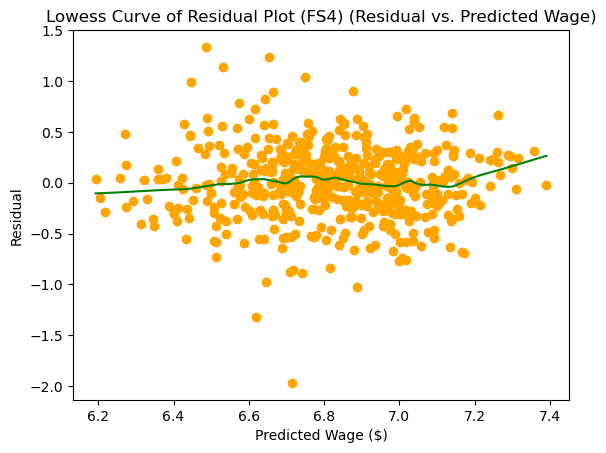

In [497]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs4,resid_fs4, color='orange')
z1 = lowess(resid_fs4, fitted_fs4, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (FS4) (Residual vs. Predicted Wage)')

#### Forward selection 3 with log wage-IQ cut

In [561]:
#Cut the final model from the forward selection with transformation (log wage)
model_fs4_r1 = smf.ols(formula='lwage ~ educ + exper + urban + IQ + married + south + age + feduc', data=train)
reg_fs4_r1 = model_fs4_r1.fit()
resid_fs4_r1 = reg_fs4_r1.resid
fitted_fs4_r1 = reg_fs4_r1.fittedvalues
reg_fs4_r1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  lwage   R-squared:                       0.264
Model:                            OLS   Adj. R-squared:                  0.253
Method:                 Least Squares   F-statistic:                     23.11
Date:                Fri, 24 May 2024   Prob (F-statistic):           2.75e-30
Time:                        00:38:24   Log-Likelihood:                -209.67
No. Observations:                 524   AIC:                             437.3
Df Residuals:                     515   BIC:                             475.7
Df Model:                           8                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      4.6079      0.220     20.906      0.000       4.175       5.041
educ           0.0404      0.010      3.964      0.000       0.020       0.060
exper          0.0121      0.005      2.383      0.018       0.002       0.022
urban          0.1589      0.036      4.364      0.000       0.087       0.230
IQ             0.0045      0.001      3.424      0.001       0.002       0.007
married        0.2043      0.055      3.684      0.000       0.095       0.313
south         -0.0999      0.035     -2.826      0.005      -0.169      -0.030
age            0.0195      0.006      3.070      0.002       0.007       0.032
feduc          0.0144      0.006      2.604      0.009       0.004       0.025
==============================================================================
Omnibus:                       42.770   Durbin-Watson:                   1.923
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              116.111
Skew:                          -0.384   Prob(JB):                     6.12e-26
Kurtosis:                       5.174   Cond. No.                     1.54e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.54e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Forward selection include log-wage, log-IQ and log-educ

In [600]:
# train['log_educ'] = np.log(train['educ'])
# model5_fs = forward_selected(train[['lwage','hours','log_IQ','KWW','log_educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc']], 'lwage', nominated=['exper', 'log_educ'])

#### Forward selection include log-wage, log-IQ and log-educ - reduced

In [601]:
# model_fs5_r1 = smf.ols(formula='lwage ~ exper + log_educ + urban + log_IQ + married + south + age + feduc', data=train)
# reg_fs5_r1 = model_fs5_r1.fit()
# resid_fs5_r1 = reg_fs5_r1.resid
# fitted_fs5_r1 = reg_fs5_r1.fittedvalues
# reg_fs5_r1.summary()

**Do bias correction for model with log wage**

In [540]:
stats.describe(train['wage'])

DescribeResult(nobs=524, minmax=(115, 2771), mean=998.0801526717557, variance=172435.93237779694, skewness=1.0528847584880687, kurtosis=1.6639059728260088)

- log_wage-IQ in FS1 reduced model:

In [615]:
eres1 = np.exp(resid_fs2_tran5) #residual for log-log model

n = 524

fp1 = sum(eres1)/n

fp11 = np.exp(reg_fs2_tran5.mse_resid/2)

fp1, fp11

(1.0659344454641633, 1.0695171126563663)

In [616]:
TS_lwage_IQ = np.exp(fitted_fs2_tran5) #Expo
TS_lwage_IQ1 = np.exp(fitted_fs2_tran5) * fp1 #Duan
TS_lwage_IQ11 = np.exp(fitted_fs2_tran5) * fp11 #Normal

In [617]:
# SER, R2, and adj-R2 for lwage-IQ (exp)
res_lwage_IQ = train['wage']-TS_lwage_IQ
np.sqrt(sum(res_lwage_IQ**2)/(n-8)), 1 - sum(res_lwage_IQ**2)/((n-1)*172435.93237779694), 1 - sum(res_lwage_IQ**2)/(n-8)/172435.93237779694

(366.7262067939872, 0.23050795246228994, 0.22006910685615821)

In [618]:
# SER, R2, and adj-R2 for lwage-IQ (Duan)
res_lwage_IQ1 = train['wage']-TS_lwage_IQ1
np.sqrt(sum(res_lwage_IQ1**2)/(n-8)), 1 - sum(res_lwage_IQ1**2)/((n-1)*172435.93237779694), 1 - sum(res_lwage_IQ1**2)/(n-8)/172435.93237779694

(361.49328627614653, 0.2523114759213436, 0.2421684145481836)

In [619]:
# SER, R2, and adj-R2 for lwage-IQ (normal)
res_lwage_IQ11 = train['wage']-TS_lwage_IQ11
np.sqrt(sum(res_lwage_IQ11**2)/(n-8)), 1 - sum(res_lwage_IQ11**2)/((n-1)*172435.93237779694), 1 - sum(res_lwage_IQ11**2)/(n-8)/172435.93237779694

(361.52815441004327, 0.25216723113513917, 0.24202221295286397)

- log_wage-log_IQ in FS1 reduced model:

In [498]:
eres2 = np.exp(resid_fs2_tran6) #residual for log-log model

n = 524

fp2 = sum(eres2)/n

fp21 = np.exp(reg_fs2_tran6.mse_resid/2)

fp2, fp21

(1.0658355085451348, 1.0694598519987664)

In [92]:
TS_lwage_logIQ = np.exp(fitted_fs2_tran6) #Expo
TS_lwage_logIQ1 = np.exp(fitted_fs2_tran6) * fp2 #Duan
TS_lwage_logIQ11 = np.exp(fitted_fs2_tran6) * fp21 #Normal

In [93]:
# SER, R2, and adj-R2 for lwage-logIQ (exp)
res_lwage_logIQ = train['wage']-TS_lwage_logIQ
np.sqrt(sum(res_lwage_logIQ**2)/(n-8)), 1 - sum(res_lwage_logIQ**2)/((n-1)*172435.93237779694), 1 - sum(res_lwage_logIQ**2)/(n-8)/172435.93237779694

(366.8173566867632, 0.23012539003357158, 0.2196813546270503)

In [94]:
# SER, R2, and adj-R2 for lwage-logIQ (Duan)
res_lwage_logIQ1 = train['wage']-TS_lwage_logIQ1
np.sqrt(sum(res_lwage_logIQ1**2)/(n-8)), 1 - sum(res_lwage_logIQ1**2)/((n-1)*172435.93237779694), 1 - sum(res_lwage_logIQ1**2)/(n-8)/172435.93237779694

(361.55052838786986, 0.2520746656664039, 0.24192839175102576)

In [95]:
# SER, R2, and adj-R2 for lwage-logIQ (normal)
res_lwage_logIQ11 = train['wage']-TS_lwage_logIQ11
np.sqrt(sum(res_lwage_logIQ11**2)/(n-8)), 1 - sum(res_lwage_logIQ11**2)/((n-1)*172435.93237779694), 1 - sum(res_lwage_logIQ11**2)/(n-8)/172435.93237779694

(361.58300794623045, 0.2519402812649115, 0.241792184305327)

- In both of these two cutting model, we choose Duan's method since it gives us the highest R square, adjusted R square and lowest SER.
- Compared case of lwage-IQ and lwage-logIQ, the lwage-IQ gives slightly higher adj R square and lower SER so we will put it in the final set of model
- based on this, we consider to put lwage in the forward selection with all other regressors again, to find better model

- log_wage-IQ in FS2 full model:

In [562]:
eres3 = np.exp(resid_fs4) #residual for log_wage - IQ FS2 full model

n = 524

fp3 = sum(eres3)/n

fp31 = np.exp(reg_fs4.mse_resid/2)

fp3, fp31

(1.065318828912505, 1.0674072398961554)

In [557]:
TS_fs_lwage_IQ = np.exp(fitted_fs4) #Expo
TS_fs_lwage_IQ1 = np.exp(fitted_fs4) * fp3 #Duan
TS_fs_lwage_IQ11 = np.exp(fitted_fs4) * fp31 #Normal

In [558]:
# SER, R2, and adj-R2 for full lwage-IQ (exp)
res_fs_lwage_IQ = train['wage']-TS_fs_lwage_IQ
np.sqrt(sum(res_fs_lwage_IQ**2)/(n-12)), 1 - sum(res_fs_lwage_IQ**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_IQ**2)/(n-12)/172435.93237779694

(366.8322076844856, 0.23603155384348262, 0.21961816925808875)

In [559]:
# SER, R2, and adj-R2 for full lwage-IQ (Duan)
res_fs_lwage_IQ1 = train['wage']-TS_fs_lwage_IQ1
np.sqrt(sum(res_fs_lwage_IQ1**2)/(n-12)), 1 - sum(res_fs_lwage_IQ1**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_IQ1**2)/(n-12)/172435.93237779694

(362.1144920821854, 0.2555555194228939, 0.23956159503549512)

In [560]:
# SER, R2, and adj-R2 for full lwage-IQ (normal)
res_fs_lwage_IQ11 = train['wage']-TS_fs_lwage_IQ11
np.sqrt(sum(res_fs_lwage_IQ11**2)/(n-12)), 1 - sum(res_fs_lwage_IQ11**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_IQ11**2)/(n-12)/172435.93237779694

(362.1469951515917, 0.2554218720981458, 0.23942507638150456)

We choose Duan's method since it gives us the highest R square, adjusted R square and lowest SER.

- with the full model from FS using lwage, consider large number of the regressors, may cut some regressors to find better model

- log_wage-log_IQ Forward selection cut:

In [702]:
# eres4 = np.exp(resid_fs3_r1) #residual for log-log model

# n = 524

# fp4 = sum(eres4)/n

# fp41 = np.exp(reg_fs3_r1.mse_resid/2)

# fp4, fp41

In [703]:
# TS_fs_lwage_r_logIQ = np.exp(fitted_fs3_r1) #Expo
# TS_fs_lwage_r_logIQ1 = np.exp(fitted_fs3_r1) * fp4 #Duan
# TS_fs_lwage_r_logIQ11 = np.exp(fitted_fs3_r1) * fp41 #Normal

In [704]:
# # SER, R2, and adj-R2 for lwage-lIQ-r (exp)
# res_fs_lwage_logIQ_r = train['wage']-TS_fs_lwage_r_logIQ
# np.sqrt(sum(res_fs_lwage_logIQ_r**2)/(n-9)), 1 - sum(res_fs_lwage_logIQ_r**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_logIQ_r**2)/(n-9)/172435.93237779694

In [705]:
# # SER, R2, and adj-R2 for lwage-lIQ (Duan)
# res_fs_lwage_logIQ1_r = train['wage']-TS_fs_lwage_r_logIQ1
# np.sqrt(sum(res_fs_lwage_logIQ1_r**2)/(n-9)), 1 - sum(res_fs_lwage_logIQ1_r**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_logIQ1_r**2)/(n-9)/172435.93237779694

In [706]:
# # SER, R2, and adj-R2 for lwage-lIQ (normal)
# res_fs_lwage_logIQ11_r = train['wage']-TS_fs_lwage_r_logIQ11
# np.sqrt(sum(res_fs_lwage_logIQ11_r**2)/(n-9)), 1 - sum(res_fs_lwage_logIQ11_r**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_logIQ11_r**2)/(n-9)/172435.93237779694

- log_wage-IQ Forward selection cut:

In [568]:
eres5 = np.exp(resid_fs4_r1) #residual for log-log model

n = 524

fp5 = sum(eres5)/n

fp51 = np.exp(reg_fs4_r1.mse_resid/2)

fp5, fp51

(1.0654670750193427, 1.0685570569889276)

In [570]:
TS_fs_lwage_r_IQ = np.exp(fitted_fs4_r1) #Expo
TS_fs_lwage_r_IQ1 = np.exp(fitted_fs4_r1) * fp5 #Duan
TS_fs_lwage_r_IQ11 = np.exp(fitted_fs4_r1) * fp51 #Normal

In [571]:
# SER, R2, and adj-R2 for lwage-IQ-r (exp)
res_fs_lwage_IQ_r = train['wage']-TS_fs_lwage_r_IQ
np.sqrt(sum(res_fs_lwage_IQ_r**2)/(n-9)), 1 - sum(res_fs_lwage_IQ_r**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_IQ_r**2)/(n-9)/172435.93237779694

(366.1861980266392, 0.23425933172467406, 0.22236433105243603)

In [572]:
# SER, R2, and adj-R2 for lwage-IQ (Duan)
res_fs_lwage_IQ1_r = train['wage']-TS_fs_lwage_r_IQ1
np.sqrt(sum(res_fs_lwage_IQ1_r**2)/(n-9)), 1 - sum(res_fs_lwage_IQ1_r**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_IQ1_r**2)/(n-9)/172435.93237779694

(361.13352870156433, 0.2552450584839846, 0.2436760496837359)

In [573]:
# SER, R2, and adj-R2 for lwage-IQ (normal)
res_fs_lwage_IQ11_r = train['wage']-TS_fs_lwage_r_IQ11
np.sqrt(sum(res_fs_lwage_IQ11_r**2)/(n-9)), 1 - sum(res_fs_lwage_IQ11_r**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_IQ11_r**2)/(n-9)/172435.93237779694

(361.1682313025967, 0.2551019193217976, 0.2435306870005829)

- log_wage-log_IQ&log_educ Forward selection cut:

In [602]:
# eres6 = np.exp(resid_fs5_r1) #residual for log-log model

# n = 524

# fp6 = sum(eres6)/n

# fp61 = np.exp(reg_fs5_r1.mse_resid/2)

# fp6, fp61

In [603]:
# TS_fs_lwage_logIQeduc = np.exp(fitted_fs5_r1) #Expo
# TS_fs_lwage_logIQeduc1 = np.exp(fitted_fs5_r1) * fp6 #Duan
# TS_fs_lwage_logIQeduc11 = np.exp(fitted_fs5_r1) * fp61 #Normal

In [604]:
# # SER, R2, and adj-R2 for lwage-lIQeduc-r (exp)
# res_fs_lwage_logIQeduc = train['wage']-TS_fs_lwage_logIQeduc
# np.sqrt(sum(res_fs_lwage_logIQeduc**2)/(n-9)), 1 - sum(res_fs_lwage_logIQeduc**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_logIQeduc**2)/(n-9)/172435.93237779694

In [605]:
# # SER, R2, and adj-R2 for lwage-lIQ (Duan)
# res_fs_lwage_logIQeduc1 = train['wage']-TS_fs_lwage_logIQeduc1
# np.sqrt(sum(res_fs_lwage_logIQeduc1**2)/(n-9)), 1 - sum(res_fs_lwage_logIQeduc1**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_logIQeduc1**2)/(n-9)/172435.93237779694

In [606]:
# # SER, R2, and adj-R2 for lwage-lIQ (normal)
# res_fs_lwage_logIQeduc11 = train['wage']-TS_fs_lwage_logIQeduc11
# np.sqrt(sum(res_fs_lwage_logIQeduc11**2)/(n-9)), 1 - sum(res_fs_lwage_logIQeduc11**2)/((n-1)*172435.93237779694), 1 - sum(res_fs_lwage_logIQeduc11**2)/(n-9)/172435.93237779694

#### Interaction Effect

- based on common sense
- based on the reduced model from the first full model of forward selection, add possible interaction effect  

#### Interaction Effect 1: based on cutting from forward selection 1 and (educ_urban)

In [101]:
train['educ_urban'] = train['educ'] * train['urban']

model_fs2_inter1 = smf.ols(formula='wage ~ educ + exper + urban + IQ + married + feduc + age + educ_urban', data=train)
reg_fs2_inter1 = model_fs2_inter1.fit(cov_type='HC0')
resid_fs2_inter1 = reg_fs2_inter1.resid
fitted_fs2_inter1 = reg_fs2_inter1.fittedvalues
reg_fs2_inter1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.236
Method:                 Least Squares   F-statistic:                     21.44
Date:                Wed, 22 May 2024   Prob (F-statistic):           3.32e-28
Time:                        20:51:38   Log-Likelihood:                -3827.4
No. Observations:                 524   AIC:                             7673.
Df Residuals:                     515   BIC:                             7711.
Df Model:                           8                                         
Covariance Type:                  HC0                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1036.1548    259.797     -3.988      0.000   -1545.347    -526.963
educ          16.5745     15.689      1.056      0.291     -14.176      47.325
exper          9.0908      5.803      1.567      0.117      -2.283      20.465
urban       -182.9334    218.005     -0.839      0.401    -610.215     244.349
IQ             4.8299      1.120      4.314      0.000       2.636       7.024
married      171.5044     52.826      3.247      0.001      67.967     275.042
feduc         19.1058      5.177      3.690      0.000       8.959      29.253
age           22.1475      6.771      3.271      0.001       8.877      35.418
educ_urban    25.4384     16.469      1.545      0.122      -6.840      57.716
==============================================================================
Omnibus:                      102.775   Durbin-Watson:                   1.896
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              235.810
Skew:                           1.023   Prob(JB):                     6.23e-52
Kurtosis:                       5.572   Cond. No.                     2.16e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 2.16e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [102]:
# SER
reg_fs2_inter1.mse_resid**0.5

362.8487921010892

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (INTER1) (Residual vs. Predicted Wage)')

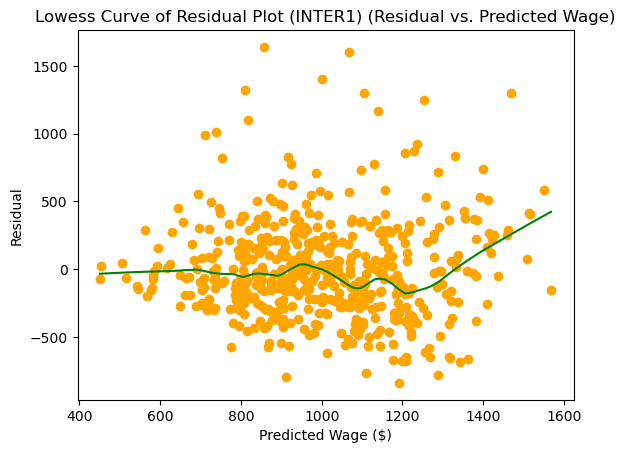

In [103]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_inter1,resid_fs2_inter1, color='orange')
z1 = lowess(resid_fs2_inter1, fitted_fs2_inter1, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (INTER1) (Residual vs. Predicted Wage)')

#### Interaction Effect 2: based on cutting from forward selection 1 and (exper_urban)

In [104]:
train['exper_urban'] = train['exper'] * train['urban']

model_fs2_inter2 = smf.ols(formula='wage ~ educ + exper + urban + IQ + married + feduc + age + exper_urban', data=train)
reg_fs2_inter2 = model_fs2_inter2.fit(cov_type='HC0')
resid_fs2_inter2 = reg_fs2_inter2.resid
fitted_fs2_inter2 = reg_fs2_inter2.fittedvalues
reg_fs2_inter2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.236
Method:                 Least Squares   F-statistic:                     21.15
Date:                Wed, 22 May 2024   Prob (F-statistic):           7.67e-28
Time:                        20:51:38   Log-Likelihood:                -3827.5
No. Observations:                 524   AIC:                             7673.
Df Residuals:                     515   BIC:                             7711.
Df Model:                           8                                         
Covariance Type:                  HC0                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1376.4203    239.173     -5.755      0.000   -1845.190    -907.650
educ           35.7297      9.688      3.688      0.000      16.742      54.717
exper          17.9879      8.254      2.179      0.029       1.810      34.166
urban         301.1618    113.896      2.644      0.008      77.929     524.394
IQ              4.6981      1.124      4.181      0.000       2.496       6.901
married       179.7512     52.384      3.431      0.001      77.081     282.421
feduc          19.6165      5.182      3.785      0.000       9.459      29.774
age            21.5909      6.871      3.142      0.002       8.124      35.057
exper_urban   -12.2072      9.217     -1.324      0.185     -30.271       5.857
==============================================================================
Omnibus:                       98.869   Durbin-Watson:                   1.875
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              219.345
Skew:                           0.999   Prob(JB):                     2.34e-48
Kurtosis:                       5.460   Cond. No.                     1.63e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.63e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [105]:
# SER
reg_fs2_inter2.mse_resid**0.5

362.9117926342422

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (INTER2) (Residual vs. Predicted Wage)')

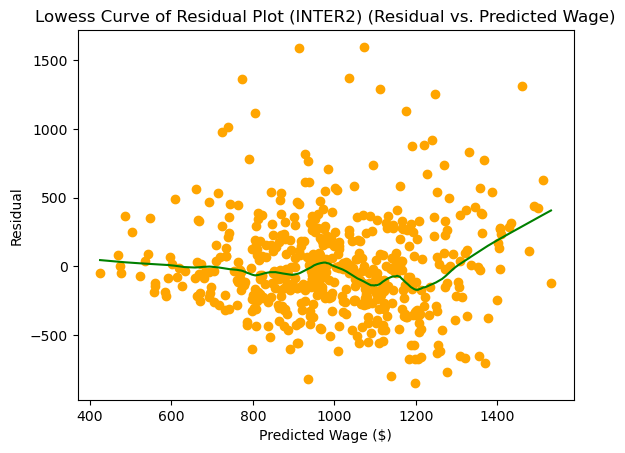

In [106]:
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_inter2,resid_fs2_inter2, color='orange')
z1 = lowess(resid_fs2_inter2, fitted_fs2_inter2, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (INTER2) (Residual vs. Predicted Wage)')

#### Interaction Effect 3: based on cutting from forward selection 1 and (age_married)

In [107]:
train['age_married'] = train['age'] * train['married']

model_fs2_inter3 = smf.ols(formula='wage ~ educ + exper + urban + IQ + married + feduc + age + age_married', data=train)
reg_fs2_inter3 = model_fs2_inter3.fit(cov_type='HC0')
resid_fs2_inter3 = reg_fs2_inter3.resid
fitted_fs2_inter3 = reg_fs2_inter3.fittedvalues
reg_fs2_inter3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.248
Model:                            OLS   Adj. R-squared:                  0.237
Method:                 Least Squares   F-statistic:                     22.14
Date:                Wed, 22 May 2024   Prob (F-statistic):           4.47e-29
Time:                        20:51:38   Log-Likelihood:                -3827.4
No. Observations:                 524   AIC:                             7673.
Df Residuals:                     515   BIC:                             7711.
Df Model:                           8                                         
Covariance Type:                  HC0                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept    -321.4548    653.012     -0.492      0.623   -1601.334     958.424
educ           37.5263      9.689      3.873      0.000      18.536      56.517
exper           9.6730      5.823      1.661      0.097      -1.739      21.085
urban         157.3959     34.372      4.579      0.000      90.028     224.763
IQ              4.4832      1.138      3.938      0.000       2.252       6.714
married      -824.7528    659.266     -1.251      0.211   -2116.891     467.385
feduc          18.9642      5.188      3.656      0.000       8.796      29.132
age            -7.7482     19.482     -0.398      0.691     -45.932      30.436
age_married    30.9379     19.676      1.572      0.116      -7.627      69.502
==============================================================================
Omnibus:                      100.772   Durbin-Watson:                   1.896
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              229.491
Skew:                           1.007   Prob(JB):                     1.47e-50
Kurtosis:                       5.541   Cond. No.                     6.55e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 6.55e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [108]:
# SER
reg_fs2_inter3.mse_resid**0.5

362.82521754689213

#### Interaction Effect 4: based on cutting from forward selection 1 and (urban_feduc)

In [281]:
train['urban_feduc'] = train['urban'] * train['feduc']

model_fs2_inter4 = smf.ols(formula='wage ~ educ + exper + urban + IQ + married + feduc + age + urban_feduc', data=train)
reg_fs2_inter4 = model_fs2_inter4.fit(cov_type='HC0')
resid_fs2_inter4 = reg_fs2_inter4.resid
fitted_fs2_inter4 = reg_fs2_inter4.fittedvalues
reg_fs2_inter4.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.251
Model:                            OLS   Adj. R-squared:                  0.239
Method:                 Least Squares   F-statistic:                     21.52
Date:                Thu, 23 May 2024   Prob (F-statistic):           2.64e-28
Time:                        10:55:59   Log-Likelihood:                -3826.4
No. Observations:                 524   AIC:                             7671.
Df Residuals:                     515   BIC:                             7709.
Df Model:                           8                                         
Covariance Type:                  HC0                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1086.3475    228.423     -4.756      0.000   -1534.048    -638.648
educ           35.5013      9.714      3.655      0.000      16.462      54.540
exper           8.9526      5.755      1.556      0.120      -2.327      20.233
urban         -70.6063    111.748     -0.632      0.527    -289.628     148.415
IQ              4.7472      1.115      4.257      0.000       2.561       6.933
married       170.5651     52.267      3.263      0.001      68.125     273.006
feduc           1.7784      9.800      0.181      0.856     -17.430      20.987
age            21.3998      6.774      3.159      0.002       8.123      34.676
urban_feduc    23.3957     11.367      2.058      0.040       1.118      45.674
==============================================================================
Omnibus:                      100.179   Durbin-Watson:                   1.878
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              225.584
Skew:                           1.006   Prob(JB):                     1.04e-49
Kurtosis:                       5.507   Cond. No.                     1.65e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.65e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [202]:
# SER
reg_fs2_inter4.mse_resid**0.5

362.1401966948092

- with these four different interaction effect, the last two of age-married and urban_feduc has better performance

#### Interaction Effect 5: use interaction of exper and south to do the forward selection

exper_south is also supposed to have interaction effect on the wage. however, since the reduced model from the first full forward selection model does not include the regressor of south, we add the exper_south in a new FS with all other regressors

In [512]:
train['exper_south'] = train['exper'] * train['south']

In [518]:
model6_fs = forward_selected(train[['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc', 'exper_south']], 'wage', nominated=['exper', 'educ'])

you nominated variable(s) ['exper', 'educ'], the adj_r2 is: 0.139237
adding urban increases adj_r2 from 0.139237 to 0.167961
adding IQ increases adj_r2 from 0.167961 to 0.189929
adding married increases adj_r2 from 0.189929 to 0.205582
adding feduc increases adj_r2 from 0.205582 to 0.219864
adding age increases adj_r2 from 0.219864 to 0.234519
adding south increases adj_r2 from 0.234519 to 0.237232
adding exper_south increases adj_r2 from 0.237232 to 0.241227
adding KWW increases adj_r2 from 0.241227 to 0.242249
adding meduc increases adj_r2 from 0.242249 to 0.242360
final model is wage ~ exper + educ + urban + IQ + married + feduc + age + south + exper_south + KWW + meduc + 1, with adj_r2 of 0.242360


In [537]:
model_fs2_inter5 = smf.ols(formula='wage ~ exper + educ + urban + IQ + married + feduc + age + south + exper_south', data=train)
reg_fs2_inter5 = model_fs2_inter5.fit(cov_type='HC0')
resid_fs2_inter5 = reg_fs2_inter5.resid
fitted_fs2_inter5 = reg_fs2_inter5.fittedvalues
reg_fs2_inter5.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.254
Model:                            OLS   Adj. R-squared:                  0.241
Method:                 Least Squares   F-statistic:                     19.21
Date:                Thu, 23 May 2024   Prob (F-statistic):           8.85e-28
Time:                        22:57:47   Log-Likelihood:                -3825.3
No. Observations:                 524   AIC:                             7671.
Df Residuals:                     514   BIC:                             7713.
Df Model:                           9                                         
Covariance Type:                  HC0                                         
===============================================================================
                  coef    std err          z      P>|z|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept   -1126.0837    214.587     -5.248      0.000   -1546.666    -705.501
exper           4.0152      6.467      0.621      0.535      -8.660      16.691
educ           36.9444      9.621      3.840      0.000      18.088      55.801
urban         142.6101     34.805      4.097      0.000      74.394     210.826
IQ              4.3188      1.136      3.802      0.000       2.093       6.545
married       173.5008     51.814      3.349      0.001      71.948     275.054
feduc          18.7798      5.224      3.595      0.000       8.541      29.018
age            21.0235      6.742      3.118      0.002       7.809      34.238
south        -238.4279    114.656     -2.080      0.038    -463.150     -13.706
exper_south    15.8141      9.608      1.646      0.100      -3.018      34.646
==============================================================================
Omnibus:                      101.085   Durbin-Watson:                   1.888
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              223.149
Skew:                           1.022   Prob(JB):                     3.50e-49
Kurtosis:                       5.458   Cond. No.                     1.56e+03
==============================================================================

Notes:
[1] Standard Errors are heteroscedasticity robust (HC0)
[2] The condition number is large, 1.56e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [538]:
#SER
reg_fs2_inter5.mse_resid**0.5

361.7176868400314

**Regression spline (nonlinear effect)**

#### linear spline

In [115]:
xi1=train['exper'].quantile(.25)
xi2=train['exper'].quantile(.5)
xi3=train['exper'].quantile(.75)
train['Step1']=(train['exper']>xi1)*(train['exper']-xi1)**1
train['Step2']=(train['exper']>xi2)*(train['exper']-xi2)**1
train['Step3']=(train['exper']>xi3)*(train['exper']-xi3)**1
xi1, xi2, xi3

(8.0, 11.0, 15.0)

In [116]:
model1_fs = forward_selected(train[['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc','Step1','Step2','Step3']], 'wage', nominated=['educ', 'exper'])

you nominated variable(s) ['educ', 'exper'], the adj_r2 is: 0.139237
adding urban increases adj_r2 from 0.139237 to 0.167961
adding IQ increases adj_r2 from 0.167961 to 0.189929
adding married increases adj_r2 from 0.189929 to 0.205582
adding feduc increases adj_r2 from 0.205582 to 0.219864
adding age increases adj_r2 from 0.219864 to 0.234519
adding south increases adj_r2 from 0.234519 to 0.237232
adding KWW increases adj_r2 from 0.237232 to 0.237862
adding meduc increases adj_r2 from 0.237862 to 0.237994
final model is wage ~ educ + exper + urban + IQ + married + feduc + age + south + KWW + meduc + 1, with adj_r2 of 0.237994


None of the steps is added in the forward selection, but we will fit the model with 1,2,3 knots to see if it become better

In [117]:
# linear spline with 1 knot (We choose step3 as it gives us the lowest SER, though same R square and adjusted R square)
formula='wage ~ educ + exper + urban + IQ + married + feduc + age + south + KWW + meduc + Step3'
ols_spline1 = smf.ols(formula=formula, data=train).fit()
resid_spline1=ols_spline1.resid
fitted_spline1 = ols_spline1.fittedvalues
ols_spline1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.237
Method:                 Least Squares   F-statistic:                     15.75
Date:                Wed, 22 May 2024   Prob (F-statistic):           1.16e-26
Time:                        20:51:39   Log-Likelihood:                -3825.8
No. Observations:                 524   AIC:                             7676.
Df Residuals:                     512   BIC:                             7727.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1141.6019    240.016     -4.756      0.000   -1613.140    -670.064
educ          33.4279     10.361      3.226      0.001      13.073      53.783
exper         10.3949      5.811      1.789      0.074      -1.021      21.811
urban        146.0450     36.532      3.998      0.000      74.274     217.816
IQ             3.7999      1.382      2.750      0.006       1.085       6.514
married      176.9903     55.296      3.201      0.001      68.356     285.625
feduc         14.5526      6.247      2.330      0.020       2.280      26.825
age           17.8019      7.150      2.490      0.013       3.756      31.848
south        -60.4491     35.352     -1.710      0.088    -129.902       9.004
KWW            3.1283      2.798      1.118      0.264      -2.369       8.625
meduc          7.1689      6.995      1.025      0.306      -6.573      20.911
Step3         -9.0225     19.586     -0.461      0.645     -47.501      29.456
==============================================================================
Omnibus:                      109.278   Durbin-Watson:                   1.911
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              263.202
Skew:                           1.065   Prob(JB):                     7.02e-58
Kurtosis:                       5.742   Cond. No.                     1.78e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.78e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [118]:
ols_spline1.mse_resid**0.5

362.7662774056404

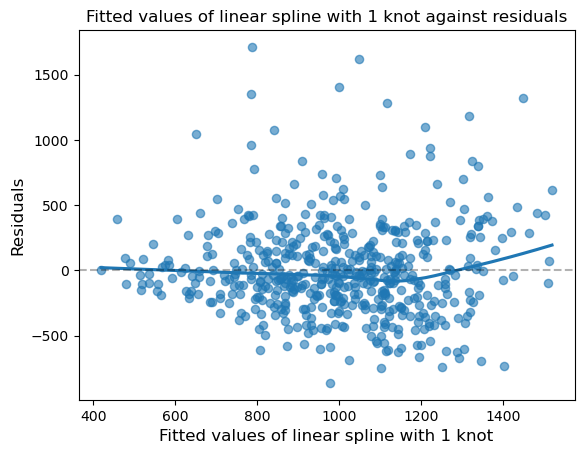

In [119]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline1, y=resid_spline1, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of linear spline with 1 knot',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of linear spline with 1 knot against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

In [120]:
# linear spline with 2 knots (We choose step1 and step2 as it gives us the lowest SER, though same R square and adjusted R square)
formula='wage ~ hours + IQ + KWW + educ + exper + tenure + age + married + black + south + urban + sibs + brthord + meduc+ feduc + Step1 + Step2'
ols_spline2 = smf.ols(formula=formula, data=train).fit()
resid_spline2=ols_spline2.resid
fitted_spline2 = ols_spline2.fittedvalues
ols_spline2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     10.38
Date:                Wed, 22 May 2024   Prob (F-statistic):           4.92e-24
Time:                        20:51:39   Log-Likelihood:                -3823.8
No. Observations:                 524   AIC:                             7684.
Df Residuals:                     506   BIC:                             7760.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -986.3137    297.398     -3.316      0.001   -1570.600    -402.028
hours         -2.3153      2.264     -1.023      0.307      -6.763       2.133
IQ             3.5562      1.426      2.494      0.013       0.754       6.358
KWW            3.1378      2.843      1.104      0.270      -2.448       8.723
educ          34.6687     10.684      3.245      0.001      13.678      55.659
exper          6.1591     15.759      0.391      0.696     -24.803      37.121
tenure         2.6496      3.410      0.777      0.438      -4.050       9.349
age           17.2828      7.634      2.264      0.024       2.285      32.281
married      168.9283     55.843      3.025      0.003      59.215     278.642
black        -65.5752     66.154     -0.991      0.322    -195.546      64.396
south        -47.6275     36.411     -1.308      0.191    -119.163      23.908
urban        152.9176     36.950      4.138      0.000      80.323     225.512
sibs          10.5504      9.362      1.127      0.260      -7.842      28.943
brthord      -17.2677     13.486     -1.280      0.201     -43.763       9.228
meduc          6.4003      7.218      0.887      0.376      -7.781      20.582
feduc         14.2675      6.302      2.264      0.024       1.885      26.650
Step1         11.4285     29.619      0.386      0.700     -46.763      69.620
Step2        -13.1895     23.375     -0.564      0.573     -59.114      32.735
==============================================================================
Omnibus:                      122.281   Durbin-Watson:                   1.922
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              324.891
Skew:                           1.148   Prob(JB):                     2.82e-71
Kurtosis:                       6.101   Cond. No.                     2.36e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.36e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [121]:
ols_spline2.mse_resid**0.5

363.5194434687832

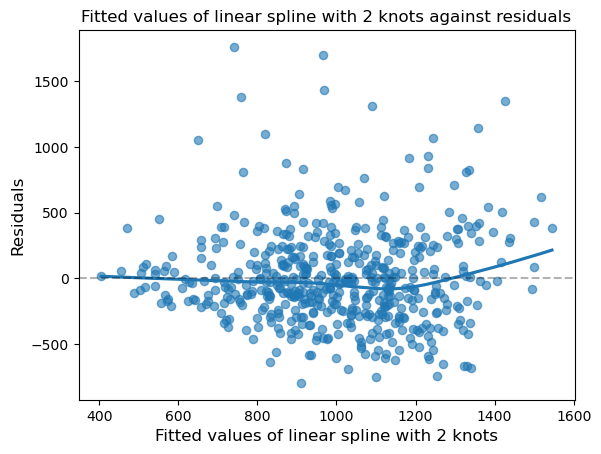

In [122]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline2, y=resid_spline2, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of linear spline with 2 knots',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of linear spline with 2 knots against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

In [123]:
# linear spline with 3 knots
formula='wage ~ hours + IQ + KWW + educ + exper + tenure + age + married + black + south + urban + sibs + brthord + meduc+ feduc + Step1 + Step2 + Step3'
ols_spline3 = smf.ols(formula=formula, data=train).fit()
resid_spline3=ols_spline3.resid
fitted_spline3 = ols_spline3.fittedvalues
ols_spline3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.232
Method:                 Least Squares   F-statistic:                     9.787
Date:                Wed, 22 May 2024   Prob (F-statistic):           1.58e-23
Time:                        20:51:39   Log-Likelihood:                -3823.8
No. Observations:                 524   AIC:                             7686.
Df Residuals:                     505   BIC:                             7766.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -983.3096    297.983     -3.300      0.001   -1568.749    -397.870
hours         -2.2923      2.269     -1.010      0.313      -6.749       2.165
IQ             3.5487      1.428      2.485      0.013       0.743       6.354
KWW            3.1566      2.847      1.109      0.268      -2.437       8.750
educ          34.7380     10.699      3.247      0.001      13.719      55.757
exper          6.3470     15.797      0.402      0.688     -24.688      37.382
tenure         2.6636      3.414      0.780      0.436      -4.043       9.371
age           17.1328      7.671      2.234      0.026       2.063      32.203
married      168.6072     55.915      3.015      0.003      58.753     278.461
black        -65.5802     66.217     -0.990      0.322    -195.674      64.514
south        -47.5771     36.446     -1.305      0.192    -119.182      24.028
urban        152.8716     36.985      4.133      0.000      80.207     225.536
sibs          10.4636      9.379      1.116      0.265      -7.962      28.889
brthord      -17.3811     13.508     -1.287      0.199     -43.920       9.158
meduc          6.3216      7.234      0.874      0.383      -7.890      20.533
feduc         14.3320      6.315      2.270      0.024       1.925      26.739
Step1          9.6408     30.717      0.314      0.754     -50.707      69.989
Step2         -8.5935     31.213     -0.275      0.783     -69.916      52.729
Step3         -6.5449     29.420     -0.222      0.824     -64.345      51.255
==============================================================================
Omnibus:                      123.264   Durbin-Watson:                   1.921
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              330.747
Skew:                           1.153   Prob(JB):                     1.51e-72
Kurtosis:                       6.136   Cond. No.                     2.36e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 2.36e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [124]:
ols_spline3.mse_resid**0.5

363.8613560456645

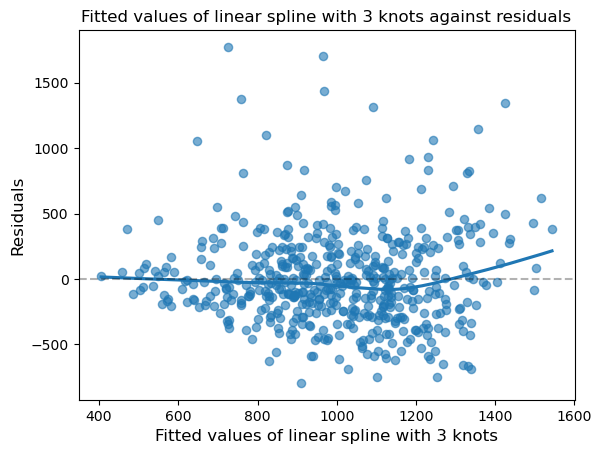

In [125]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline3, y=resid_spline3, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of linear spline with 3 knots',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of linear spline with 3 knots against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

The SER, R squared and adjusted R square didn't improve very much when adding 2 and 3 knots, the adjusted R square even decreased when adding 3 knots. So for the linear spline, adding only 1 knot is the best

**Qubic spline**

In [126]:
xi1=train['exper'].quantile(.25)
xi2=train['exper'].quantile(.5)
xi3=train['exper'].quantile(.75)
train['Step11']=(train['exper']>xi1)*(train['exper']-xi1)**3
train['Step21']=(train['exper']>xi2)*(train['exper']-xi2)**3
train['Step31']=(train['exper']>xi3)*(train['exper']-xi3)**3
xi1, xi2, xi3

(8.0, 11.0, 15.0)

In [127]:
model1_fs = forward_selected(train[['wage','hours','IQ','KWW','educ','exper','tenure','age','married','black','south','urban','sibs','brthord','meduc','feduc','Step11','Step21','Step31']], 'wage', nominated=['educ', 'exper'])

you nominated variable(s) ['educ', 'exper'], the adj_r2 is: 0.139237
adding urban increases adj_r2 from 0.139237 to 0.167961
adding IQ increases adj_r2 from 0.167961 to 0.189929
adding married increases adj_r2 from 0.189929 to 0.205582
adding feduc increases adj_r2 from 0.205582 to 0.219864
adding age increases adj_r2 from 0.219864 to 0.234519
adding south increases adj_r2 from 0.234519 to 0.237232
adding KWW increases adj_r2 from 0.237232 to 0.237862
adding meduc increases adj_r2 from 0.237862 to 0.237994
final model is wage ~ educ + exper + urban + IQ + married + feduc + age + south + KWW + meduc + 1, with adj_r2 of 0.237994


Again, none of the steps is added in the forward selection, but we will fit the model with 1,2,3 knots to see if it will become better.

In [128]:
# Cubic spline with 1 knot
formula='wage ~ educ + exper + urban + IQ + married + feduc + age + south + KWW + meduc + Step11'
ols_spline11 = smf.ols(formula=formula, data=train).fit()
resid_spline11=ols_spline11.resid
fitted_spline11 = ols_spline11.fittedvalues
ols_spline11.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.253
Model:                            OLS   Adj. R-squared:                  0.237
Method:                 Least Squares   F-statistic:                     15.75
Date:                Wed, 22 May 2024   Prob (F-statistic):           1.20e-26
Time:                        20:51:40   Log-Likelihood:                -3825.8
No. Observations:                 524   AIC:                             7676.
Df Residuals:                     512   BIC:                             7727.
Df Model:                          11                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1144.1376    245.892     -4.653      0.000   -1627.218    -661.057
educ          33.3999     10.399      3.212      0.001      12.969      53.830
exper         10.6859      6.592      1.621      0.106      -2.264      23.636
urban        145.9576     36.538      3.995      0.000      74.176     217.740
IQ             3.8028      1.383      2.750      0.006       1.086       6.519
married      177.4489     55.319      3.208      0.001      68.769     286.128
feduc         14.4760      6.246      2.318      0.021       2.205      26.747
age           17.8376      7.252      2.460      0.014       3.590      32.085
south        -60.4361     35.355     -1.709      0.088    -129.895       9.023
KWW            3.1320      2.798      1.119      0.264      -2.365       8.629
meduc          7.1914      6.995      1.028      0.304      -6.552      20.934
Step11        -0.0269      0.071     -0.379      0.705      -0.166       0.112
==============================================================================
Omnibus:                      109.173   Durbin-Watson:                   1.911
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              262.722
Skew:                           1.064   Prob(JB):                     8.92e-58
Kurtosis:                       5.739   Cond. No.                     7.06e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 7.06e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [129]:
ols_spline11.mse_resid**0.5

362.7904574212068

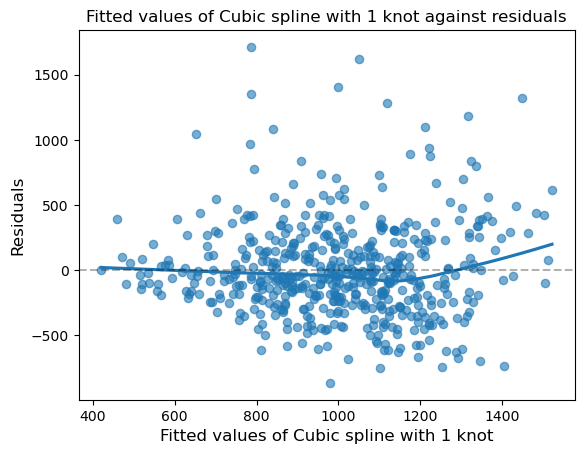

In [130]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline11, y=resid_spline11, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of Cubic spline with 1 knot',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of Cubic spline with 1 knot against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

In [131]:
# linear spline with 2 knots 
formula='wage ~ hours + IQ + KWW + educ + exper + tenure + age + married + black + south + urban + sibs + brthord + meduc+ feduc + Step11 + Step21'
ols_spline21 = smf.ols(formula=formula, data=train).fit()
resid_spline21=ols_spline21.resid
fitted_spline21 = ols_spline21.fittedvalues
ols_spline21.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.259
Model:                            OLS   Adj. R-squared:                  0.234
Method:                 Least Squares   F-statistic:                     10.39
Date:                Wed, 22 May 2024   Prob (F-statistic):           4.70e-24
Time:                        20:51:40   Log-Likelihood:                -3823.7
No. Observations:                 524   AIC:                             7683.
Df Residuals:                     506   BIC:                             7760.
Df Model:                          17                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1047.4818    287.709     -3.641      0.000   -1612.733    -482.231
hours         -2.2762      2.259     -1.008      0.314      -6.715       2.162
IQ             3.5639      1.425      2.500      0.013       0.763       6.364
KWW            3.1176      2.846      1.095      0.274      -2.474       8.710
educ          33.6516     10.693      3.147      0.002      12.643      54.660
exper         13.2839      8.952      1.484      0.138      -4.304      30.872
tenure         2.9231      3.417      0.855      0.393      -3.790       9.637
age           18.2521      7.675      2.378      0.018       3.173      33.332
married      170.7455     55.711      3.065      0.002      61.291     280.200
black        -62.0371     65.899     -0.941      0.347    -191.506      67.432
south        -48.9903     36.341     -1.348      0.178    -120.387      22.407
urban        152.4020     36.940      4.126      0.000      79.828     224.976
sibs          10.3774      9.364      1.108      0.268      -8.019      28.774
brthord      -17.1652     13.516     -1.270      0.205     -43.719       9.388
meduc          6.3837      7.224      0.884      0.377      -7.809      20.576
feduc         14.0655      6.287      2.237      0.026       1.714      26.417
Step11        -0.1957      0.361     -0.542      0.588      -0.906       0.514
Step21         0.3495      0.761      0.459      0.646      -1.146       1.845
==============================================================================
Omnibus:                      121.682   Durbin-Watson:                   1.921
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              321.899
Skew:                           1.144   Prob(JB):                     1.26e-70
Kurtosis:                       6.084   Cond. No.                     8.75e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.75e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [132]:
ols_spline21.mse_resid**0.5

363.4837853624132

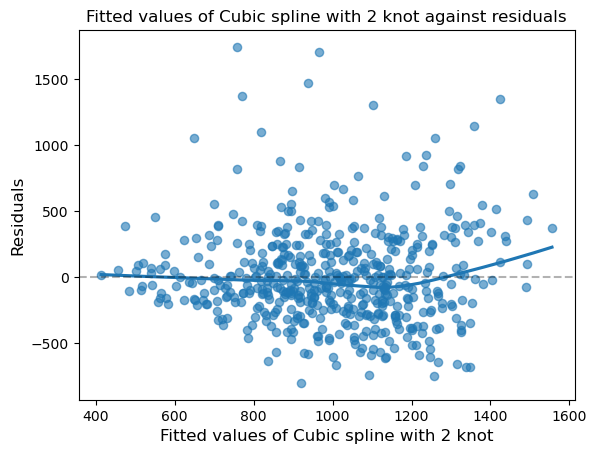

In [133]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline21, y=resid_spline21, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of Cubic spline with 2 knot',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of Cubic spline with 2 knot against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

In [134]:
# linear spline with 3 knots 
formula='wage ~ hours + IQ + KWW + educ + exper + tenure + age + married + black + south + urban + sibs + brthord + meduc+ feduc + Step11 + Step21 + Step31'
ols_spline31 = smf.ols(formula=formula, data=train).fit()
resid_spline31=ols_spline31.resid
fitted_spline31 = ols_spline31.fittedvalues
ols_spline31.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.261
Model:                            OLS   Adj. R-squared:                  0.235
Method:                 Least Squares   F-statistic:                     9.913
Date:                Wed, 22 May 2024   Prob (F-statistic):           7.38e-24
Time:                        20:51:40   Log-Likelihood:                -3822.9
No. Observations:                 524   AIC:                             7684.
Df Residuals:                     505   BIC:                             7765.
Df Model:                          18                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept   -989.7759    291.064     -3.401      0.001   -1561.621    -417.931
hours         -2.2606      2.258     -1.001      0.317      -6.696       2.175
IQ             3.5473      1.425      2.490      0.013       0.748       6.346
KWW            2.9301      2.848      1.029      0.304      -2.666       8.526
educ          33.7222     10.687      3.155      0.002      12.726      54.718
exper          7.8417      9.911      0.791      0.429     -11.630      27.313
tenure         3.3246      3.429      0.969      0.333      -3.413      10.062
age           17.7307      7.681      2.308      0.021       2.639      32.822
married      165.6392     55.820      2.967      0.003      55.970     275.308
black        -65.9122     65.928     -1.000      0.318    -195.439      63.615
south        -48.5021     36.320     -1.335      0.182    -119.859      22.855
urban        153.6372     36.930      4.160      0.000      81.083     226.192
sibs           9.0715      9.414      0.964      0.336      -9.423      27.566
brthord      -16.4695     13.518     -1.218      0.224     -43.028      10.089
meduc          5.9632      7.227      0.825      0.410      -8.235      20.162
feduc         14.8899      6.316      2.357      0.019       2.481      27.299
Step11         0.3843      0.580      0.662      0.508      -0.756       1.525
Step21        -1.5972      1.704     -0.937      0.349      -4.946       1.751
Step31         4.1206      3.229      1.276      0.202      -2.223      10.464
==============================================================================
Omnibus:                      113.471   Durbin-Watson:                   1.911
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              278.800
Skew:                           1.096   Prob(JB):                     2.88e-61
Kurtosis:                       5.822   Cond. No.                     8.87e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 8.87e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [135]:
ols_spline31.mse_resid**0.5

363.2581354567031

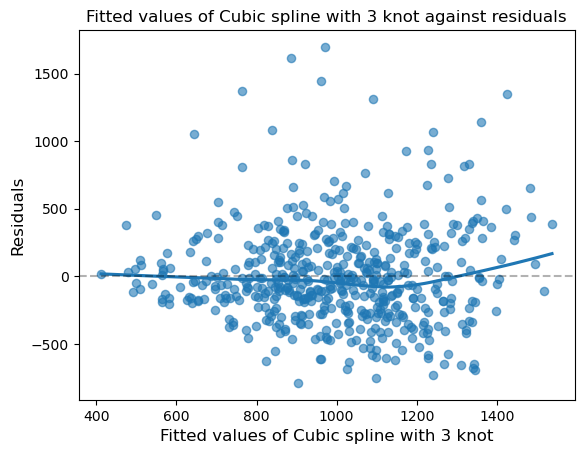

In [136]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline31, y=resid_spline31, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of Cubic spline with 3 knot',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of Cubic spline with 3 knot against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

The SER, R squared and adjusted R didn't improve after using cubic spline. 

So we finally choose a linear spline with 1 knot since this will make the model less complicated, thus avoiding the over-fitting problem.

**We Re-fit the linear spline model of the 'reduced FS' plus 3 knots.**

In [137]:
formula='wage ~ educ + exper + urban + IQ + married + feduc + age + Step1+ Step2 +Step3'
ols_spline0 = smf.ols(formula=formula, data=train).fit()
resid_spline0=ols_spline0.resid
fitted_spline0 = ols_spline0.fittedvalues
ols_spline0.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.245
Model:                            OLS   Adj. R-squared:                  0.231
Method:                 Least Squares   F-statistic:                     16.68
Date:                Wed, 22 May 2024   Prob (F-statistic):           3.12e-26
Time:                        20:51:40   Log-Likelihood:                -3828.4
No. Observations:                 524   AIC:                             7679.
Df Residuals:                     513   BIC:                             7726.
Df Model:                          10                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept  -1261.8953    256.421     -4.921      0.000   -1765.659    -758.132
educ          36.2013     10.441      3.467      0.001      15.688      56.714
exper          5.9066     15.652      0.377      0.706     -24.843      36.656
urban        158.2100     36.129      4.379      0.000      87.230     229.190
IQ             4.7518      1.299      3.657      0.000       2.199       7.304
married      175.7164     55.631      3.159      0.002      66.423     285.009
feduc         19.3511      5.513      3.510      0.000       8.519      30.183
age           21.4458      6.976      3.074      0.002       7.740      35.152
Step1         12.1027     30.360      0.399      0.690     -47.542      71.748
Step2         -8.9298     31.012     -0.288      0.774     -69.856      51.997
Step3         -6.8575     29.277     -0.234      0.815     -64.376      50.661
==============================================================================
Omnibus:                      105.463   Durbin-Watson:                   1.890
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              249.017
Skew:                           1.037   Prob(JB):                     8.44e-55
Kurtosis:                       5.666   Cond. No.                     1.79e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 1.79e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

In [138]:
ols_spline0.mse_resid**0.5

364.2310129271776

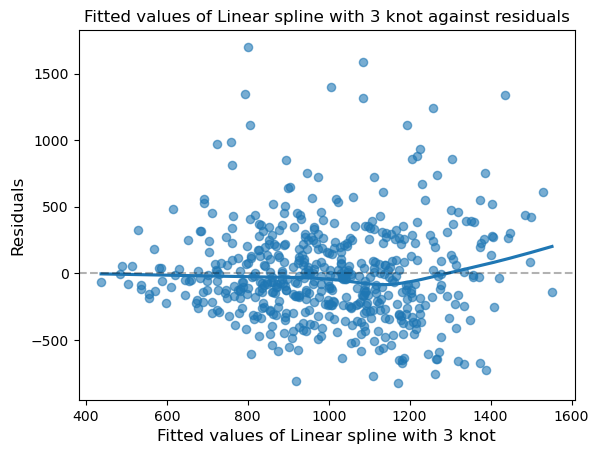

In [139]:
fig, ax= plt.subplots()
sns.regplot(x=fitted_spline0, y=resid_spline0, lowess=True, ax=ax, scatter_kws={'s': 35, 'alpha': .6})
ax.set_xlabel('Fitted values of Linear spline with 3 knot',  {'fontsize': 12})
ax.set_ylabel('Residuals', {'fontsize': 12})
ax.set_title('Fitted values of Linear spline with 3 knot against residuals')
plt.axhline(color='Black', alpha=0.3, linestyle='--')

In [327]:
# formula='wage ~ educ + exper + urban + IQ + np.power(IQ, 2)+ np.power(IQ, 3) + married + feduc + age + educ_age'
# ols_ttt = smf.ols(formula=formula, data=train).fit()
# resid_ttt = ols_ttt.resid
# fitted_ttt = ols_ttt.fittedvalues
# ols_ttt.summary()

**Calculate the SER, $R^2$ and $R^2_{adj}$ values for each model above and find the optimal model**

A table summarising the training sample predictions from each model follows:

| Model            |   SER  | $R^2$ | $R^2_{adj}$ |  p  |
|-----------------------|--------|-------|-------------|-----|
| Linear - full       | 362.920  | 25.8  | 23.6 |  15  |
| Linear - with exper and educ|385.261  | 14.3 |13.9  |2|
| Linear - with exper and educ and OVBs|375.845  | 18.7 |18.1  |4|
| FS1 - full          |  362.488| 25.3  |  23.8 |  10  |
| FS1 - reduced model | 363.313  |24.5 |23.5| 7 |
| Log wage vs IQ - FS1 - reduced model(Duan)| 361.493 | 25.2 | 24.2 | 7|
| Log wage vs IQ - FS2 full(Duan)| 362.226 | 25.5 | 23.9 | 11 |
| Log wage vs IQ - FS2 - reduced model(Duan)| 361.134 | 25.5 | 24.4 | 8 |
| Interaction - age-married - FS1 - reduced model| 362.825 | 24.8 |23.7 | 8|
| Interaction - urban_feduc - FS1 - reduced model| 362.140 | 25.1 |23.9 | 8|
| Interaction - exper_south - FS3 - reduced model| 362.766 | 25.4 |24.1 | 9|
| Linear spline - FS full - 1 knot |  362.766 | 25.3  |  23.7 | 11  |
| Linear spline - FS reduced - 3 knots |  364.231 | 24.5  |  23.1 | 10  |

- rank1: Log wage vs IQ - FS2 - reduced model(Duan)
- rank2: Log wage vs IQ - FS1 - reduced model(Duan)
- rank3: Interaction - exper_south - FS3 - reduced model

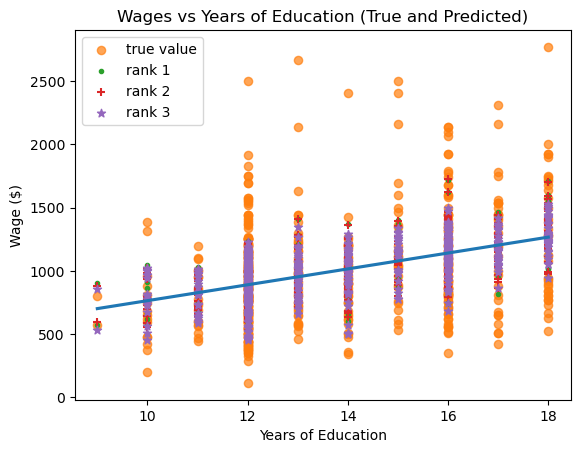

In [671]:
tableau=['#1F77B4', '#FF7F0E', '#2CA02C', '#DB2728', '#9467BD', '#8c564b', '#e377c2', '#7f7f7f']
fig, ax= plt.subplots()
sns.regplot(x=train['educ'], y=train['wage'], ci=None, scatter_kws={'s': 35, 'color': tableau[1], 'alpha': 0.7}, label = 'true value')
plt.scatter(train['educ'], TS_fs_lwage_r_IQ1, c= tableau[2], marker='.', label = 'rank 1')   # green dots - rank1
plt.scatter(train['educ'], TS_lwage_IQ1, c= tableau[3], marker='+', label = 'rank 2')   # red plus - rank2
plt.scatter(train['educ'], fitted_fs2_inter5, c= tableau[4], marker='*', label = 'rank 3') #purple * - rank3
plt.xlabel('Years of Education')
plt.ylabel('Wage ($)')
plt.title('Wages vs Years of Education (True and Predicted)')
plt.legend()
plt.show()

- these model are really close to each other
- but purple has slightly lower range
- we keep the rank

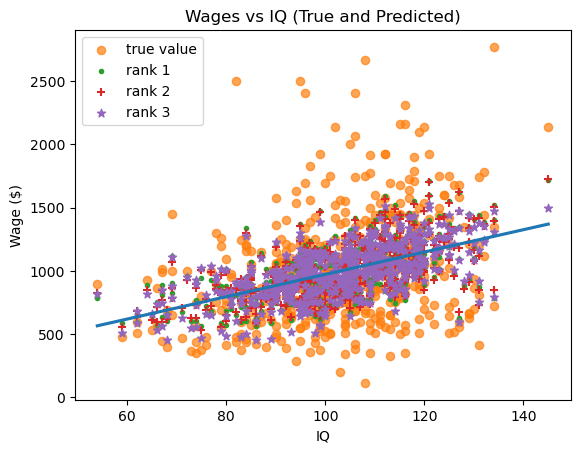

In [672]:
tableau=['#1F77B4', '#FF7F0E', '#2CA02C', '#DB2728', '#9467BD', '#8c564b', '#e377c2', '#7f7f7f']
fig, ax= plt.subplots()
sns.regplot(x=train['IQ'], y=train['wage'], ci=None, scatter_kws={'s': 35, 'color': tableau[1], 'alpha': 0.7}, label = 'true value')
plt.scatter(train['IQ'], TS_fs_lwage_r_IQ1, c= tableau[2], marker='.', label = 'rank 1')   # green dots - rank1
plt.scatter(train['IQ'], TS_lwage_IQ1, c= tableau[3], marker='+', label = 'rank 2')   # red plus - rank2
plt.scatter(train['IQ'], fitted_fs2_inter5, c= tableau[4], marker='*', label = 'rank 3') #purple * - rank3
plt.xlabel('IQ')
plt.ylabel('Wage ($)')
plt.title('Wages vs IQ (True and Predicted)')
plt.legend()
plt.show()

##### Assumption assessment for optimal model - Log wage vs IQ - FS2 - reduced model(Duan)

In [ ]:
# #Cut the final model from the forward selection with transformation (log wage)
# model_fs4_r1 = smf.ols(formula='lwage ~ educ + exper + urban + IQ + married + south + age + feduc', data=train)
# reg_fs4_r1 = model_fs4_r1.fit()
# resid_fs4_r1 = reg_fs4_r1.resid
# fitted_fs4_r1 = reg_fs4_r1.fittedvalues
# reg_fs4_r1.summary()

Text(0.5, 0.98, 'Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')

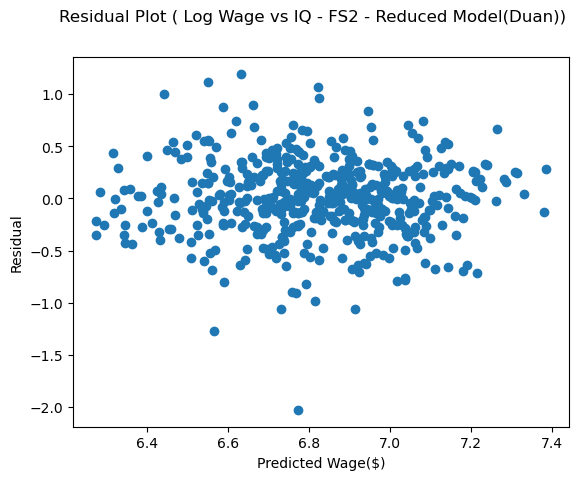

In [623]:
plt.scatter(fitted_fs4_r1,resid_fs4_r1)
plt.xlabel('Predicted Wage($)')
plt.ylabel('Residual')
plt.suptitle('Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')

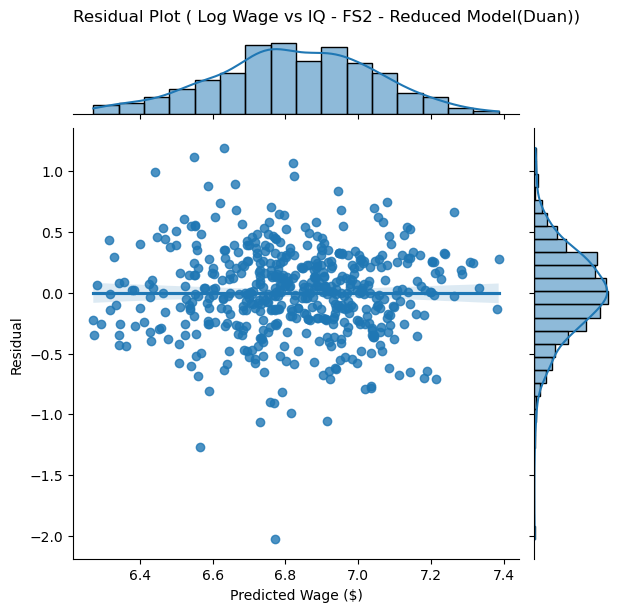

In [624]:
sns.jointplot(x=fitted_fs4_r1, y=resid_fs4_r1, kind="reg")
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.subplots_adjust(top= 0.93)
plt.suptitle('Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')
plt.show()

Text(0.5, 1.0, 'Lowess Curve of Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')

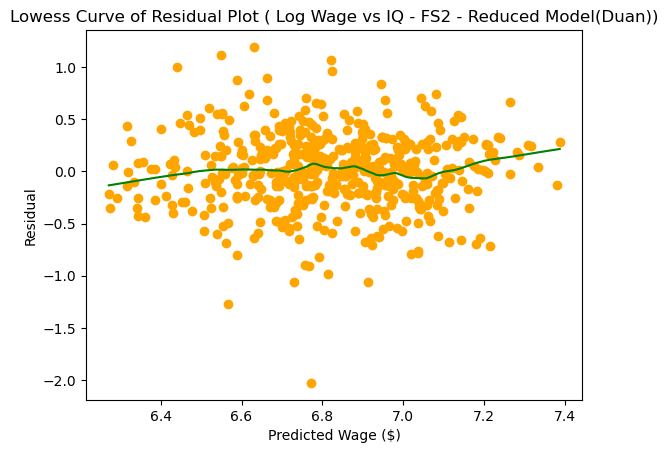

In [625]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs4_r1,resid_fs4_r1, color='orange')
z1 = lowess(resid_fs4_r1, fitted_fs4_r1, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')

Text(0.5, 1.0, 'Squared Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')

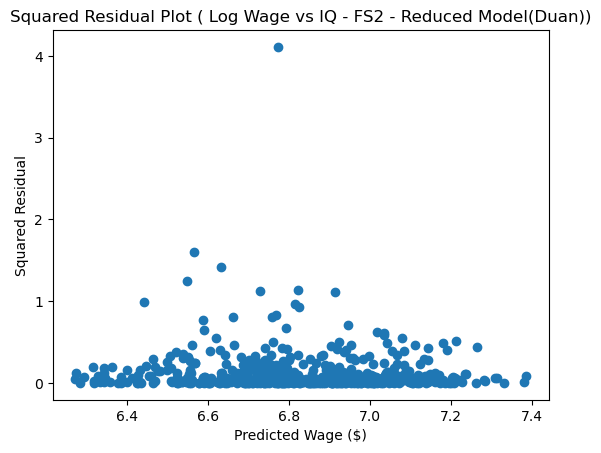

In [626]:
resid_fs4_r1_squared=resid_fs4_r1**2
plt.scatter(fitted_fs4_r1,resid_fs4_r1_squared)
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Squared Residual')
plt.title('Squared Residual Plot ( Log Wage vs IQ - FS2 - Reduced Model(Duan))')

Text(0, 0.5, 'Residual')

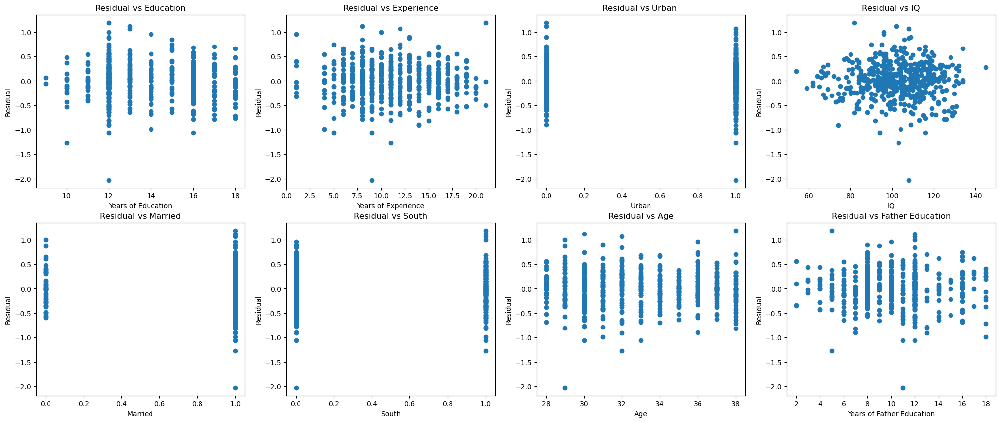

In [627]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)
ax8 = fig.add_subplot(2,4,8)

ax1.scatter(train['educ'],resid_fs4_r1)
ax1.set_title("Residual vs Education")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Residual')

ax2.scatter(train['exper'], resid_fs4_r1)
ax2.set_title("Residual vs Experience")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Residual')

ax3.scatter(train['urban'], resid_fs4_r1)
ax3.set_title("Residual vs Urban ")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Residual')

ax4.scatter(train['IQ'], resid_fs4_r1)
ax4.set_title("Residual vs IQ")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Residual')

ax5.scatter(train['married'], resid_fs4_r1)
ax5.set_title("Residual vs Married")
ax5.set_xlabel('Married')
ax5.set_ylabel('Residual')

ax6.scatter(train['south'], resid_fs4_r1)
ax6.set_title("Residual vs South")
ax6.set_xlabel('South')
ax6.set_ylabel('Residual')

ax7.scatter(train['age'], resid_fs4_r1)
ax7.set_title("Residual vs Age")
ax7.set_xlabel('Age')
ax7.set_ylabel('Residual')

ax8.scatter(train['feduc'], resid_fs4_r1)
ax8.set_title("Residual vs Father Education")
ax8.set_xlabel('Years of Father Education')
ax8.set_ylabel('Residual')

Text(0, 0.5, 'Residual')

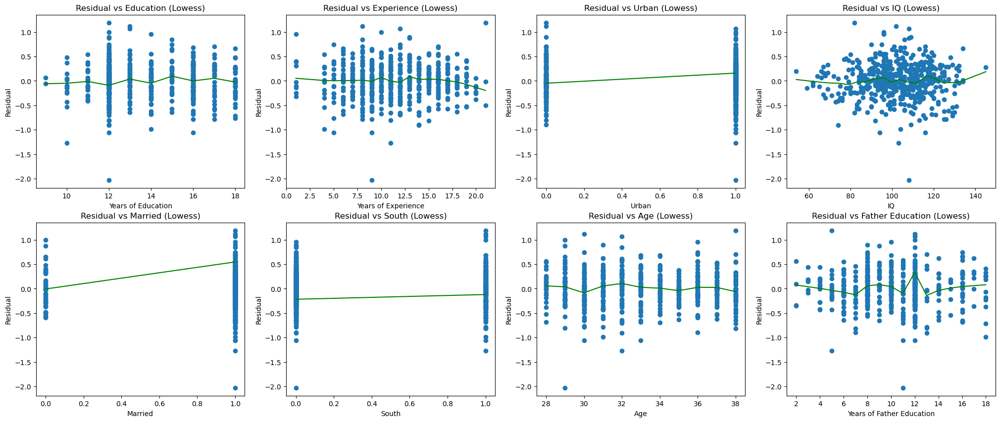

In [628]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)
ax8 = fig.add_subplot(2,4,8)

# import statsmodels.api as sm
# lowess = sm.nonparametric.lowess
# plt.scatter(train['educ'],resid_OVB, color='orange')
# z1 = lowess(resid_OVB, train['educ'], frac=1./5)
# plt.plot(z1[:,0],z1[:,1],'green')

# plt.xlabel('Years of Education')
# plt.ylabel('Residual')
# plt.title('Lowess Curve of Residual Plot with OVBs (Residual vs. Education)')

ax1.scatter(train['educ'],resid_fs4_r1)
z1 = lowess(resid_fs4_r1, train['educ'], frac=1./5)
ax1.plot(z1[:,0],z1[:,1],'green')
ax1.set_title("Residual vs Education (Lowess)")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Residual')

ax2.scatter(train['exper'], resid_fs4_r1)
z2 = lowess(resid_fs4_r1, train['exper'], frac=1./5)
ax2.plot(z2[:,0],z2[:,1],'green')
ax2.set_title("Residual vs Experience (Lowess)")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Residual')

ax3.scatter(train['urban'], resid_fs4_r1)
z3 = lowess(resid_fs4_r1, train['urban'], frac=1./5)
ax3.plot(z3[:,0],z3[:,1],'green')
ax3.set_title("Residual vs Urban (Lowess)")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Residual')

ax4.scatter(train['IQ'], resid_fs4_r1)
z4 = lowess(resid_fs4_r1, train['IQ'], frac=1./5)
ax4.plot(z4[:,0],z4[:,1],'green')
ax4.set_title("Residual vs IQ (Lowess)")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Residual')

ax5.scatter(train['married'], resid_fs4_r1)
z5 = lowess(resid_fs4_r1, train['married'], frac=1./5)
ax5.plot(z5[:,0],z5[:,1],'green')
ax5.set_title("Residual vs Married (Lowess)")
ax5.set_xlabel('Married')
ax5.set_ylabel('Residual')

ax6.scatter(train['south'], resid_fs4_r1)
z6 = lowess(resid_fs4_r1, train['south'], frac=1./5)
ax6.plot(z6[:,0],z6[:,1],'green')
ax6.set_title("Residual vs South (Lowess)")
ax6.set_xlabel('South')
ax6.set_ylabel('Residual')

ax7.scatter(train['age'], resid_fs4_r1)
z7 = lowess(resid_fs4_r1, train['age'], frac=1./5)
ax7.plot(z7[:,0],z7[:,1],'green')
ax7.set_title("Residual vs Age (Lowess)")
ax7.set_xlabel('Age')
ax7.set_ylabel('Residual')

ax8.scatter(train['feduc'], resid_fs4_r1)
z8 = lowess(resid_fs4_r1, train['feduc'], frac=1./5)
ax8.plot(z8[:,0],z8[:,1],'green')
ax8.set_title("Residual vs Father Education (Lowess)")
ax8.set_xlabel('Years of Father Education')
ax8.set_ylabel('Residual')

In [629]:
train[['educ', 'exper', 'urban', 'IQ', 'married', 'south', 'age', 'feduc']].corr()

,educ,exper,urban,IQ,married,south,age,feduc
educ,1.000000,-0.434877,0.125816,0.533993,-0.017682,-0.090896,0.058855,0.430178
exper,-0.434877,1.000000,-0.059788,-0.213809,0.070744,-0.053001,0.469856,-0.248742
urban,0.125816,-0.059788,1.000000,0.079964,-0.047287,-0.145016,-0.023418,0.135768
IQ,0.533993,-0.213809,0.079964,1.000000,0.017629,-0.174662,-0.027972,0.342669
married,-0.017682,0.070744,-0.047287,0.017629,1.000000,0.005519,0.070750,0.006229
south,-0.090896,-0.053001,-0.145016,-0.174662,0.005519,1.000000,-0.053355,-0.159811
age,0.058855,0.469856,-0.023418,-0.027972,0.070750,-0.053355,1.000000,-0.080866
feduc,0.430178,-0.248742,0.135768,0.342669,0.006229,-0.159811,-0.080866,1.000000


correlation higher than 0.5

- educ_IQ

- educ_age

- exper_urban

In [630]:
model_rank1_col1 = smf.ols(formula='educ ~ IQ', data= train)
reg_rank1_col1 = model_rank1_col1.fit()
reg_rank1_col1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   educ   R-squared:                       0.285
Model:                            OLS   Adj. R-squared:                  0.284
Method:                 Least Squares   F-statistic:                     208.2
Date:                Fri, 24 May 2024   Prob (F-statistic):           5.80e-40
Time:                        05:10:40   Log-Likelihood:                -1072.6
No. Observations:                 524   AIC:                             2149.
Df Residuals:                     522   BIC:                             2158.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept      5.4587      0.578      9.450      0.000       4.324       6.594
IQ             0.0802      0.006     14.430      0.000       0.069       0.091
==============================================================================
Omnibus:                       13.993   Durbin-Watson:                   2.033
Prob(Omnibus):                  0.001   Jarque-Bera (JB):               12.679
Skew:                           0.323   Prob(JB):                      0.00177
Kurtosis:                       2.596   Cond. No.                         732.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [631]:
model_rank1_col2 = smf.ols(formula='educ ~ age', data= train)
reg_rank1_col2 = model_rank1_col2.fit()
reg_rank1_col2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   educ   R-squared:                       0.003
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.814
Date:                Fri, 24 May 2024   Prob (F-statistic):              0.179
Time:                        05:11:00   Log-Likelihood:                -1159.6
No. Observations:                 524   AIC:                             2323.
Df Residuals:                     522   BIC:                             2332.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     12.2913      1.058     11.621      0.000      10.213      14.369
age            0.0430      0.032      1.347      0.179      -0.020       0.106
==============================================================================
Omnibus:                      145.291   Durbin-Watson:                   2.087
Prob(Omnibus):                  0.000   Jarque-Bera (JB):               40.399
Skew:                           0.438   Prob(JB):                     1.69e-09
Kurtosis:                       1.960   Cond. No.                         362.
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

In [632]:
model_rank1_col3 = smf.ols(formula='exper ~ urban', data= train)
reg_rank1_col3 = model_rank1_col3.fit()
reg_rank1_col3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  exper   R-squared:                       0.004
Model:                            OLS   Adj. R-squared:                  0.002
Method:                 Least Squares   F-statistic:                     1.873
Date:                Fri, 24 May 2024   Prob (F-statistic):              0.172
Time:                        05:11:29   Log-Likelihood:                -1493.3
No. Observations:                 524   AIC:                             2991.
Df Residuals:                     522   BIC:                             2999.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept     11.8611      0.349     33.968      0.000      11.175      12.547
urban         -0.5611      0.410     -1.368      0.172      -1.367       0.244
==============================================================================
Omnibus:                        9.332   Durbin-Watson:                   1.978
Prob(Omnibus):                  0.009   Jarque-Bera (JB):                5.620
Skew:                          -0.039   Prob(JB):                       0.0602
Kurtosis:                       2.499   Cond. No.                         3.59
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

- All r^2 are low, no need to worry about the problem of multicollinearity

##### Also goodness of fit, non-linear effect explaination and collinearity issue

- firstly, with adjted R^2, it is not quite good

Text(0, 0.5, 'Wage($)')

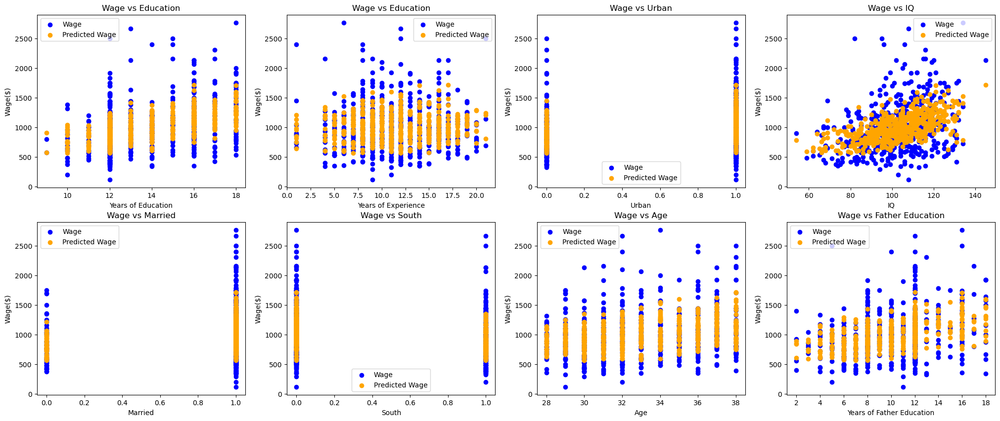

In [633]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)
ax8 = fig.add_subplot(2,4,8)

ax1.scatter(train['educ'], train['wage'], c='blue', label='Wage')
ax1.scatter(train['educ'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax1.legend()
ax1.set_title("Wage vs Education")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Wage($)')

ax2.scatter(train['exper'], train['wage'], c='blue', label='Wage')
ax2.scatter(train['exper'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax2.legend()
ax2.set_title("Wage vs Education")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Wage($)')

ax3.scatter(train['urban'], train['wage'], c='blue', label='Wage')
ax3.scatter(train['urban'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax3.legend()
ax3.set_title("Wage vs Urban")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Wage($)')

ax4.scatter(train['IQ'], train['wage'], c='blue', label='Wage')
ax4.scatter(train['IQ'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax4.legend()
ax4.set_title("Wage vs IQ")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Wage($)')

ax5.scatter(train['married'], train['wage'], c='blue', label='Wage')
ax5.scatter(train['married'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax5.legend()
ax5.set_title("Wage vs Married")
ax5.set_xlabel('Married')
ax5.set_ylabel('Wage($)')

ax6.scatter(train['south'], train['wage'], c='blue', label='Wage')
ax6.scatter(train['south'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax6.legend()
ax6.set_title("Wage vs South")
ax6.set_xlabel('South')
ax6.set_ylabel('Wage($)')

ax7.scatter(train['age'], train['wage'], c='blue', label='Wage')
ax7.scatter(train['age'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax7.legend()
ax7.set_title("Wage vs Age")
ax7.set_xlabel('Age')
ax7.set_ylabel('Wage($)')

ax8.scatter(train['feduc'], train['wage'], c='blue', label='Wage')
ax8.scatter(train['feduc'], TS_fs_lwage_r_IQ1, c='orange', label='Predicted Wage')
ax8.legend()
ax8.set_title("Wage vs Father Education")
ax8.set_xlabel('Years of Father Education')
ax8.set_ylabel('Wage($)')

- range of predicted wage is much smaller than the true value given all regressors
- the low goodness of fit and align with R^2

## Question 6

- Using (at least) the 3 best model specifications to generate forecast predictions in the“test” dataset for the wages.

- Present a summary table, and suitable plot(s), of the forecasts and their accuracy for these models, using the forecast measures RMSE, MAD and forecast R2. 

For the three best models, use the test data set to generate predictions for wage in the test sample.

- rank1: Log wage vs IQ - FS2 - reduced model(Duan)
- rank2: Log wage vs IQ - FS1 - reduced model(Duan)
- rank3: Interaction - exper_south - FS3 - reduced model

- we already done assessment for rank 1 model in question 4, we will do rank 2 and 3 here

#### Log wage vs IQ - FS1 - reduced model(Duan) assessment

In [ ]:
# model_fs2_tran5 = smf.ols(formula='lwage ~ educ + exper + urban + IQ + married + feduc + age', data=train)
# reg_fs2_tran5 = model_fs2_tran5.fit()
# resid_fs2_tran5 = reg_fs2_tran5.resid
# fitted_fs2_tran5 = reg_fs2_tran5.fittedvalues
# reg_fs2_tran5.summary()

# TS_lwage_IQ = np.exp(fitted_fs2_tran5) #Expo
# TS_lwage_IQ1 = np.exp(fitted_fs2_tran5) * fp1 #Duan
# TS_lwage_IQ11 = np.exp(fitted_fs2_tran5) * fp11 #Normal

Text(0.5, 0.98, 'Residual Plot ( Log wage vs IQ - FS1 - Reduced Model(Duan))')

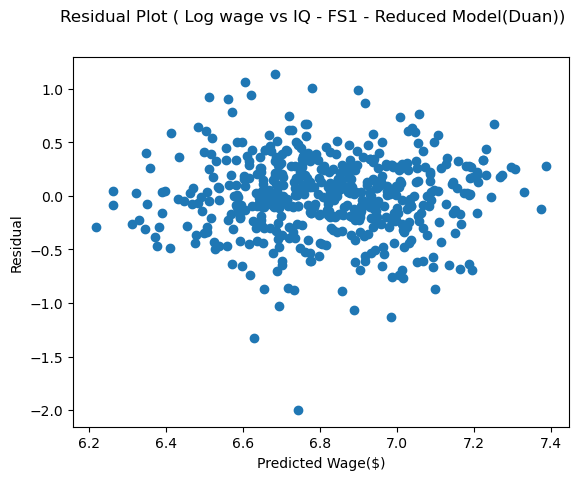

In [674]:
plt.scatter(fitted_fs2_tran5,resid_fs2_tran5)
plt.xlabel('Predicted Wage($)')
plt.ylabel('Residual')
plt.suptitle('Residual Plot ( Log Wage vs IQ - FS1 - Reduced Model(Duan))')

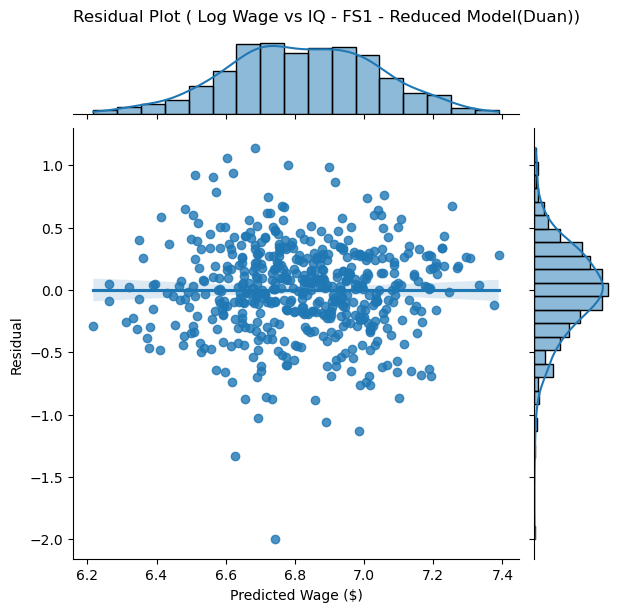

In [675]:
sns.jointplot(x=fitted_fs2_tran5, y=resid_fs2_tran5, kind="reg")
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.subplots_adjust(top= 0.93)
plt.suptitle('Residual Plot ( Log Wage vs IQ - FS1 - Reduced Model(Duan))')
plt.show()

Text(0.5, 1.0, 'Lowess Curve of Residual Plot (Log Wage vs IQ - FS1 - Reduced Model(Duan))')

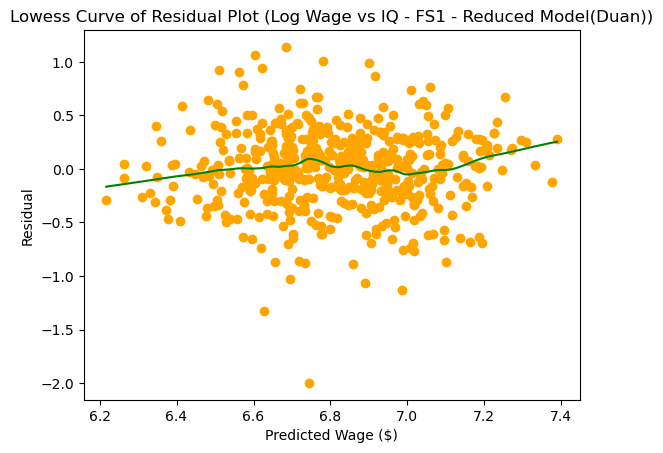

In [676]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_tran5,resid_fs2_tran5, color='orange')
z1 = lowess(resid_fs2_tran5, fitted_fs2_tran5, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot (Log Wage vs IQ - FS1 - Reduced Model(Duan))')

Text(0.5, 1.0, 'Squared Residual Plot ( Log Wage vs IQ - FS1 - Reduced Model(Duan))')

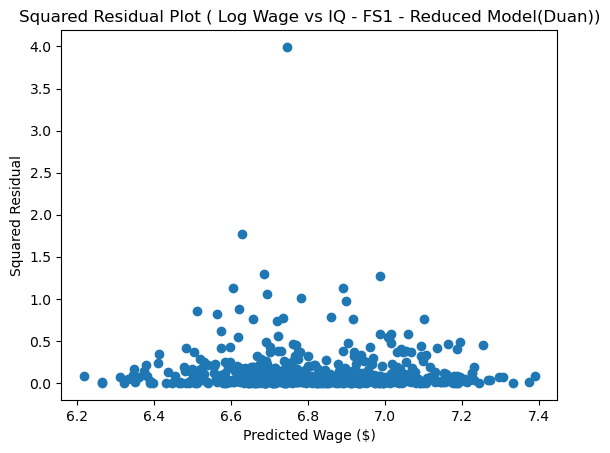

In [677]:
resid_fs2_tran5_squared=resid_fs2_tran5**2
plt.scatter(fitted_fs2_tran5,resid_fs2_tran5_squared)
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Squared Residual')
plt.title('Squared Residual Plot ( Log Wage vs IQ - FS1 - Reduced Model(Duan))')

Text(0, 0.5, 'Residual')

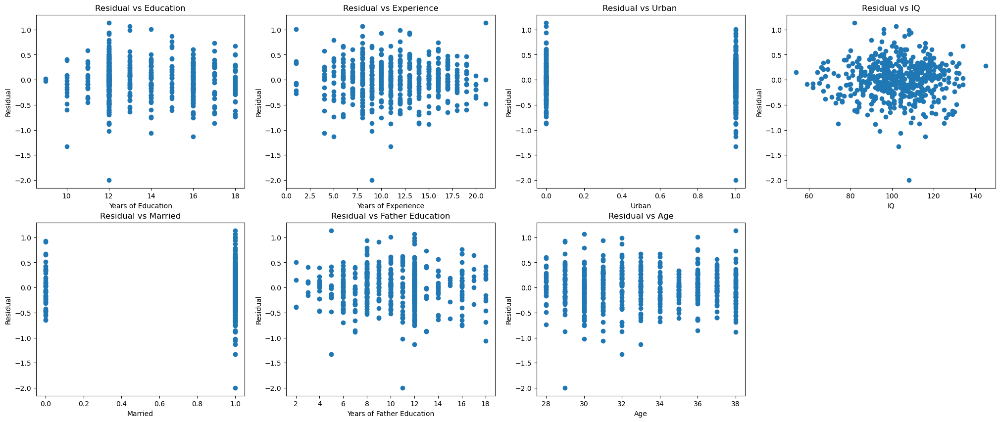

In [679]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)

ax1.scatter(train['educ'],resid_fs2_tran5)
ax1.set_title("Residual vs Education")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Residual')

ax2.scatter(train['exper'], resid_fs2_tran5)
ax2.set_title("Residual vs Experience")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Residual')

ax3.scatter(train['urban'], resid_fs2_tran5)
ax3.set_title("Residual vs Urban ")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Residual')

ax4.scatter(train['IQ'], resid_fs2_tran5)
ax4.set_title("Residual vs IQ")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Residual')

ax5.scatter(train['married'], resid_fs2_tran5)
ax5.set_title("Residual vs Married")
ax5.set_xlabel('Married')
ax5.set_ylabel('Residual')

ax6.scatter(train['feduc'], resid_fs2_tran5)
ax6.set_title("Residual vs Father Education")
ax6.set_xlabel('Years of Father Education')
ax6.set_ylabel('Residual')

ax7.scatter(train['age'], resid_fs2_tran5)
ax7.set_title("Residual vs Age")
ax7.set_xlabel('Age')
ax7.set_ylabel('Residual')

Text(0, 0.5, 'Residual')

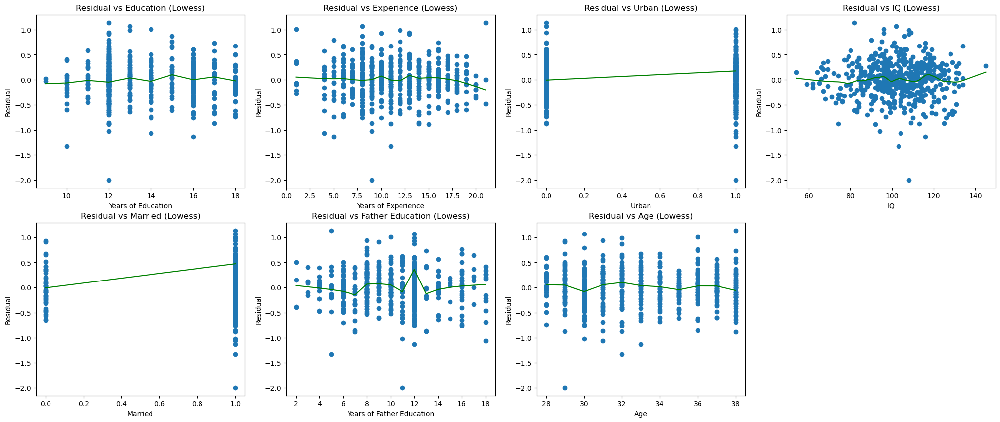

In [681]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)


ax1.scatter(train['educ'],resid_fs2_tran5)
z1 = lowess(resid_fs2_tran5, train['educ'], frac=1./5)
ax1.plot(z1[:,0],z1[:,1],'green')
ax1.set_title("Residual vs Education (Lowess)")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Residual')

ax2.scatter(train['exper'], resid_fs2_tran5)
z2 = lowess(resid_fs2_tran5, train['exper'], frac=1./5)
ax2.plot(z2[:,0],z2[:,1],'green')
ax2.set_title("Residual vs Experience (Lowess)")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Residual')

ax3.scatter(train['urban'], resid_fs2_tran5)
z3 = lowess(resid_fs2_tran5, train['urban'], frac=1./5)
ax3.plot(z3[:,0],z3[:,1],'green')
ax3.set_title("Residual vs Urban (Lowess)")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Residual')

ax4.scatter(train['IQ'], resid_fs2_tran5)
z4 = lowess(resid_fs2_tran5, train['IQ'], frac=1./5)
ax4.plot(z4[:,0],z4[:,1],'green')
ax4.set_title("Residual vs IQ (Lowess)")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Residual')

ax5.scatter(train['married'], resid_fs2_tran5)
z5 = lowess(resid_fs2_tran5, train['married'], frac=1./5)
ax5.plot(z5[:,0],z5[:,1],'green')
ax5.set_title("Residual vs Married (Lowess)")
ax5.set_xlabel('Married')
ax5.set_ylabel('Residual')

ax6.scatter(train['feduc'], resid_fs2_tran5)
z6 = lowess(resid_fs2_tran5, train['feduc'], frac=1./5)
ax6.plot(z6[:,0],z6[:,1],'green')
ax6.set_title("Residual vs Father Education (Lowess)")
ax6.set_xlabel('Years of Father Education')
ax6.set_ylabel('Residual')

ax7.scatter(train['age'], resid_fs2_tran5)
z7 = lowess(resid_fs2_tran5, train['age'], frac=1./5)
ax7.plot(z7[:,0],z7[:,1],'green')
ax7.set_title("Residual vs Age (Lowess)")
ax7.set_xlabel('Age')
ax7.set_ylabel('Residual')

In [682]:
train[['educ', 'exper', 'urban', 'IQ', 'married', 'feduc', 'age']].corr()

,educ,exper,urban,IQ,married,feduc,age
educ,1.000000,-0.434877,0.125816,0.533993,-0.017682,0.430178,0.058855
exper,-0.434877,1.000000,-0.059788,-0.213809,0.070744,-0.248742,0.469856
urban,0.125816,-0.059788,1.000000,0.079964,-0.047287,0.135768,-0.023418
IQ,0.533993,-0.213809,0.079964,1.000000,0.017629,0.342669,-0.027972
married,-0.017682,0.070744,-0.047287,0.017629,1.000000,0.006229,0.070750
feduc,0.430178,-0.248742,0.135768,0.342669,0.006229,1.000000,-0.080866
age,0.058855,0.469856,-0.023418,-0.027972,0.070750,-0.080866,1.000000


- pairs of regressors higher than 0.5 same as before, already been test, no need to worry about multicollinearity/

Text(0, 0.5, 'Wage($)')

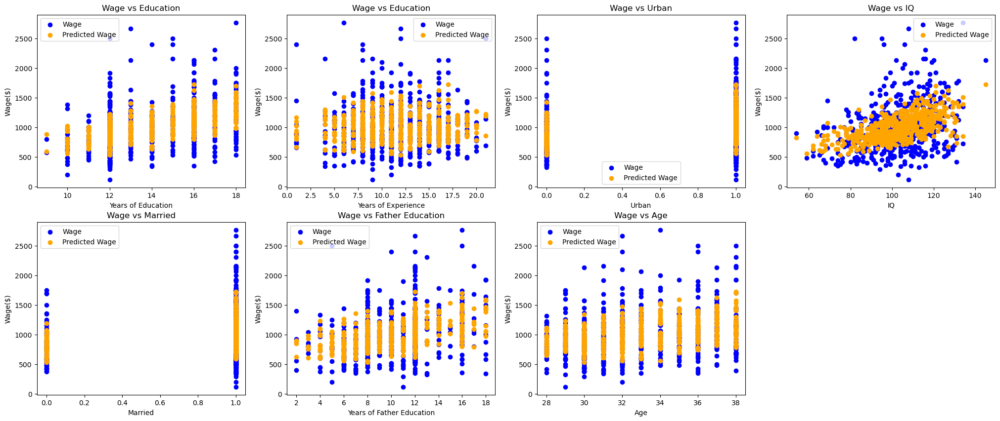

In [683]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,4,1)
ax2 = fig.add_subplot(2,4,2)
ax3 = fig.add_subplot(2,4,3)
ax4 = fig.add_subplot(2,4,4)
ax5 = fig.add_subplot(2,4,5)
ax6 = fig.add_subplot(2,4,6)
ax7 = fig.add_subplot(2,4,7)

ax1.scatter(train['educ'], train['wage'], c='blue', label='Wage')
ax1.scatter(train['educ'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax1.legend()
ax1.set_title("Wage vs Education")
ax1.set_xlabel('Years of Education')
ax1.set_ylabel('Wage($)')

ax2.scatter(train['exper'], train['wage'], c='blue', label='Wage')
ax2.scatter(train['exper'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax2.legend()
ax2.set_title("Wage vs Education")
ax2.set_xlabel('Years of Experience')
ax2.set_ylabel('Wage($)')

ax3.scatter(train['urban'], train['wage'], c='blue', label='Wage')
ax3.scatter(train['urban'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax3.legend()
ax3.set_title("Wage vs Urban")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Wage($)')

ax4.scatter(train['IQ'], train['wage'], c='blue', label='Wage')
ax4.scatter(train['IQ'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax4.legend()
ax4.set_title("Wage vs IQ")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Wage($)')

ax5.scatter(train['married'], train['wage'], c='blue', label='Wage')
ax5.scatter(train['married'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax5.legend()
ax5.set_title("Wage vs Married")
ax5.set_xlabel('Married')
ax5.set_ylabel('Wage($)')

ax6.scatter(train['feduc'], train['wage'], c='blue', label='Wage')
ax6.scatter(train['feduc'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax6.legend()
ax6.set_title("Wage vs Father Education")
ax6.set_xlabel('Years of Father Education')
ax6.set_ylabel('Wage($)')

ax7.scatter(train['age'], train['wage'], c='blue', label='Wage')
ax7.scatter(train['age'], TS_lwage_IQ1, c='orange', label='Predicted Wage')
ax7.legend()
ax7.set_title("Wage vs Age")
ax7.set_xlabel('Age')
ax7.set_ylabel('Wage($)')

- large difference in range of true wage and predicted wage, bad performance for goodness of fit
- aligh with low adj R^2

#### Interaction - exper_south - FS3 - reduced model assessment

In [ ]:
# model_fs2_inter5 = smf.ols(formula='wage ~ exper + educ + urban + IQ + married + feduc + age + south + exper_south', data=train)
# reg_fs2_inter5 = model_fs2_inter5.fit(cov_type='HC0')
# resid_fs2_inter5 = reg_fs2_inter5.resid
# fitted_fs2_inter5 = reg_fs2_inter5.fittedvalues
# reg_fs2_inter5.summary()

Text(0.5, 0.98, 'Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')

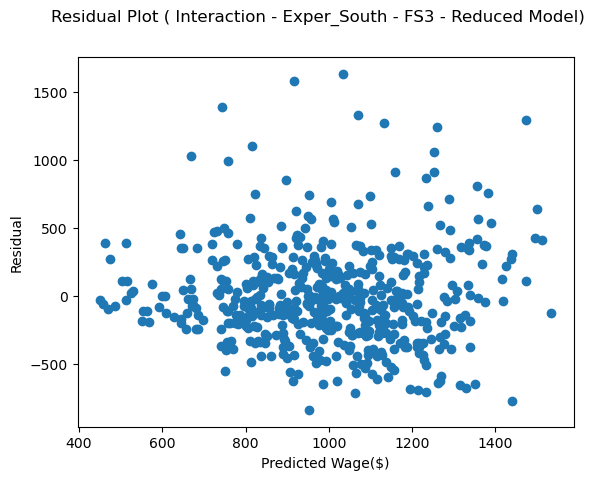

In [684]:
plt.scatter(fitted_fs2_inter5,resid_fs2_inter5)
plt.xlabel('Predicted Wage($)')
plt.ylabel('Residual')
plt.suptitle('Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')

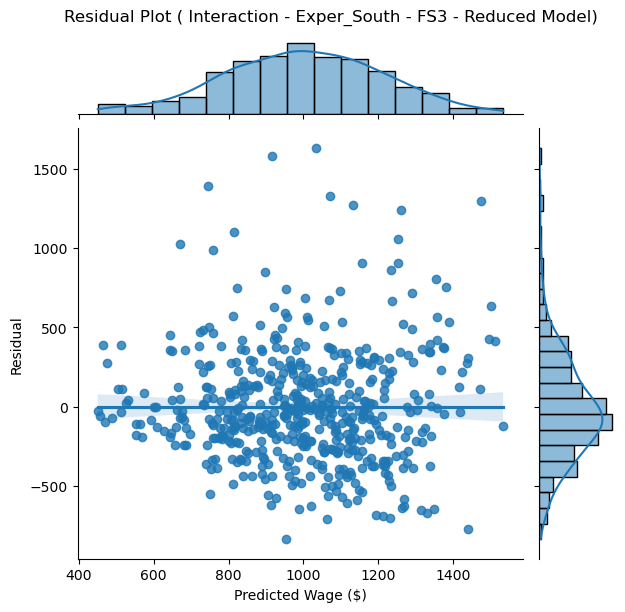

In [685]:
sns.jointplot(x=fitted_fs2_inter5, y=resid_fs2_inter5, kind="reg")
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.subplots_adjust(top= 0.93)
plt.suptitle('Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')
plt.show()

Text(0.5, 1.0, 'Lowess Curve of Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')

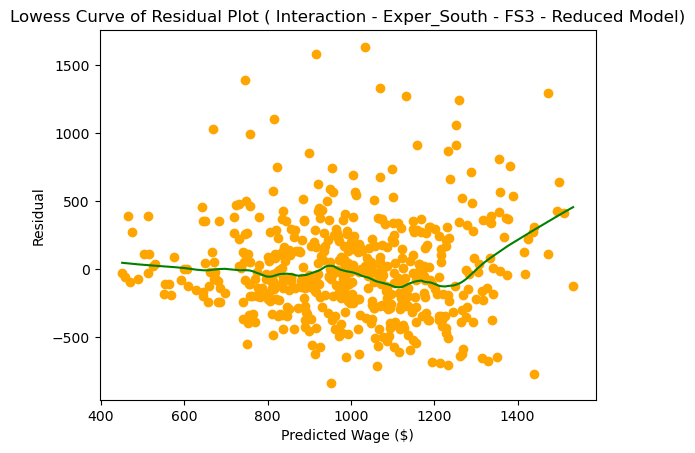

In [686]:
import statsmodels.api as sm
lowess = sm.nonparametric.lowess
plt.scatter(fitted_fs2_inter5,resid_fs2_inter5, color='orange')
z1 = lowess(resid_fs2_inter5, fitted_fs2_inter5, frac=1./5)
plt.plot(z1[:,0],z1[:,1],'green')

plt.xlabel('Predicted Wage ($)')
plt.ylabel('Residual')
plt.title('Lowess Curve of Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')

Text(0.5, 1.0, 'Squared Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')

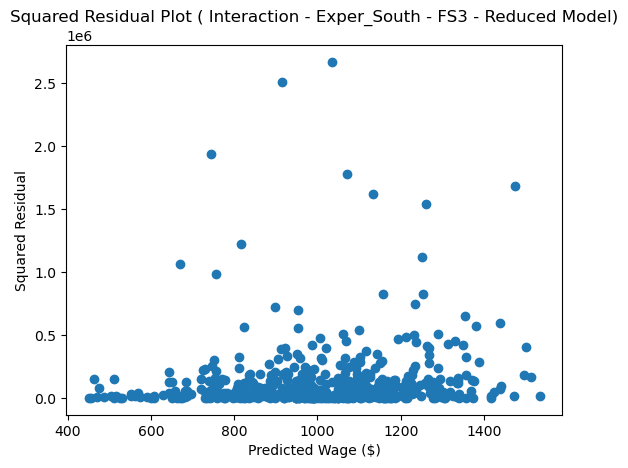

In [687]:
resid_fs2_inter5_squared=resid_fs2_inter5**2
plt.scatter(fitted_fs2_inter5,resid_fs2_inter5_squared)
plt.xlabel('Predicted Wage ($)')
plt.ylabel('Squared Residual')
plt.title('Squared Residual Plot ( Interaction - Exper_South - FS3 - Reduced Model)')

Text(0, 0.5, 'Residual')

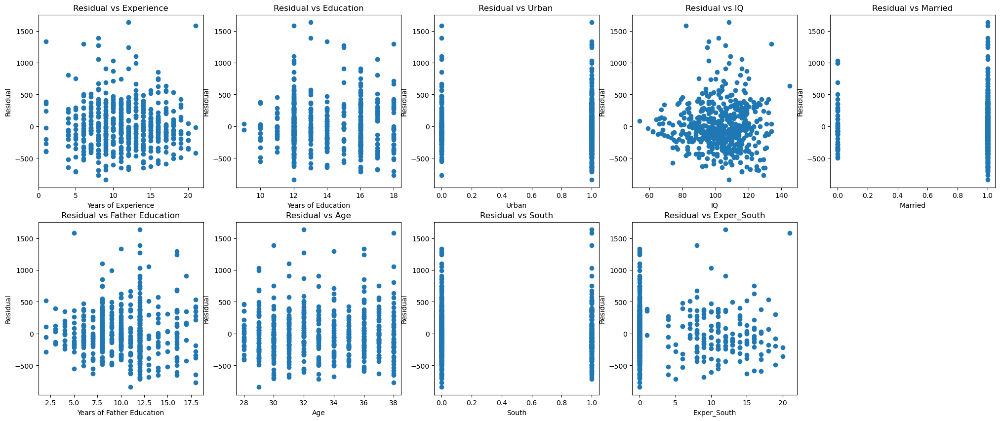

In [688]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,5,1)
ax2 = fig.add_subplot(2,5,2)
ax3 = fig.add_subplot(2,5,3)
ax4 = fig.add_subplot(2,5,4)
ax5 = fig.add_subplot(2,5,5)
ax6 = fig.add_subplot(2,5,6)
ax7 = fig.add_subplot(2,5,7)
ax8 = fig.add_subplot(2,5,8)
ax9 = fig.add_subplot(2,5,9)

ax1.scatter(train['exper'],resid_fs2_inter5)
ax1.set_title("Residual vs Experience")
ax1.set_xlabel('Years of Experience')
ax1.set_ylabel('Residual')

ax2.scatter(train['educ'], resid_fs2_inter5)
ax2.set_title("Residual vs Education")
ax2.set_xlabel('Years of Education')
ax2.set_ylabel('Residual')

ax3.scatter(train['urban'], resid_fs2_inter5)
ax3.set_title("Residual vs Urban ")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Residual')

ax4.scatter(train['IQ'], resid_fs2_inter5)
ax4.set_title("Residual vs IQ")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Residual')

ax5.scatter(train['married'], resid_fs2_inter5)
ax5.set_title("Residual vs Married")
ax5.set_xlabel('Married')
ax5.set_ylabel('Residual')

ax6.scatter(train['feduc'], resid_fs2_inter5)
ax6.set_title("Residual vs Father Education")
ax6.set_xlabel('Years of Father Education')
ax6.set_ylabel('Residual')

ax7.scatter(train['age'], resid_fs2_inter5)
ax7.set_title("Residual vs Age")
ax7.set_xlabel('Age')
ax7.set_ylabel('Residual')

ax8.scatter(train['south'], resid_fs2_inter5)
ax8.set_title("Residual vs South")
ax8.set_xlabel('South')
ax8.set_ylabel('Residual')

ax9.scatter(train['exper_south'], resid_fs2_inter5)
ax9.set_title("Residual vs Exper_South")
ax9.set_xlabel('Exper_South')
ax9.set_ylabel('Residual')

Text(0, 0.5, 'Residual')

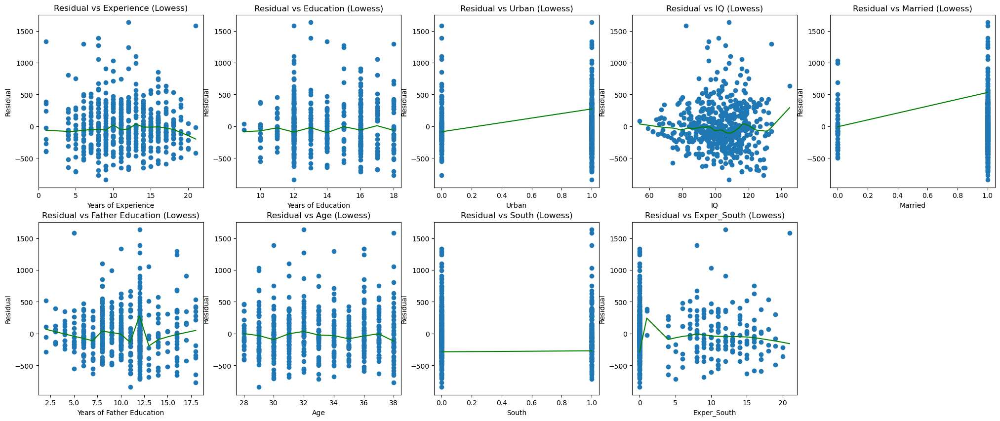

In [689]:
fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,5,1)
ax2 = fig.add_subplot(2,5,2)
ax3 = fig.add_subplot(2,5,3)
ax4 = fig.add_subplot(2,5,4)
ax5 = fig.add_subplot(2,5,5)
ax6 = fig.add_subplot(2,5,6)
ax7 = fig.add_subplot(2,5,7)
ax8 = fig.add_subplot(2,5,8)
ax9 = fig.add_subplot(2,5,9)

ax1.scatter(train['exper'], resid_fs2_inter5)
z1 = lowess(resid_fs2_inter5, train['exper'], frac=1./5)
ax1.plot(z1[:,0],z1[:,1],'green')
ax1.set_title("Residual vs Experience (Lowess)")
ax1.set_xlabel('Years of Experience')
ax1.set_ylabel('Residual')

ax2.scatter(train['educ'],resid_fs2_inter5)
z2 = lowess(resid_fs2_inter5, train['educ'], frac=1./5)
ax2.plot(z2[:,0],z2[:,1],'green')
ax2.set_title("Residual vs Education (Lowess)")
ax2.set_xlabel('Years of Education')
ax2.set_ylabel('Residual')

ax3.scatter(train['urban'], resid_fs2_inter5)
z3 = lowess(resid_fs2_inter5, train['urban'], frac=1./5)
ax3.plot(z3[:,0],z3[:,1],'green')
ax3.set_title("Residual vs Urban (Lowess)")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Residual')

ax4.scatter(train['IQ'], resid_fs2_inter5)
z4 = lowess(resid_fs2_inter5, train['IQ'], frac=1./5)
ax4.plot(z4[:,0],z4[:,1],'green')
ax4.set_title("Residual vs IQ (Lowess)")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Residual')

ax5.scatter(train['married'], resid_fs2_inter5)
z5 = lowess(resid_fs2_inter5, train['married'], frac=1./5)
ax5.plot(z5[:,0],z5[:,1],'green')
ax5.set_title("Residual vs Married (Lowess)")
ax5.set_xlabel('Married')
ax5.set_ylabel('Residual')

ax6.scatter(train['feduc'], resid_fs2_inter5)
z6 = lowess(resid_fs2_inter5, train['feduc'], frac=1./5)
ax6.plot(z6[:,0],z6[:,1],'green')
ax6.set_title("Residual vs Father Education (Lowess)")
ax6.set_xlabel('Years of Father Education')
ax6.set_ylabel('Residual')

ax7.scatter(train['age'], resid_fs2_inter5)
z7 = lowess(resid_fs2_inter5, train['age'], frac=1./5)
ax7.plot(z7[:,0],z7[:,1],'green')
ax7.set_title("Residual vs Age (Lowess)")
ax7.set_xlabel('Age')
ax7.set_ylabel('Residual')

ax8.scatter(train['south'], resid_fs2_inter5)
z8 = lowess(resid_fs2_inter5, train['south'], frac=1./5)
ax8.plot(z8[:,0],z8[:,1],'green')
ax8.set_title("Residual vs South (Lowess)")
ax8.set_xlabel('South')
ax8.set_ylabel('Residual')

ax9.scatter(train['exper_south'], resid_fs2_inter5)
z9 = lowess(resid_fs2_inter5, train['exper_south'], frac=1./5)
ax9.plot(z9[:,0],z9[:,1],'green')
ax9.set_title("Residual vs Exper_South (Lowess)")
ax9.set_xlabel('Exper_South')
ax9.set_ylabel('Residual')

In [690]:
train[['exper', 'educ', 'urban', 'IQ', 'married', 'feduc', 'age', 'south', 'exper_south']].corr()

,exper,educ,urban,IQ,married,feduc,age,south,exper_south
exper,1.000000,-0.434877,-0.059788,-0.213809,0.070744,-0.248742,0.469856,-0.053001,0.182541
educ,-0.434877,1.000000,0.125816,0.533993,-0.017682,0.430178,0.058855,-0.090896,-0.188581
urban,-0.059788,0.125816,1.000000,0.079964,-0.047287,0.135768,-0.023418,-0.145016,-0.111809
IQ,-0.213809,0.533993,0.079964,1.000000,0.017629,0.342669,-0.027972,-0.174662,-0.202685
married,0.070744,-0.017682,-0.047287,0.017629,1.000000,0.006229,0.070750,0.005519,0.033999
feduc,-0.248742,0.430178,0.135768,0.342669,0.006229,1.000000,-0.080866,-0.159811,-0.219925
age,0.469856,0.058855,-0.023418,-0.027972,0.070750,-0.080866,1.000000,-0.053355,0.051083
south,-0.053001,-0.090896,-0.145016,-0.174662,0.005519,-0.159811,-0.053355,1.000000,0.911239
exper_south,0.182541,-0.188581,-0.111809,-0.202685,0.033999,-0.219925,0.051083,0.911239,1.000000


- apart from pairs of regressors we already discusses before, here, due to the interaction effect, the south and exper_south has really high correlation, which is close to 1
- we will use SLR to assess r^2 of it
- but it is normal for the present of multicollinearity here because we add the interaction effect

In [691]:
model_rank3_col1 = smf.ols(formula='south ~ exper_south', data= train)
reg_rank3_col1 = model_rank3_col1.fit()
reg_rank3_col1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                  south   R-squared:                       0.830
Model:                            OLS   Adj. R-squared:                  0.830
Method:                 Least Squares   F-statistic:                     2555.
Date:                Fri, 24 May 2024   Prob (F-statistic):          3.11e-203
Time:                        06:37:08   Log-Likelihood:                 120.59
No. Observations:                 524   AIC:                            -237.2
Df Residuals:                     522   BIC:                            -228.7
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
===============================================================================
                  coef    std err          t      P>|t|      [0.025      0.975]
-------------------------------------------------------------------------------
Intercept       0.0544      0.010      5.479      0.000       0.035       0.074
exper_south     0.0746      0.001     50.547      0.000       0.072       0.077
==============================================================================
Omnibus:                      169.699   Durbin-Watson:                   1.993
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              582.773
Skew:                           1.489   Prob(JB):                    2.83e-127
Kurtosis:                       7.222   Cond. No.                         7.99
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
"""

- R^2 of SLR containing south and exper_south is really high here, but not perfect collinearity, so it will not be a problem in our model

Assess goodness of fit:

- firstly, the low adj R^2 already show the bad performance

Text(0, 0.5, 'Wage($)')

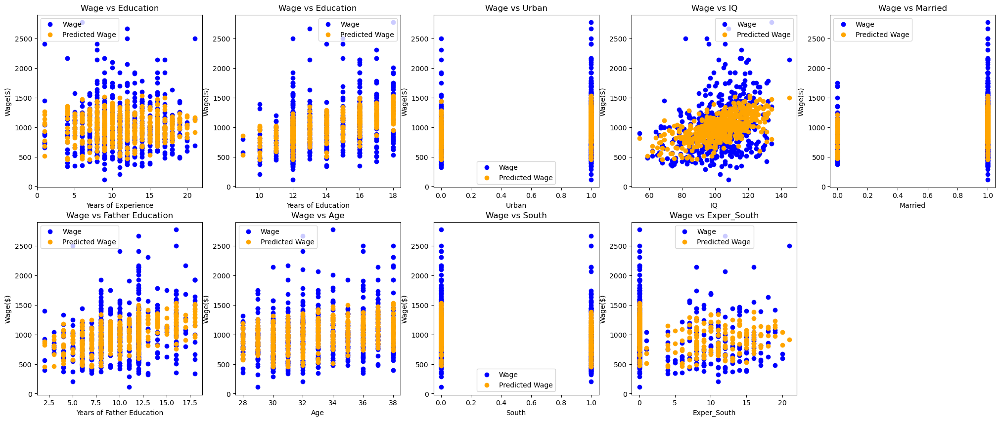

In [693]:
# model_fs2_inter5 = smf.ols(formula='wage ~ exper + educ + urban + IQ + married + feduc + age + south + exper_south', data=train)


fig = plt.figure(figsize=(25,10))
ax1 = fig.add_subplot(2,5,1)
ax2 = fig.add_subplot(2,5,2)
ax3 = fig.add_subplot(2,5,3)
ax4 = fig.add_subplot(2,5,4)
ax5 = fig.add_subplot(2,5,5)
ax6 = fig.add_subplot(2,5,6)
ax7 = fig.add_subplot(2,5,7)
ax8 = fig.add_subplot(2,5,8)
ax9 = fig.add_subplot(2,5,9)

ax1.scatter(train['exper'], train['wage'], c='blue', label='Wage')
ax1.scatter(train['exper'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax1.legend()
ax1.set_title("Wage vs Education")
ax1.set_xlabel('Years of Experience')
ax1.set_ylabel('Wage($)')

ax2.scatter(train['educ'], train['wage'], c='blue', label='Wage')
ax2.scatter(train['educ'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax2.legend()
ax2.set_title("Wage vs Education")
ax2.set_xlabel('Years of Education')
ax2.set_ylabel('Wage($)')

ax3.scatter(train['urban'], train['wage'], c='blue', label='Wage')
ax3.scatter(train['urban'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax3.legend()
ax3.set_title("Wage vs Urban")
ax3.set_xlabel('Urban')
ax3.set_ylabel('Wage($)')

ax4.scatter(train['IQ'], train['wage'], c='blue', label='Wage')
ax4.scatter(train['IQ'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax4.legend()
ax4.set_title("Wage vs IQ")
ax4.set_xlabel('IQ')
ax4.set_ylabel('Wage($)')

ax5.scatter(train['married'], train['wage'], c='blue', label='Wage')
ax5.scatter(train['married'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax5.legend()
ax5.set_title("Wage vs Married")
ax5.set_xlabel('Married')
ax5.set_ylabel('Wage($)')

ax6.scatter(train['feduc'], train['wage'], c='blue', label='Wage')
ax6.scatter(train['feduc'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax6.legend()
ax6.set_title("Wage vs Father Education")
ax6.set_xlabel('Years of Father Education')
ax6.set_ylabel('Wage($)')

ax7.scatter(train['age'], train['wage'], c='blue', label='Wage')
ax7.scatter(train['age'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax7.legend()
ax7.set_title("Wage vs Age")
ax7.set_xlabel('Age')
ax7.set_ylabel('Wage($)')

ax8.scatter(train['south'], train['wage'], c='blue', label='Wage')
ax8.scatter(train['south'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax8.legend()
ax8.set_title("Wage vs South")
ax8.set_xlabel('South')
ax8.set_ylabel('Wage($)')

ax9.scatter(train['exper_south'], train['wage'], c='blue', label='Wage')
ax9.scatter(train['exper_south'], fitted_fs2_inter5, c='orange', label='Predicted Wage')
ax9.legend()
ax9.set_title("Wage vs Exper_South")
ax9.set_xlabel('Exper_South')
ax9.set_ylabel('Wage($)')


- large difference in range of wage and predicted wage given different regressors
- bad performance, alight with low adjusted R^2

### Predicted value using test data

In [634]:
test['exper_south'] = test['exper'] * test['south']

##Log wage vs IQ - FS2 - reduced model(Duan) - formula='lwage ~ educ + exper + urban + IQ + married + south + age + feduc'
yp_r1 = reg_fs4_r1.predict({'educ': test['educ'], 'exper': test['exper'], 'urban': test['urban'], 'IQ': test['IQ'], 'married': test['married'], 'south': test['south'], 'age': test['age'], 'feduc': test['feduc']})

##Log wage vs IQ - FS1 - reduced model(Duan) - formula='lwage ~ educ + exper + urban + IQ + married + feduc + age'
yp_r2 = reg_fs2_tran5.predict({'educ': test['educ'], 'exper': test['exper'], 'urban': test['urban'], 'IQ': test['IQ'], 'married': test['married'], 'feduc': test['feduc'], 'age': test['age']})

## Interaction - exper_south - FS3 - reduced model - formula='wage ~ exper + educ + urban + IQ + married + feduc + age + south + exper_south'
yp_r3 = reg_fs2_inter5.predict({'exper': test['exper'], 'educ': test['educ'], 'urban': test['urban'], 'IQ': test['IQ'], 'married': test['married'], 'feduc': test['feduc'], 'age': test['age'], 'south': test['south'], 'exper_south':test['exper_south']})

In [635]:
print(yp_r1)

0      6.998370
1      6.839888
2      6.435953
3      6.935449
4      7.169577
         ...   
126    6.793417
127    6.936279
128    6.700611
129    6.794160
130    6.846023
Length: 131, dtype: float64


### Forecast R^2

#### predicted value correction - Log wage vs IQ - FS2 - reduced model(Duan)

In [637]:
resid_t1 = test['lwage'] - yp_r1

In [639]:
eres_test1 = np.exp(resid_t1) #residual for Log wage vs IQ - FS2 - reduced model(Duan)

n = 131

fp_test1 = sum(eres_test1)/n #Duan

fp_test1

1.0537508998754503

In [642]:
TS_lwage_IQ11 = np.exp(yp_r1) * fp_test1 #Duan

In [643]:
print(TS_lwage_IQ11)

0      1153.695939
1       984.608605
2       657.410557
3      1083.340780
4      1369.132962
          ...     
126     939.900085
127    1084.240281
128     856.596384
129     940.598014
130     990.667268
Length: 131, dtype: float64


In [649]:
# M-Z regression for  Log wage vs IQ - FS2 - reduced model(Duan)
formula='wage ~ TS_lwage_IQ11'
ols_t1 = smf.ols(formula=formula, data=test).fit()
ols_t1.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.173
Model:                            OLS   Adj. R-squared:                  0.167
Method:                 Least Squares   F-statistic:                     27.01
Date:                Fri, 24 May 2024   Prob (F-statistic):           7.71e-07
Time:                        05:40:10   Log-Likelihood:                -949.72
No. Observations:                 131   AIC:                             1903.
Df Residuals:                     129   BIC:                             1909.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       169.3349    153.063      1.106      0.271    -133.505     472.174
TS_lwage_IQ11     0.8165      0.157      5.197      0.000       0.506       1.127
==============================================================================
Omnibus:                       81.759   Durbin-Watson:                   2.029
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              595.912
Skew:                           2.058   Prob(JB):                    3.98e-130
Kurtosis:                      12.604   Cond. No.                     4.97e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.97e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### predicted value correction - Log wage vs IQ - FS1 - reduced model(Duan)

In [651]:
resid_t2 = test['lwage'] - yp_r2

In [652]:
eres_test2 = np.exp(resid_t2) #residual for Log wage vs IQ - FS1 - reduced model(Duan)

n = 131

fp_test2 = sum(eres_test2)/n #Duan

fp_test2

1.052826127643328

In [653]:
TS_lwage_IQ22 = np.exp(yp_r2) * fp_test2

In [654]:
print(TS_lwage_IQ22)

0      1129.729068
1       957.738186
2       634.658648
3      1056.600684
4      1334.619362
          ...     
126    1006.918663
127    1165.372803
128     919.990973
129    1002.320147
130    1061.861586
Length: 131, dtype: float64


In [655]:
# M-Z regression for  Log wage vs IQ - FS1 - reduced model(Duan)
formula='wage ~ TS_lwage_IQ22'
ols_t2 = smf.ols(formula=formula, data=test).fit()
ols_t2.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.198
Model:                            OLS   Adj. R-squared:                  0.191
Method:                 Least Squares   F-statistic:                     31.77
Date:                Fri, 24 May 2024   Prob (F-statistic):           1.04e-07
Time:                        05:40:25   Log-Likelihood:                -947.75
No. Observations:                 131   AIC:                             1900.
Df Residuals:                     129   BIC:                             1905.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
=================================================================================
                    coef    std err          t      P>|t|      [0.025      0.975]
---------------------------------------------------------------------------------
Intercept       118.3827    150.368      0.787      0.433    -179.124     415.889
TS_lwage_IQ22     0.8721      0.155      5.636      0.000       0.566       1.178
==============================================================================
Omnibus:                       85.093   Durbin-Watson:                   2.042
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              699.643
Skew:                           2.115   Prob(JB):                    1.19e-152
Kurtosis:                      13.502   Cond. No.                     4.95e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 4.95e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

#### Interaction - exper_south - FS3

In [656]:
# M-Z regression for Inter-educ-age model forecasts
formula='wage ~ yp_r3'
ols_t3 = smf.ols(formula=formula, data=test).fit()
ols_t3.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                            OLS Regression Results                            
==============================================================================
Dep. Variable:                   wage   R-squared:                       0.185
Model:                            OLS   Adj. R-squared:                  0.179
Method:                 Least Squares   F-statistic:                     29.25
Date:                Fri, 24 May 2024   Prob (F-statistic):           2.98e-07
Time:                        05:41:06   Log-Likelihood:                -948.79
No. Observations:                 131   AIC:                             1902.
Df Residuals:                     129   BIC:                             1907.
Df Model:                           1                                         
Covariance Type:            nonrobust                                         
==============================================================================
                 coef    std err          t      P>|t|      [0.025      0.975]
------------------------------------------------------------------------------
Intercept    149.3978    150.890      0.990      0.324    -149.142     447.938
yp_r3          0.8227      0.152      5.408      0.000       0.522       1.124
==============================================================================
Omnibus:                       81.774   Durbin-Watson:                   2.076
Prob(Omnibus):                  0.000   Jarque-Bera (JB):              624.989
Skew:                           2.036   Prob(JB):                    1.93e-136
Kurtosis:                      12.896   Cond. No.                     5.03e+03
==============================================================================

Notes:
[1] Standard Errors assume that the covariance matrix of the errors is correctly specified.
[2] The condition number is large, 5.03e+03. This might indicate that there are
strong multicollinearity or other numerical problems.
"""

##### RMSFE

In [657]:
## Log wage vs IQ - FS2 - reduced model(Duan)
(sum((test['wage']-TS_lwage_IQ11)**2)/len(TS_lwage_IQ11))**0.5

342.4864073079375

In [658]:
## Log wage vs IQ - FS1 - reduced model(Duan)
(sum((test['wage']-TS_lwage_IQ22)**2)/len(TS_lwage_IQ22))**0.5

336.46648062444314

In [659]:
## Interaction - exper_south - FS3
(sum((test['wage']-yp_r3)**2)/len(yp_r3))**0.5

340.7767588703878

##### MAFE

In [660]:
## Log wage vs IQ - FS2 - reduced model(Duan)
sum(abs(test['wage']-TS_lwage_IQ11))/len(TS_lwage_IQ11)

246.77184732547963

In [661]:
## Log wage vs IQ - FS1 - reduced model(Duan)
sum(abs(test['wage']-TS_lwage_IQ22))/len(TS_lwage_IQ22)

241.29631809509104

In [673]:
## Interaction - exper_south - FS3
sum(abs(test['wage']-yp_r3))/len(yp_r3)

245.1750141242699

| Model                                      |  RMSFE |  MAFE  | Forecast $R^2$ |  p  |
|--------------------------------------------|--------|--------|----------------|-----|
| Log wage vs IQ - FS2 - reduced model(Duan) | 342.486| 246.772|     17.3       |  8  |
| Log wage vs IQ - FS1 - reduced model(Duan) | 336.466| 241.296|     19.8       |  7  |
| Interaction - exper_south - FS3            | 340.777| 245.175|     18.5       |  9  |

- rank 1: Log wage vs IQ - FS1 - reduced model(Duan)
- rank 2: Interaction - exper_south - FS3
- rank 3: Log wage vs IQ - FS2 - reduced model(Duan)	

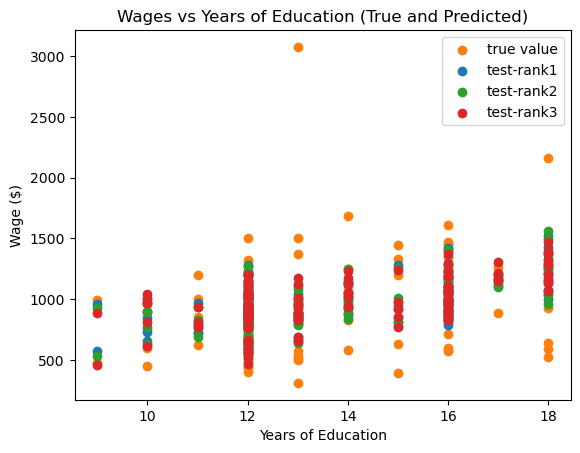

In [670]:
plt.scatter(test['educ'], test['wage'], color=tableau[1], label = 'true value') #orange
plt.scatter(test['educ'], TS_lwage_IQ11, label = 'test-rank1') #blue
plt.scatter(test['educ'], TS_lwage_IQ22, color=tableau[2], label = 'test-rank2') #green
plt.scatter(test['educ'], yp_r3, color=tableau[3], label = 'test-rank3') #red
plt.xlabel('Years of Education')
plt.ylabel('Wage ($)')
plt.title('Wages vs Years of Education (True and Predicted)')
plt.legend()

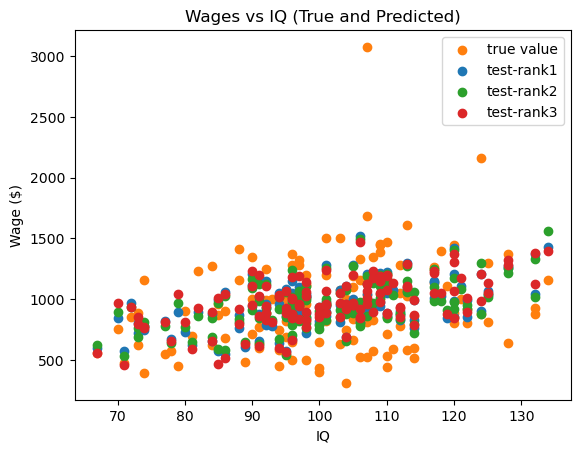

In [669]:
plt.scatter(test['IQ'], test['wage'], color=tableau[1], label = 'true value') #orange
plt.scatter(test['IQ'], TS_lwage_IQ11, label = 'test-rank1') #blue
plt.scatter(test['IQ'], TS_lwage_IQ22, color=tableau[2], label = 'test-rank2') #green
plt.scatter(test['IQ'], yp_r3, color=tableau[3], label = 'test-rank3') #red
plt.xlabel('IQ')
plt.ylabel('Wage ($)')
plt.title('Wages vs IQ (True and Predicted)')
plt.legend()

- in these scatter plots, these three models show similar shape(but the blue one is a little bit better which is the rank 1), this is align with similar value of these three models above
- but it is still hard to have a rank through the scatter plot itself, so we keep the idea of ranking from previous table of value